Index. To update index run this [cell](#id_table_content_update_code).
<br><br>
<div id="table-of-content"></div>

# Imports

In [3]:
import numpy as np
import pandas as pd

import copy
import glob
import warnings

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 20)

from functools import partial
from itertools import combinations
from sklearn.decomposition import PCA

from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

# ------------
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from functions.matplotlib_plotBox01 import matplotlib_plotBox01
from functions.plot_freq import plot_freq
from functions.plot_statisticsEachCat import plot_statisticsEachCat
from functions.plot_hist_log import plot_hist_log
from functions.plot_hist2d import plot_hist2d
from functions.plot_cos2 import plot_cos2
from functions.plot_cos2 import plot_cos2_coord
from functions.plot_pca import plot_pca_variance
from functions.plot_pca import plot_PCA_coef_portion
from functions.plot_confussion_matrix_F1score_matrix_ROC_curve import plot_confussion_matrix_F1score_matrix_ROC_curve
from functions.plot_feature_importances import plot_feature_importances
from functions.plot_tree_graphviz import plot_tree_graphviz
from functions.plot_validation_curve import plot_validation_curve

# ------------
from IPython.display import display, HTML, display_html
from functions.display_htmlFcn import display_htmlFcn

from functions.hideVals import hideVals
from functions.format_float import format_float
from functions.generate_random_color import generate_random_color
from functions.get_df_info import get_df_info

# ------------
import os
from functions.dump_or_load import dump_or_load
pickle_folder = "./databases/pickle/"

from functions.get_holidays import get_holidays
from functions.get_tripdata import get_tripdata

from functions.get_oversampling import get_oversampling
from functions.get_X_y import get_X_y
from functions.get_ROC_meshgrid import get_ROC_meshgrid


# ------------
from functions.HTML_index_generate_v2 import HTML_index_generate_v2
from IPython.display import display, Javascript

display(Javascript(HTML_index_generate_v2(IndexId="#table-of-content")))

<IPython.core.display.Javascript object>

## Day of week & working day

### Holiday

In [3]:
import holidays
dict(holidays.US(years=[2023], state='NY'))

{datetime.date(2023, 1, 1): "New Year's Day",
 datetime.date(2023, 1, 2): "New Year's Day (Observed)",
 datetime.date(2023, 1, 16): 'Martin Luther King Jr. Day',
 datetime.date(2023, 2, 12): "Lincoln's Birthday",
 datetime.date(2023, 2, 13): "Lincoln's Birthday (Observed)",
 datetime.date(2023, 2, 15): 'Susan B. Anthony Day',
 datetime.date(2023, 2, 20): "Washington's Birthday",
 datetime.date(2023, 5, 29): 'Memorial Day',
 datetime.date(2023, 6, 19): 'Juneteenth National Independence Day',
 datetime.date(2023, 7, 4): 'Independence Day',
 datetime.date(2023, 9, 4): 'Labor Day',
 datetime.date(2023, 10, 9): 'Columbus Day',
 datetime.date(2023, 11, 7): 'Election Day',
 datetime.date(2023, 11, 11): 'Veterans Day',
 datetime.date(2023, 11, 10): 'Veterans Day (Observed)',
 datetime.date(2023, 11, 23): 'Thanksgiving',
 datetime.date(2023, 12, 25): 'Christmas Day'}

### Day of week & weekend

In [4]:
# Get the day of the week names
day_of_week_names = pd.Series(pd.date_range('2023-01-01', periods=7)).dt.day_name()
day_of_week_int = pd.Series(pd.date_range('2023-01-01', periods=7)).dt.dayofweek
day_of_week_dict = {day: name for day, name in zip(day_of_week_int, day_of_week_names)}
dict(sorted(day_of_week_dict.items()))

{0: 'Monday',
 1: 'Tuesday',
 2: 'Wednesday',
 3: 'Thursday',
 4: 'Friday',
 5: 'Saturday',
 6: 'Sunday'}

In [5]:
from functions.get_day_of_week_and_working_day import get_day_of_week_and_working_day

# Daily trips

## Daily weather

NOAAA: https://www.ncei.noaa.gov/cdo-web/datasets

...tiene DailySummaries:

Documentation (que significa y valores toma cada columna): https://www.ncei.noaa.gov/pub/data/cdo/documentation/GHCND_documentation.pdf. También en URL al txt de <code>functions.weather_noaa_daily_column_descriptions</code>.

In [6]:
# df_weather = pd.read_csv('./databases/weather_NOAAA_DailySummaries_240101_240302.csv', sep=',', index_col=False) # 3 months 2024
df_weather = pd.read_csv('./databases/weather_NOAAA_DailySummaries_230101_231231.csv', 
                         sep=',', index_col=False, low_memory=False) # year 2023

In [7]:
df_weather['DATE'] = pd.to_datetime(df_weather['DATE'], format='%Y-%m-%d').dt.floor('D')

In [8]:
columns_station = ['NAME','LATITUDE','LONGITUDE','ELEVATION']
df_weather_unique_stations = df_weather.drop_duplicates(subset='STATION', keep='first', inplace=False)\
[['STATION'] + columns_station]
df_weather.drop(columns=columns_station, inplace=True)
df_weather_unique_stations.set_index('STATION', inplace=True)
df_weather_unique_stations.head(3)

,NAME,LATITUDE,LONGITUDE,ELEVATION
STATION,,,,
US1NJUN0028,"SPRINGFIELD TWP 0.7 NNE, NJ US",40.708904,-74.321518,37.5
US1NYSF0158,"LINDENHURST 1.0 NE, NY US",40.695085,-73.358045,5.2
USW00014734,"NEWARK LIBERTY INTERNATIONAL AIRPORT, NJ US",40.682750,-74.169270,1.9


In [9]:
filename = pickle_folder + "df_weather_unique_stations.pkl"
dump_or_load(filename, var=df_weather_unique_stations, dump=True)

Saved  <_io.BufferedWriter name='./databases/pickle/df_weather_unique_stations.pkl'>


In [10]:
df_weather.head(3)

,STATION,DATE,AWND,AWND_ATTRIBUTES,DAPR,DAPR_ATTRIBUTES,MDPR,MDPR_ATTRIBUTES,PGTM,PGTM_ATTRIBUTES,PRCP,PRCP_ATTRIBUTES,SNOW,SNOW_ATTRIBUTES,SNWD,SNWD_ATTRIBUTES,TAVG,TAVG_ATTRIBUTES,TMAX,TMAX_ATTRIBUTES,TMIN,TMIN_ATTRIBUTES,TOBS,TOBS_ATTRIBUTES,WDF2,WDF2_ATTRIBUTES,WDF5,WDF5_ATTRIBUTES,WESD,WESD_ATTRIBUTES,WESF,WESF_ATTRIBUTES,WSF2,WSF2_ATTRIBUTES,WSF5,WSF5_ATTRIBUTES,WT01,WT01_ATTRIBUTES,WT02,WT02_ATTRIBUTES,WT03,WT03_ATTRIBUTES,WT04,WT04_ATTRIBUTES,WT05,WT05_ATTRIBUTES,WT06,WT06_ATTRIBUTES,WT08,WT08_ATTRIBUTES,WT11,WT11_ATTRIBUTES
0,US1NJUN0028,2023-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.9,",,N",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,US1NJUN0028,2023-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,",,N",0.0,",,N",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,US1NJUN0028,2023-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.8,",,N",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
len(df_weather), len(df_weather['STATION'].unique())

(32825, 119)

Días con cero registros:
- si son mas del 10% (arbitrario) descarto la estación
- sino añado registros que faltan (con medidas meteo NaN)

In [12]:
df_weather.groupby('STATION')['DATE'].count().values

array([295,   1, 356, 362, 333, 349, 360, 197, 329, 347, 270, 251, 365,
       234, 355, 344, 364, 255, 312, 253, 137,  68, 359, 249, 365, 359,
        96, 365, 293, 279, 315, 338, 150, 357, 351, 357, 342, 364,  57,
       354, 345,   6, 328,  99, 365, 105, 365, 341, 163, 365, 126,  98,
         1, 353, 140,  54, 361, 342, 298, 365, 247, 359, 318,  78, 198,
       356, 365,  17, 296, 361, 163,  22, 243,  54, 360, 357, 354, 357,
       351,  59, 365, 233, 199,  37, 365, 365, 333, 279, 305, 340, 293,
       316, 332, 362,  46, 280, 365,  71, 329, 330, 294, 335, 365, 153,
       364, 365, 258, 363, 353, 362, 128, 365, 365, 365, 365, 365, 365,
       363, 365])

In [13]:
# unique_dates = set(df_weather['DATE'].unique())
unique_dates = set(np.datetime64(x).astype('datetime64[ns]') for x in df_weather['DATE'].unique()) 

df_weather_copy = copy.deepcopy(df_weather).reset_index(drop=True)
missing_rows = []  # Initialize a list to store missing rows for all stations

threshold = 10.

for station, num_dates in df_weather.groupby('STATION')['DATE'].count().items():    
    if ((num_dates / len(unique_dates)) <= ((100 - threshold)/100)): # remove that station
        df_weather_copy = df_weather_copy[df_weather_copy['STATION'] != station]
    else: # add missing rows: (station,date) pairs
        current_dates = df_weather[df_weather['STATION']==station]['DATE'].values
        missing_dates = list(unique_dates - set(current_dates))
        missing_rows.append(pd.DataFrame({'DATE': missing_dates, 'STATION': station}))
        
# Concatenate all missing rows at once
if missing_rows:
    df_weather_copy = pd.concat([df_weather_copy] + missing_rows, ignore_index=True)

df_weather = df_weather_copy.copy().reset_index(drop=True)

df_weather.groupby('STATION')['DATE'].count().values == len(df_weather) * [len(unique_dates)]

/tmp/ipykernel_43052/2212359061.py:19: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_weather_copy = pd.concat([df_weather_copy] + missing_rows, ignore_index=True)
/tmp/ipykernel_43052/2212359061.py:23: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  df_weather.groupby('STATION')['DATE'].count().values == len(df_weather) * [len(unique_dates)]


False

In [14]:
df_weather.groupby('STATION')['DATE'].count().values

array([365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365,
       365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365,
       365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365,
       365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365,
       365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365, 365])

In [15]:
len(unique_dates)

365

##### Dataset original

Cada par (STATION, DAY) existe:

In [16]:
len(df_weather)

23725

In [17]:
len(df_weather['STATION'].unique())

65

In [18]:
df_weather['STATION'].unique()

array(['USW00014734', 'USW00014732', 'US1NJBG0064', 'USC00308577',
       'USW00054743', 'US1NJMD0088', 'US1NJUN0017', 'US1NJPS0040',
       'USC00301309', 'US1NJUN0010', 'US1NJMN0104', 'US1NJPS0042',
       'USW00094789', 'USC00289187', 'US1NJMS0059', 'USC00284987',
       'US1NJBG0018', 'US1NJBG0017', 'US1NJBG0015', 'US1NYWC0018',
       'US1NJMS0106', 'US1NJMN0048', 'US1NJMS0102', 'US1NJHD0018',
       'US1NJES0019', 'US1NJES0018', 'USW00094728', 'US1NJMN0010',
       'US1NYRL0011', 'US1NJBG0023', 'USW00054787', 'US1NJMN0012',
       'US1NJMN0011', 'US1NJES0024', 'USC00283704', 'US1NJMD0045',
       'US1NJMD0043', 'US1NJPS0012', 'US1NYNS0065', 'US1NYRC0001',
       'US1NYNS0066', 'US1NYSF0089', 'US1NJBG0039', 'US1NJBG0030',
       'US1NYWC0034', 'US1NYWC0032', 'US1NYNS0070', 'US1NYQN0033',
       'US1NYNS0034', 'USW00094741', 'US1NJBG0043', 'USC00066655',
       'USW00094745', 'US1NJMD0104', 'US1NJMD0062', 'US1NJMS0011',
       'US1NYSF0092', 'US1NYKN0025', 'US1NJUN0039', 'US1NYNS00

In [19]:
len(df_weather), len(df_weather['STATION'].unique())*len(df_weather['DATE'].unique())

(23725, 23725)

In [20]:
from functions import weather_noaa_daily_column_descriptions
column_definitions = weather_noaa_daily_column_descriptions.main()

get_df_info(df_weather, column_definitions)[1]

Column,Non-Null Count,Percentage,Dtype,Description
STATION,23725,100.0 %,object,nan
DATE,23725,100.0 %,datetime64[ns],nan
PRCP,22942,96.7 %,float64,Precipitation (tenths of mm)
PRCP_ATTRIBUTES,22942,96.7 %,object,nan
SNOW,15587,65.7 %,float64,Snowfall (mm)
SNOW_ATTRIBUTES,15587,65.7 %,object,nan
SNWD_ATTRIBUTES,7675,32.3 %,object,nan
SNWD,7675,32.3 %,float64,Snow depth (mm)
TMIN_ATTRIBUTES,4725,19.9 %,object,nan
TMIN,4725,19.9 %,float64,Minimum temperature (tenths of degrees C) The other elements are:


Comprobar visualmente si NaNs son mas debidos a la estación que asiduamente coge pocos campos, ó a días concretos que no se registran datos. Parece ser debido mas a la estación que al día.

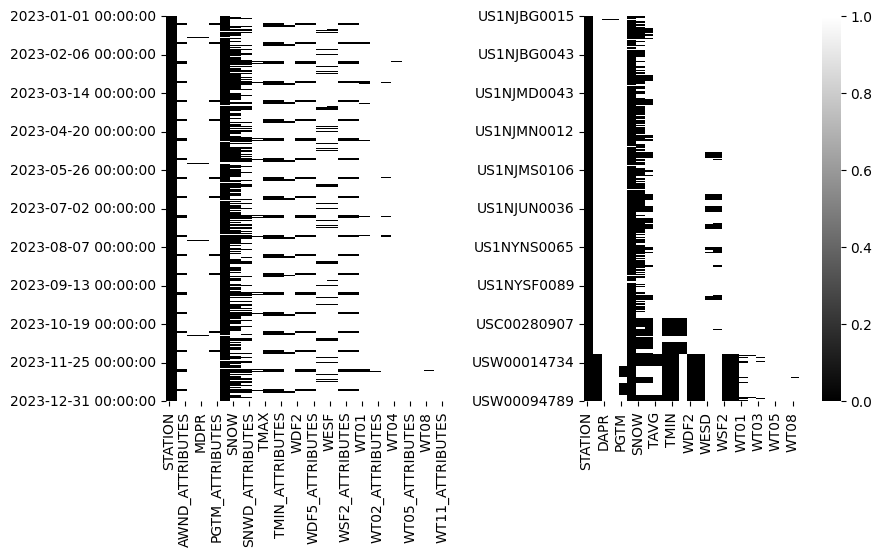

In [21]:
from matplotlib.colors import LinearSegmentedColormap

# Define the colors for the colormap
colors = [(0.0, 0.0, 0.0), (1.0, 1.0, 1.0)]  # Black to White

# Create a colormap using LinearSegmentedColormap
custom_cmap = LinearSegmentedColormap.from_list("CustomMap", colors)

fig, axs = plt.subplots(1, 2, figsize=(9, 5), gridspec_kw={'wspace': 0.5})
sorted_df_0 = df_weather.sort_values(by=["DATE", "STATION"])
sorted_df_1 = df_weather.sort_values(by=["STATION", "DATE"])
sns.heatmap(sorted_df_0.isnull(),cmap=custom_cmap, ax=axs[0], cbar=False)
sns.heatmap(sorted_df_1.isnull(),cmap=custom_cmap, ax=axs[1])

for [ax, sorted_df, col] in [[axs[0], sorted_df_0, "DATE"],[axs[1], sorted_df_1, "STATION"]]:
    # Set y-axis ticks to appear at specific intervals
    n = max(len(sorted_df) // 10, 1)  # Adjust the divisor to change the frequency of ticks
    yticklabels = sorted_df.iloc[::n][col]
    ax.set_yticks(range(0, len(sorted_df), n))
    ax.set_yticklabels(yticklabels, rotation=0)

Los campos WT* no son float, sino boolean, pero al tener NaN se hace casting a float:

In [22]:
for k in range(1,6):
    print(df_weather['WT0' + str(k)].unique())

[ 1. nan]
[nan  1.]
[nan  1.]
[nan  1.]
[nan  1.]


Para cada STATION mostramos la fila con menos datos nulos para seguidamente entenderlos:

In [23]:
# Grouping by 'STATION' and finding the row with the fewest NaN values in each group
result = df_weather.groupby('STATION').apply(lambda x: x.loc[x.isnull().sum(axis=1).idxmin()], include_groups=False)

# Sorting based on the number of NaNs in each row
result_sorted = result.loc[result.isnull().sum(axis=1).sort_values().index]
result_sorted.head(3)

,DATE,AWND,AWND_ATTRIBUTES,DAPR,DAPR_ATTRIBUTES,MDPR,MDPR_ATTRIBUTES,PGTM,PGTM_ATTRIBUTES,PRCP,PRCP_ATTRIBUTES,SNOW,SNOW_ATTRIBUTES,SNWD,SNWD_ATTRIBUTES,TAVG,TAVG_ATTRIBUTES,TMAX,TMAX_ATTRIBUTES,TMIN,TMIN_ATTRIBUTES,TOBS,TOBS_ATTRIBUTES,WDF2,WDF2_ATTRIBUTES,WDF5,WDF5_ATTRIBUTES,WESD,WESD_ATTRIBUTES,WESF,WESF_ATTRIBUTES,WSF2,WSF2_ATTRIBUTES,WSF5,WSF5_ATTRIBUTES,WT01,WT01_ATTRIBUTES,WT02,WT02_ATTRIBUTES,WT03,WT03_ATTRIBUTES,WT04,WT04_ATTRIBUTES,WT05,WT05_ATTRIBUTES,WT06,WT06_ATTRIBUTES,WT08,WT08_ATTRIBUTES,WT11,WT11_ATTRIBUTES
STATION,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
USW00014732,2023-06-14,5.1,",,W",NaN,NaN,NaN,NaN,NaN,NaN,9.9,",,W,2400",0.0,"T,,W,2400",0.0,",,W,2400",21.7,"H,,S",24.4,",,W",18.3,",,W",NaN,NaN,270.0,",,W",170.0,",,W",NaN,NaN,NaN,NaN,10.7,",,W",16.1,",,W",1.0,",,W",NaN,NaN,1.0,",,W",NaN,NaN,1.0,",,W",NaN,NaN,1.0,",,W",NaN,NaN
USW00094789,2023-04-01,7.9,",,W",NaN,NaN,NaN,NaN,NaN,NaN,5.6,",,W,2400",0.0,",,W,2400",0.0,",,W,2400",11.2,"H,,S",16.1,",,W",9.4,",,W",NaN,NaN,290.0,",,W",300.0,",,W",NaN,NaN,NaN,NaN,14.3,",,W",18.8,",,W",1.0,",,W",NaN,NaN,1.0,",,W",NaN,NaN,NaN,NaN,NaN,NaN,1.0,",,W",NaN,NaN
USW00094728,2023-07-04,0.3,",,W",NaN,NaN,NaN,NaN,NaN,NaN,16.0,",,W,2400",0.0,",,W,2400",0.0,",,W,2400",NaN,NaN,28.3,",,W",22.8,",,W",NaN,NaN,230.0,",,W",230.0,",,W",NaN,NaN,NaN,NaN,4.5,",,W",6.3,",,W",1.0,",,W",1.0,",,W",1.0,",,W",NaN,NaN,NaN,NaN,NaN,NaN,1.0,",,W",NaN,NaN


Documentation (que significa y valores toma cada columna): https://www.ncei.noaa.gov/pub/data/cdo/documentation/GHCND_documentation.pdf.

<blockquote>
Following this initial section of the record, all selected observations and flags are given in the following
order:
    
Observation(s) | Measurement Flag | Quality Flag | Source Flag | Time of Observation | repeat for next
element (when more than one element is selected), where:

<ul>
  <li>Observation(s) is/are defined in Table 4 below. 9’s in a field (e.g.9999) indicate missing data or data that has not been received.</li>
  <li>Measurement Flag (attribute) is defined in Table 1 below</li>
  <li>Quality Flag (attribute) is defined in Table 2 below</li>
  <li>Source Flag (attribute) is defined in Table 3 below</li>
  <li>Time of Observation is the (2 digit hour, 2 digit minute) 24 hour clock time of the observation given as the local time at the station of record.</li>
</ul>
</blockquote>

Ejemplo de lectura de:
<table border="1">
  <tr>
    <th>PRCP</th>
    <th>PRCP_ATTRIBUTES</th>
    <th>SNOW</th>
    <th>SNOW_ATTRIBUTES</th>
    <th>SNWD</th>
    <th>SNWD_ATTRIBUTES</th>
  </tr>
  <tr>
    <td>9.9</td>
    <td>,,W,2400</td>
    <td>0.0</td>
    <td>T,,W,2400</td>
    <td>0.0</td>
    <td>,,W,2400</td>
  </tr>
</table>

- PRCP (Precipitation): the value "9.9" indicates that there was 9.9 units of precipitation (mm)
- PRCP_ATTRIBUTES (Precipitation Attributes): the value ",,W,2400" indicates the attributes associated with the precipitation measurement. Each attribute is separated by commas, and the meaning of each attribute can be determined from Table 3:
    - The attribute "W" indicates that the source of the data is "WBAN/ASOS Summary of the Day from NCDC's Integrated Surface Data."
    - The attribute "2400" indicates the time of observation (00:00 hours UTC), suggesting that the measurement was taken at midnight.
- SNOW (Snowfall): "0.0" mm indicates that there was no snowfall recorded during the observation period.
- SNOW_ATTRIBUTES (Snowfall Attributes):
    - The attribute "T" indicates a trace value, meaning that there was a negligible amount of snowfall that occurred, which is too small to be measured accurately.
    - The attribute "W" indicates the source of the data, similar to the precipitation attributes.
    - The attribute "2400" indicates the time of observation.
- SNWD (Snow Depth): "0.0" mm of depth of snow on the ground 
- SNWD_ATTRIBUTES (Snow Depth Attributes): [...]

##### Filtrado de dataset

Obviamos los campos <code>*_ATTRIBUTES</code>, ya que consideramos toda la información igual de válida, independiente de que la medida se hiciese a 00:00 horas (2400), que la sensibilidad de los aparatos de medida sea insuficiente para la medición (T), que los datos provengan de una fuente (W) u otra como el  SNOwpack TELemtry (T), etc.

También descartamos:
- La dirección del viento, columnas <code>WD*</code>
- <code>TOBS</code>: Temperature at the time of observation (tenths of degrees C)
- <code>PGTM</code>: Peak gust time (hours and minutes, i.e., HHMM)
- columnas solo con NaNs

No descartamos:
 - <code>SNOW</code> (Snowfall) amount of snowfall that occurred during a specific period 
 - ni <code>SNWD</code> (Snow Depth) depth of snow covering the ground, ya que SNWD indica la nieve no derretida del suelo, que no tiene porque coincidir con la caida (SNOW), ya que la cuajada puede ser de días previos, ó que la que está cayendo todavía no halla cuajado.
 - ni <code>WESD</code> (Water Equivalent of Snow on the Ground) ni <code>WESF</code> (Water Equivalent of Snowfall). Ánalogo a 2 campos previos.

In [24]:
# Columns to remove
columns_to_remove = [col for col in df_weather.columns if col.startswith("WD")]
columns_to_remove += [col for col in df_weather.columns if col.endswith("_ATTRIBUTES")]
columns_to_remove += ["TOBS", "PGTM"]
columns_to_remove += df_weather.columns[df_weather.isna().all()].tolist() # cols_with_all_nan

# Drop the columns
df_weather.drop(columns=columns_to_remove, inplace=True)

In [25]:
infodf, infodf_styled = get_df_info(df_weather, column_definitions)
infodf_styled

Column,Non-Null Count,Percentage,Dtype,Description
STATION,23725,100.0 %,object,nan
DATE,23725,100.0 %,datetime64[ns],nan
PRCP,22942,96.7 %,float64,Precipitation (tenths of mm)
SNOW,15587,65.7 %,float64,Snowfall (mm)
SNWD,7675,32.3 %,float64,Snow depth (mm)
TMIN,4725,19.9 %,float64,Minimum temperature (tenths of degrees C) The other elements are:
TMAX,4724,19.9 %,float64,Maximum temperature (tenths of degrees C)
WSF2,2918,12.3 %,float64,Fastest 2-minute wind speed (tenths of meters per second)
AWND,2916,12.3 %,float64,Average daily wind speed (tenths of meters per second)
WSF5,2916,12.3 %,float64,Fastest 5-second wind speed (tenths of meters per second)


Para cada STATION mostramos la fila con menos datos nulos:

In [26]:
# Grouping by 'STATION' and finding the row with the fewest NaN values in each group
result = df_weather.groupby('STATION').apply(lambda x: x.loc[x.isnull().sum(axis=1).idxmin()], include_groups=False)

# Sorting based on the number of NaNs in each row
result_sorted = result.loc[result.isnull().sum(axis=1).sort_values().index]

# Displaying the top 10 rows
float_columns = df_weather.dtypes[df_weather.dtypes == 'float64'].index#.to_list()
result_sorted.head(3).style.map(**dict(func=hideVals))\
.format(partial(format_float, precision=1), subset=float_columns)

,DATE,AWND,DAPR,MDPR,PRCP,SNOW,SNWD,TAVG,TMAX,TMIN,WESD,WESF,WSF2,WSF5,WT01,WT02,WT03,WT04,WT05,WT08,WT11
STATION,,,,,,,,,,,,,,,,,,,,,
USW00014732,2023-06-14 00:00:00,5.1,nan,nan,9.9,0.0,0.0,21.7,24.4,18.3,nan,nan,10.7,16.1,1.0,nan,1.0,nan,1.0,1.0,nan
USW00094789,2023-04-01 00:00:00,7.9,nan,nan,5.6,0.0,0.0,11.2,16.1,9.4,nan,nan,14.3,18.8,1.0,nan,1.0,nan,nan,1.0,nan
USW00094728,2023-07-04 00:00:00,0.3,nan,nan,16.0,0.0,0.0,nan,28.3,22.8,nan,nan,4.5,6.3,1.0,1.0,1.0,nan,nan,1.0,nan


##### Campos NaN de estaciones próximas

Campos PRCP, SNOW, SNWD, TMIN y TMAX tenemos mas de un 15% de datos, aunque no todos. Son campos que si tenemos datos de estaciones próximas del mismo periodo de tiempo (día), entonces directamente copiamos sus medias.

In [27]:
filtered_infodf, filtered_infodf_style = get_df_info(df_weather, column_definitions, 15)
filtered_infodf_style

Column,Non-Null Count,Percentage,Dtype,Description
STATION,23725,100.0 %,object,nan
DATE,23725,100.0 %,datetime64[ns],nan
PRCP,22942,96.7 %,float64,Precipitation (tenths of mm)
SNOW,15587,65.7 %,float64,Snowfall (mm)
SNWD,7675,32.3 %,float64,Snow depth (mm)
TMIN,4725,19.9 %,float64,Minimum temperature (tenths of degrees C) The other elements are:
TMAX,4724,19.9 %,float64,Maximum temperature (tenths of degrees C)


In [28]:
columns_to_fill = filtered_infodf[filtered_infodf['Percentage'] < 100]['Column'].tolist()
columns_to_fill

['PRCP', 'SNOW', 'SNWD', 'TMAX', 'TMIN']

In [29]:
def get_status_symbol(status):
    if status:
        return "\033[92m✔\033[0m"  # Green tick
    else:
        return "\033[91m✘\033[0m"  # Red cross

for column in columns_to_fill:
    # Check if for every unique DATE there is at least one non-null value in the "column" var
    result = df_weather.groupby('DATE')[column].apply(lambda x: x.notnull().any()) # bool in each date
    one_per_date = result.all() # all bools (i.e. all unique dates) are True --> each DATE have a non-null value at least

    print(f"All unique DATE values have at least 1 non-null value in the {column} column:",
          get_status_symbol(one_per_date))

All unique DATE values have at least 1 non-null value in the PRCP column: ✔
All unique DATE values have at least 1 non-null value in the SNOW column: ✔
All unique DATE values have at least 1 non-null value in the SNWD column: ✔
All unique DATE values have at least 1 non-null value in the TMAX column: ✔
All unique DATE values have at least 1 non-null value in the TMIN column: ✔


Calcular (o importar la ya calculada) nueva dataframe:

In [30]:
from functions import get_df_weather_filled_closest_stations

In [31]:
def get_or_dump_df_weather_filled_closest_stations(
    filename = pickle_folder + "df_weather_filled_closest_stations.pkl",
    force = False,
    columns_to_fill = columns_to_fill,
    weight_by_distance=False,
    closest_stations_list=None,
    df_weather_cols = df_weather.columns,
    merged_df = df_weather.merge(df_weather_unique_stations, on="STATION")
):

    if force or not os.path.isfile(filename): # dump to file    
        df = get_df_weather_filled_closest_stations.main(merged_df, columns_to_fill,
                                                         weight_by_distance=weight_by_distance,
                                                         closest_stations_list=closest_stations_list)
        df_weather_filled_closest_stations = df[df_weather_cols]
        dump_or_load(filename, var=df_weather_filled_closest_stations, dump=True)
    else: # get from file
        df_weather_filled_closest_stations = dump_or_load(filename, dump=False)
        
    return df_weather_filled_closest_stations

In [32]:
df_weather_filled_closest_stations = get_or_dump_df_weather_filled_closest_stations()
!spd-say 'get back to work'

get_df_info(df_weather_filled_closest_stations, column_definitions, threshold=10)[1]

Opened <_io.BufferedReader name='./databases/pickle/df_weather_filled_closest_stations.pkl'>


Column,Non-Null Count,Percentage,Dtype,Description
STATION,23725,100.0 %,object,nan
DATE,23725,100.0 %,datetime64[ns],nan
PRCP,23725,100.0 %,float64,Precipitation (tenths of mm)
SNOW,23725,100.0 %,float64,Snowfall (mm)
SNWD,23725,100.0 %,float64,Snow depth (mm)
TMAX,23725,100.0 %,float64,Maximum temperature (tenths of degrees C)
TMIN,23725,100.0 %,float64,Minimum temperature (tenths of degrees C) The other elements are:
WSF2,2918,12.3 %,float64,Fastest 2-minute wind speed (tenths of meters per second)
AWND,2916,12.3 %,float64,Average daily wind speed (tenths of meters per second)
WSF5,2916,12.3 %,float64,Fastest 5-second wind speed (tenths of meters per second)


Restantes, con la media de cualquier estación de ese día (no hay restantes, este código sobraría, pero tal vez para futuros casos con valores distintos de n=10 y m=20 de get_df_weather_filled_closest_stations.main puede ser últil).

In [33]:
for column in columns_to_fill:
    for index, row in \
    df_weather_filled_closest_stations[df_weather_filled_closest_stations[column].isnull()].iterrows():
        date = row["DATE"]
        station = row["STATION"]

        # Get all stations except the current one for the given DATE
        other_stations = df_weather_filled_closest_stations[
            (df_weather["DATE"] == date) & (df_weather["STATION"] != station)
        ]

        # Find stations with non-null values for the given DATE
        non_null_stations = other_stations.dropna(subset=[column])

        if len(non_null_stations) > 0:
            # Calculate the average of non-null column values for other stations
            avg_prcp = non_null_stations[column].mean()
        else:
            # If no other station has non-null values for the given DATE, assign NaN
            avg_prcp = np.nan

        # Update the missing column value with the calculated average
        df_weather_filled_closest_stations.at[index, column] = avg_prcp

In [34]:
# get_df_info(df_weather_filled_closest_stations, column_definitions)[1]

##### Campos NaN de vientos

Datos de vientos apenas había en el 10% (12.3%) de las filas.

Comprobamos que unas pocas estaciones sí miden el viento a diario

In [35]:
wind_columns = ['WSF2', 'WSF5', 'AWND']

def plot_wind_stations_days(df_weather_filled_closest_stations):
    # Group by station and compute the mean for each column
    wind_stations_days = df_weather_filled_closest_stations[['STATION'] + wind_columns]\
    .groupby('STATION').count()

    # Plot the bar plot
    wind_stations_days = wind_stations_days[(wind_stations_days != 0).any(axis=1)]
    wind_stations_days.plot(kind='bar', figsize=(8, 3))

    # Set the title and labels
    plt.title('Días medidos WSF2, WSF5 ó AWND en 2023')
    plt.xlabel('Estación')
    plt.ylabel('Días')
    plt.legend(title='Vientos', loc='center left', bbox_to_anchor=(1, 0.5))
    plt.ylim(ymin=wind_stations_days.min().min()-3)
    plt.ylim(ymax=wind_stations_days.max().max()+3)
    
    return wind_stations_days

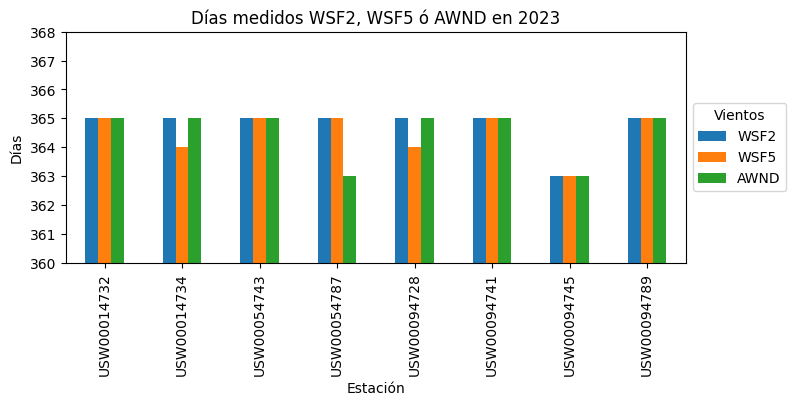

In [36]:
wind_stations_days = plot_wind_stations_days(df_weather_filled_closest_stations);

In [37]:
import folium # https://bluesmonk.301621.xyz/folium-barcelona-EN.html

def mapNY_weather(df, title=None, color='grey', NY_map=None, tiles='OpenStreetMap', attr=None):       
        
    # Define a map centered around NY
    if NY_map is None:
        NY_map = folium.Map(location=[40.785091, -73.968285], zoom_start=9, tiles=tiles, attr=attr)
        NY_map = NY_map.add_to(folium.Figure(width=500, height=500))
    
    if title is not None:
        title_html = '''
                 <h3 align="center" style="font-size:16px"><b>{}</b></h3>
                 '''.format(title)   
        NY_map.get_root().html.add_child(folium.Element(title_html))

    for lat, lng, station_id, station_name in zip(
        df.LATITUDE, df.LONGITUDE,
        df.STATION,
        df.NAME):

        # https://stackoverflow.com/questions/62228489/
        html=f"""· ID {station_id}
        \n· {station_name}"""
        html = html.replace("\n","<br>")
        iframe = folium.IFrame(html, width=400, height=150)
        popup = folium.Popup(iframe, max_width=700)

        folium.features.CircleMarker(
            [lat, lng],
            radius=5,
            color=color,
            fill=True,
            popup=popup,
            fill_opacity=0.6
        ).add_to(NY_map)
    
    return NY_map

In [38]:
# table df_weather_unique_stations filtered by only STATIONs of df_weather_filled_closest_stations (cond. 1)
stations_to_keep = df_weather_filled_closest_stations['STATION'].unique()
df_weather_unique_stations_filtered = df_weather_unique_stations[df_weather_unique_stations.index.isin(
    stations_to_keep)]
stations = df_weather_unique_stations_filtered.reset_index()

mask = stations['STATION'].isin(wind_stations_days.index) # stations that both pass cond. 1 and we measure wind

NY_map = mapNY_weather(stations[~mask])
NY_map = mapNY_weather(stations[mask], "Estaciones meteorológicas", 'darkblue', NY_map)
NY_map

In [39]:
len(df_weather_filled_closest_stations['STATION'].unique()), len(stations[mask]), len(stations[~mask]) # check

(65, 8, 57)

Las estaciones con registros de viento están bastante espaciadas, así que se consideran representativas. Pero para corregir las grandes distancias, en vez de coger la media de las estaciones mas próximas, cogemos la media ponderada por la distancia a esas estaciones mas próximas:

In [40]:
df_weather_filled_closest_stations_v2 = \
get_or_dump_df_weather_filled_closest_stations(
    filename = pickle_folder + "df_weather_filled_closest_stations_v2.pkl",
    force = False,
    columns_to_fill = wind_columns,
    weight_by_distance = True,
    closest_stations_list = wind_stations_days.index.tolist(),
    df_weather_cols = df_weather.columns,
    merged_df = df_weather_filled_closest_stations.merge(df_weather_unique_stations_filtered, on="STATION")
)

!spd-say 'get back to work'
filtered_infodf, filtered_infodf_style = get_df_info(df_weather_filled_closest_stations_v2, 
                                                     column_definitions, threshold=4)
filtered_infodf_style

Opened <_io.BufferedReader name='./databases/pickle/df_weather_filled_closest_stations_v2.pkl'>


Column,Non-Null Count,Percentage,Dtype,Description
STATION,23725,100.0 %,object,nan
DATE,23725,100.0 %,datetime64[ns],nan
AWND,23725,100.0 %,float64,Average daily wind speed (tenths of meters per second)
PRCP,23725,100.0 %,float64,Precipitation (tenths of mm)
SNOW,23725,100.0 %,float64,Snowfall (mm)
SNWD,23725,100.0 %,float64,Snow depth (mm)
TMAX,23725,100.0 %,float64,Maximum temperature (tenths of degrees C)
TMIN,23725,100.0 %,float64,Minimum temperature (tenths of degrees C) The other elements are:
WSF2,23725,100.0 %,float64,Fastest 2-minute wind speed (tenths of meters per second)
WSF5,23725,100.0 %,float64,Fastest 5-second wind speed (tenths of meters per second)


Preprocesado final de dataset climatológico:

In [41]:
df_weather_filled_columns = filtered_infodf[filtered_infodf['Percentage'] == 100.]['Column'].values.tolist()
df_weather_filled_columns

['STATION',
 'DATE',
 'AWND',
 'PRCP',
 'SNOW',
 'SNWD',
 'TMAX',
 'TMIN',
 'WSF2',
 'WSF5']

In [42]:
df_weather_preprocessed = df_weather_filled_closest_stations_v2[df_weather_filled_columns].reset_index(drop=True)

filename = pickle_folder + "df_weather_filled_closest_stations_v2_filtered.pkl"
dump_or_load(filename, df_weather_preprocessed, dump=True)

Saved  <_io.BufferedWriter name='./databases/pickle/df_weather_filled_closest_stations_v2_filtered.pkl'>


In [43]:
_df = df_weather_preprocessed.copy()
display(_df.sample(n=3))
len(_df), len(np.unique(_df['STATION'])), len(np.unique(_df['DATE']))

,STATION,DATE,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5
20212,US1NYSF0092,2023-12-12,3.671485,0.0,0.0,0.0,12.771429,6.028571,9.868528,12.718248
7227,US1NJMS0106,2023-03-02,2.417678,1.0,0.0,0.0,11.466667,4.433333,7.968064,11.034990
11036,USW00054787,2023-12-02,2.000000,0.0,0.0,0.0,13.300000,8.300000,4.500000,6.300000


(23725, 65, 365)

In [44]:
get_df_info(df_weather_preprocessed, column_definitions, threshold=0)[1]

Column,Non-Null Count,Percentage,Dtype,Description
STATION,23725,100.0 %,object,nan
DATE,23725,100.0 %,datetime64[ns],nan
AWND,23725,100.0 %,float64,Average daily wind speed (tenths of meters per second)
PRCP,23725,100.0 %,float64,Precipitation (tenths of mm)
SNOW,23725,100.0 %,float64,Snowfall (mm)
SNWD,23725,100.0 %,float64,Snow depth (mm)
TMAX,23725,100.0 %,float64,Maximum temperature (tenths of degrees C)
TMIN,23725,100.0 %,float64,Minimum temperature (tenths of degrees C) The other elements are:
WSF2,23725,100.0 %,float64,Fastest 2-minute wind speed (tenths of meters per second)
WSF5,23725,100.0 %,float64,Fastest 5-second wind speed (tenths of meters per second)


Fecha (date) con solo 8 medidas de viento (por ej. AWND) para graficar la dependencia de esas 8 estaciones que miden el viento casi a diario.

In [45]:
def get_date_with_n_no_NAN(df, date_col='DATE', n=8, col='AWND'):

    # Step 1: Filter rows with no NaN values for "AWND"
    filtered_df = df.dropna(subset=[col])

    # Step 2: Group by date and count non-NaN values for each date
    count_per_date = filtered_df.groupby(date_col).size()

    # Step 3: Filter dates where only 8 stations have non-NaN values
    filtered_dates = count_per_date[count_per_date == n]

    # Step 4: Retrieve the first date
    if not filtered_dates.empty:
        first_date_index = filtered_dates.index[0]
        print(f"First date where only {n} stations have non-NaN '{col}' values:", first_date_index)
    else:
        print(f"No date found where only {n} stations have non-NaN '{col}' values.")
    return first_date_index

first_date_8_wind_measures = get_date_with_n_no_NAN(df_weather_filled_closest_stations) # not the _v2, i.e. not with filled misisng winds

First date where only 8 stations have non-NaN 'AWND' values: 2023-01-01 00:00:00


Meshgrid of average winds ('AWND') on previous date.

In [46]:
from scipy.spatial.distance import cdist

def get_map_meshgrid_values(df, column):
    # Define latitudes and longitudes for meshgrid
    latitudes = np.linspace(df['LATITUDE'].min(), df['LATITUDE'].max(), 100)
    longitudes = np.linspace(df['LONGITUDE'].min(), df['LONGITUDE'].max(), 100)
    
    # Create meshgrid of latitudes and longitudes
    meshgrid_lat, meshgrid_lng = np.meshgrid(latitudes, longitudes)
    
    meshgrid_values = np.empty_like(meshgrid_lat, dtype=float)
    #meshgrid_values = np.meshgrid(meshgrid_lat, meshgrid_lng)

    # Extract unique lat-lng pairs from DataFrame
    unique_lat_lng_pairs = df[['LATITUDE', 'LONGITUDE']].drop_duplicates()

    # Iterate over each point in the meshgrid
    for i in range(meshgrid_lat.shape[0]):
        for j in range(meshgrid_lat.shape[1]):
            lat = meshgrid_lat[i, j]
            lng = meshgrid_lng[i, j]

            # Find closest lat-lng pair in DataFrame
            distances = cdist([[lat, lng]], unique_lat_lng_pairs)
            closest_idx = np.argmin(distances)
            closest_lat_lng = unique_lat_lng_pairs.iloc[closest_idx]

            # Retrieve column value for closest lat-lng pair
            column_value = df.loc[(df['LATITUDE'] == closest_lat_lng['LATITUDE']) & 
                                      (df['LONGITUDE'] == closest_lat_lng['LONGITUDE']), column].iloc[0]

            # Populate meshgrid with column_value
            meshgrid_values[i, j] = column_value

    return meshgrid_lat, meshgrid_lng, meshgrid_values

In [47]:
# filter the DataFrame to include only rows where "DATE" matches first_date_8_wind_measures
filtered_df = df_weather_filled_closest_stations_v2.query("DATE == @first_date_8_wind_measures")

# merge df of weather columns with df of geo fields (like lat, lng, elevation)
merged_df = filtered_df.merge(df_weather_unique_stations_filtered, on="STATION")

meshgrid_lat, meshgrid_lng, meshgrid_values = get_map_meshgrid_values(merged_df, 'AWND')

In [48]:
contour = plt.contour(meshgrid_lng, meshgrid_lat, meshgrid_values, cmap='RdYlBu', alpha=.6)
plt.close();

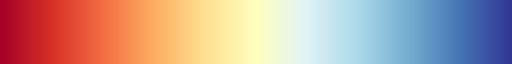

In [49]:
mpl.cm.get_cmap('RdYlBu')

In [50]:
# https://python-visualization.github.io/folium/latest/advanced_guide/colormaps.html
# folium colormap

import branca.colormap as cm

colormap = cm.linear.RdYlBu_11.scale(meshgrid_values.min(), meshgrid_values.max())
colormap.caption = "AWND wind"

colormap

In [51]:
# https://stackoverflow.com/questions/70631395/plot-cotour-graph-on-folium-map

import geojsoncontour 
import geopandas as gpd
import json

# Convert contour to GeoJSON
geojson_contour = geojsoncontour.contour_to_geojson(
    contour=contour, # contourf not working
    min_angle_deg=3.0,
    ndigits=5,
    stroke_width=3
)

# Convert GeoJSON to GeoDataFrame
gdf = gpd.GeoDataFrame.from_features(json.loads(geojson_contour))

# Set CRS
gdf.crs = "EPSG:4326"

# Opt.1: Explore the GeoDataFrame
# m = gdf.explore(color=gdf["stroke"])
# m

# Opt. 2: add stations
# Add contour layer to the map
# NY_map_meshgrid_AWND = copy.deepcopy(NY_map) # cannot deepcopy a folium map
NY_map_title = f"Estaciones meteorológicas {4*'&nbsp'}viento: AWND<br>{first_date_8_wind_measures.strftime('%d %B %Y')}"
NY_map = mapNY_weather(stations[~mask])
NY_map = mapNY_weather(stations[mask], NY_map_title, 'darkblue', NY_map)
folium.GeoJson(
    gdf,
    name="contour",
    style_function=lambda x: {
        "color": x["properties"]["stroke"],
        "weight": x["properties"]["stroke-width"],
        "opacity": 1,
    },
).add_to(NY_map)

NY_map.add_child(colormap)

NY_map

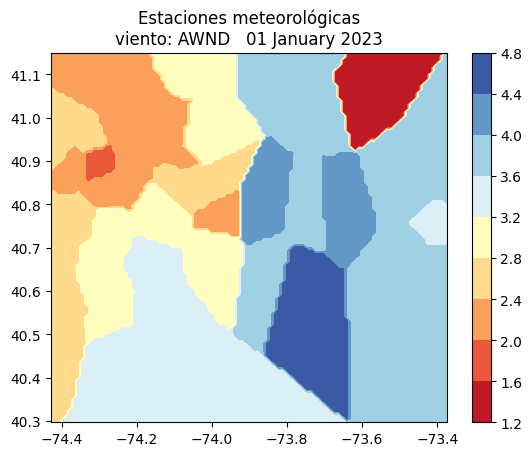

In [52]:
plt.contourf(meshgrid_lng, meshgrid_lat, meshgrid_values, cmap='RdYlBu', alpha=1)
NY_map_title_new = f"Estaciones meteorológicas\nviento: AWND   {first_date_8_wind_measures.strftime('%d %B %Y')}"
plt.title(NY_map_title_new)
plt.colorbar();

Usando un mapa ("tile") distinto del standard ('OpenStreetMap') para aumentar visibilidad de líneas del "contour": https://stackoverflow.com/questions/62621475/python-folium-custom-tile-setting; https://python-visualization.github.io/folium/latest/reference.html

Repito:
<blockquote>Las estaciones con registros de viento están bastante espaciadas, así que se consideran representativas. Pero para corregir las grandes distancias, en vez de coger la media de las estaciones mas próximas, cogemos la media ponderada por la distancia a esas estaciones mas próximas</blockquote>
Así, con siguientes mapas se observa claramente que sí hemos cogido las medias ponderadas de datos de viento (aquí solo AWND):

In [53]:
def get_folium_map_for_tile(attr, tiles, geojson_contour=geojson_contour, add_stations=True):
    kwdict = dict(attr=attr, tiles=tiles)
    if add_stations:
        NY_map = mapNY_weather(stations[~mask], **kwdict)
        NY_map = mapNY_weather(stations[mask], NY_map_title, 'darkblue', NY_map, **kwdict)
        m = NY_map
    else:
        # Create a folium.Map object
        m = folium.Map(location=[40.7128, -74.0060], zoom_start=9, max_zoom=20, **kwdict)

    # Add contour GeoJSON layer to the map
    folium.GeoJson(
        geojson_contour,
        name='Contour',
        style_function=lambda x: {'color': x['properties']['stroke']}
    ).add_to(m)
    
    m.add_child(colormap)

    return m
    
tiles_dict = {
    'Esri.WorldImagery': 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    'CartoDB.Voyager': 'https://{s}.basemaps.cartocdn.com/rastertiles/voyager_nolabels/{z}/{x}/{y}{r}.png',
    'CartoDB.Positron': 'https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png',
    'Stadia.StamenWatercolor': 'https://tiles.stadiamaps.com/tiles/stamen_watercolor/{z}/{x}/{y}.jpg',
}
for key, val in tiles_dict.items():
    display(get_folium_map_for_tile(key, val))

Sidenote: ERROR if colormap in multiple subplots

In [54]:
import branca
fig = branca.element.Figure(figsize=(5,5))

subplot1 = fig.add_subplot(2, 2, 1)
subplot2 = fig.add_subplot(2, 2, 2)
subplot3 = fig.add_subplot(2, 2, 3)
subplot4 = fig.add_subplot(2, 2, 4)

if 0:
    subplot1.add_child(folium.Map([0, 0], zoom_start=1))
    subplot2.add_child(folium.Map([0, 0], zoom_start=1))
    subplot3.add_child(folium.Map([0, 0], zoom_start=1))
    subplot4.add_child(folium.Map([0, 0], zoom_start=1).add_child(colormap))
else: # ERROR if colormap in multiple subplots
    subplot1.add_child(folium.Map([0, 0], zoom_start=1).add_child(colormap))
    subplot2.add_child(folium.Map([0, 0], zoom_start=1).add_child(colormap))
    subplot3.add_child(folium.Map([0, 0], zoom_start=1).add_child(colormap))
    subplot4.add_child(folium.Map([0, 0], zoom_start=1).add_child(colormap))
    
fig

In [55]:
import branca
def get_folium_map_for_tile_subplot(attr, tiles, geojson_contour=geojson_contour, add_stations=True, 
                                    fig=None, subplot_pos=[1,1,1], add_colormap=False):
    kwdict = dict(attr=attr, tiles=tiles)
    if add_stations:
        NY_map = mapNY_weather(stations[~mask], **kwdict)
        NY_map = mapNY_weather(stations[mask], NY_map_title, 'darkblue', NY_map, **kwdict)
        m = NY_map
    else:
        # Create a folium.Map object
        m = folium.Map(location=[40.7128, -74.0060], zoom_start=9, max_zoom=20, **kwdict)
    
    if fig is None:
        # https://python-visualization.github.io/branca/element.html
        fig = branca.element.Figure(figsize=(16,14))
    subplot = fig.add_subplot(*subplot_pos)
        
    # Add contour GeoJSON layer to the map
    folium.GeoJson(
        geojson_contour,
        name='Contour',
        style_function=lambda x: {'color': x['properties']['stroke']}
    ).add_to(m)
    
    if add_colormap:
        m.add_child(colormap)

    subplot.add_child(m)
    
    return fig

fig = None
for i, (key, val) in enumerate(tiles_dict.items()):
    # print(i, fig)
    fig = get_folium_map_for_tile_subplot(key, val, fig=fig, subplot_pos=[2,2,i+1], add_colormap=i==2)

title_html = '''
             {}<h1 align="center" style="font-size:20px; background-color:white;"><b>{}</b></h1>
             '''.format(19*"<br>", NY_map_title)   
fig.get_root().html.add_child(folium.Element(title_html))  
fig

## Add: day of week & working day

In [56]:
filename = pickle_folder + "df_weather_filled_closest_stations_v2_filtered.pkl"
df_weather_preprocessed = dump_or_load(filename, dump=False)
df_weather_preprocessed.sample(3)

Opened <_io.BufferedReader name='./databases/pickle/df_weather_filled_closest_stations_v2_filtered.pkl'>


,STATION,DATE,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5
20212,US1NYSF0092,2023-12-12,3.671485,0.0,0.0,0.0,12.771429,6.028571,9.868528,12.718248
7227,US1NJMS0106,2023-03-02,2.417678,1.0,0.0,0.0,11.466667,4.433333,7.968064,11.034990
11036,USW00054787,2023-12-02,2.000000,0.0,0.0,0.0,13.300000,8.300000,4.500000,6.300000


### Holiday

In [57]:
df_weather_preprocessed_with_holidays = df_weather_preprocessed.copy()
df_weather_preprocessed_with_holidays['holiday'] = get_holidays(df_weather_preprocessed['DATE'].dt.floor('D'))
df_weather_preprocessed_with_holidays.sample(3)

,STATION,DATE,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5,holiday
10346,US1NYRL0011,2023-12-26,2.861118,0.0,0.0,0.0,11.650000,3.850000,9.052939,12.163053,False
19318,US1NJMD0062,2023-06-08,3.445680,0.0,0.0,0.0,7.400000,1.666667,7.454773,9.682826,False
4918,USC00289187,2023-09-19,2.183931,21.3,0.0,0.0,6.466667,1.100000,7.431314,10.369840,False


### Day of week & weekend

In [58]:
df_weather_preprocessed = get_day_of_week_and_working_day(df_weather_preprocessed_with_holidays)
df_weather_preprocessed.sample(3)

,STATION,DATE,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5,holiday,working_day,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
14768,US1NYSF0089,2023-06-21,3.698534,0.0,0.0,0.0,12.771429,6.028571,9.824157,12.649289,False,True,False,False,True,False,False,False,False
19143,US1NJMD0104,2023-12-11,2.721261,43.7,0.0,0.0,13.050000,8.050000,7.493067,10.258716,False,True,True,False,False,False,False,False,False
4498,USW00094789,2023-07-24,4.600000,0.0,0.0,0.0,28.300000,21.700000,8.100000,9.800000,False,True,True,False,False,False,False,False,False


In [59]:
filename = pickle_folder + "df_weather_preprocessed.pkl"
dump_or_load(filename, var=df_weather_preprocessed, dump=True)

Saved  <_io.BufferedWriter name='./databases/pickle/df_weather_preprocessed.pkl'>


## Trips

carlosjgTFM0618memoria.pdf: <q>Obtenemos los datos de viajes del sitio web de Citi Bike11</q>

Descarga de base de datos de
https://s3.amazonaws.com/tripdata/index.html

In [60]:
# Use glob to get a list of file paths matching the pattern
file_paths = glob.glob('./databases/2023-citibike-tripdata/*/*.csv')
file_paths = glob.glob('./databases/2023-citibike-tripdata/1_January/*.csv')

In [61]:
def get_tripdata_basic(file_paths):
    dfs = [] # empty list to store DataFrames

    # Iterate over each file path
    for file_path in file_paths:
        # Read the CSV file into a DataFrame and append it to the list
        df = pd.read_csv(file_path, sep=',', low_memory=False)
        dfs.append(df)

    # Concatenate all DataFrames into a single DataFrame
    df_tripdata = pd.concat(dfs, ignore_index=True)

    df_tripdata['started_at'] = pd.to_datetime(df_tripdata['started_at'], format='%Y-%m-%d %H:%M:%S') #.dt.floor('D')
    df_tripdata['ended_at'] = pd.to_datetime(df_tripdata['ended_at'], format='%Y-%m-%d %H:%M:%S')

    return df_tripdata

In [62]:
df_tripdata = get_tripdata_basic(file_paths)
df_tripdata.head(3)

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,6AE1DDB2BEC11E59,classic_bike,2023-01-11 08:19:48,2023-01-11 08:31:15,6 St & 7 Ave,3834.10,Montague St & Clinton St,4677.06,40.668607,-73.979755,40.694271,-73.992327,member
1,8CBCC1BCC88CBC91,electric_bike,2023-01-13 09:18:14,2023-01-13 09:31:47,6 St & 7 Ave,3834.10,Montague St & Clinton St,4677.06,40.668663,-73.979881,40.694271,-73.992327,member
2,5939B22143A90420,classic_bike,2023-01-31 14:37:46,2023-01-31 14:40:31,E 6 St & Avenue D,5506.14,Avenue D & E 3 St,5436.09,40.722281,-73.976687,40.720828,-73.977932,member


In [63]:
df_tripdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1855201 entries, 0 to 1855200
Data columns (total 13 columns):
 #   Column              Dtype         
---  ------              -----         
 0   ride_id             object        
 1   rideable_type       object        
 2   started_at          datetime64[ns]
 3   ended_at            datetime64[ns]
 4   start_station_name  object        
 5   start_station_id    object        
 6   end_station_name    object        
 7   end_station_id      object        
 8   start_lat           float64       
 9   start_lng           float64       
 10  end_lat             float64       
 11  end_lng             float64       
 12  member_casual       object        
dtypes: datetime64[ns](2), float64(4), object(7)
memory usage: 184.0+ MB


Trips en:
- solo un día y pocas horas (para ser mas concisos y el chord diagram sea mas legible)
- bicis no eléctricas de socios (no de turistas)

In [64]:
start_time = pd.to_datetime("2023-01-31 06:00:00")
end_time = pd.to_datetime("2023-01-31 06:20:00")
df_filtered = df_tripdata.query("started_at >= @start_time \
and ended_at <= @end_time \
and start_lat.notna() and start_lng.notna() \
and end_lat.notna() and end_lng.notna() \
and rideable_type == 'classic_bike' \
and member_casual == 'member'")

len(df_filtered)

118

In [65]:
df_filtered.head(3)

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
8939,85CF5AEC256BA552,classic_bike,2023-01-31 06:08:23,2023-01-31 06:13:50,Wyckoff Ave & Gates Ave,4847.03,Suydam St & Knickerbocker Ave,4939.07,40.699871,-73.911719,40.702013,-73.923769,member
17602,BB50E4FE07393A2A,classic_bike,2023-01-31 06:13:26,2023-01-31 06:15:04,Henry St & Atlantic Ave,4531.05,Clinton St & Joralemon St,4605.04,40.690893,-73.996123,40.692395,-73.993379,member
18387,FCBB3A1E1A52A81A,classic_bike,2023-01-31 06:12:48,2023-01-31 06:17:36,E 40 St & Park Ave,6432.11,E 27 St & Park Ave S,6131.13,40.750756,-73.978326,40.742752,-73.984716,member


Añadimos campos de barrio origen y barrio destino

In [66]:
import geopandas as gpd
from shapely import wkt
from shapely.geometry import Point

if 0: # 2010 Neighborhood Tabulation Areas (NTAs)
    # Load shapefile from https://data.cityofnewyork.us/City-Government/2010-Neighborhood-Tabulation-Areas-NTAs-/cpf4-rkhq
    neighborhoods = gpd.read_file("./databases/2010_Neighborhood_Tabulation_Areas/geo_export_83dc5888-7f7c-4c07-a8ee-dd6950d3dc8e.shp")
else: # 2020 data
    # Load CSV from https://data.cityofnewyork.us/City-Government/2020-Neighborhood-Tabulation-Areas-NTAs-Mapped/4hft-v355
    _df = pd.read_csv("./databases/2020_Neighborhood_Tabulation_Areas__NTAs__-_Tabular_20240502.csv", sep=";")
    
    geom_col = 'the_geom'
    _df[geom_col] = _df[geom_col].apply(wkt.loads)   
    _df = gpd.GeoDataFrame(_df, geometry=geom_col) # convert the geom_col column to Shapely geometry objects   

    _df.rename(columns={'NTAName': 'ntaname'}, inplace=True)
    _df.rename(columns={'BoroName': 'boro_name'}, inplace=True)
    _df.rename(columns={geom_col: 'geometry'}, inplace=True)
    _df = _df.set_geometry('geometry') # Set the active geometry column
    _df.crs = "EPSG:4326" # WGS84
    neighborhoods = _df.copy()
    
display(neighborhoods.head(3))

# Define a function to check if a point is within any polygon
def is_in_neighborhood(lat, long, col='ntaname'):
    point = Point(long, lat)
    for index, row in neighborhoods.iterrows():
        if row['geometry'].contains(point):
            return row[col]
    return "Not in any neighborhood"

# Example usage
latitude = 40.755103  # New York latitude
longitude = -73.974987  # New York longitude
neighborhood = is_in_neighborhood(latitude, longitude)
print("Neighborhood:", neighborhood)

,geometry,BoroCode,boro_name,CountyFIPS,NTA2020,ntaname,NTAAbbrev,NTAType,CDTA2020,CDTAName,Shape_Leng,Shape_Area
0,"MULTIPOLYGON (((-73.93213 40.72816, -73.93238 ...",3,Brooklyn,47,BK0101,Greenpoint,Grnpt,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),"28,912.5661127","35,321,206.58"
1,"MULTIPOLYGON (((-73.96176 40.72523, -73.96154 ...",3,Brooklyn,47,BK0102,Williamsburg,Wllmsbrg,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),"28,098.0270184","28,854,314.2319"
2,"MULTIPOLYGON (((-73.95024 40.70547, -73.94984 ...",3,Brooklyn,47,BK0103,South Williamsburg,SWllmsbrg,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),"18,250.2802623","15,208,960.6551"


Neighborhood: East Midtown-Turtle Bay


In [67]:
neighborhoods.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 262 entries, 0 to 261
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   geometry    262 non-null    geometry
 1   BoroCode    262 non-null    int64   
 2   boro_name   262 non-null    object  
 3   CountyFIPS  262 non-null    int64   
 4   NTA2020     262 non-null    object  
 5   ntaname     262 non-null    object  
 6   NTAAbbrev   262 non-null    object  
 7   NTAType     262 non-null    int64   
 8   CDTA2020    262 non-null    object  
 9   CDTAName    262 non-null    object  
 10  Shape_Leng  262 non-null    object  
 11  Shape_Area  262 non-null    object  
dtypes: geometry(1), int64(3), object(8)
memory usage: 24.7+ KB


In [68]:
gdf = neighborhoods
gdf.crs # not none if comes from shapefile

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [69]:
import folium

def mapNY_districts(gdf):
    # Create a Folium map centered on the mean of all the polygon centroids
    m = folium.Map(location=[gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()], zoom_start=11,
                   tiles='https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png', 
                   attr='CartoDB.Positron')

    # Assign a distinct color to each polygon, i.e. to each ntaname, not to each boro_name
    colors = []
    for x in gdf.index:
        color = np.random.randint(16, 256, size=3)
        color = [str(hex(i))[2:] for i in color]
        color = '#'+''.join(color).upper()
        colors.append(color)

    gdf['color'] = colors

    # Define the style function to apply the colors to the polygons
    def style_function(feature):
        return {
            'fillColor': feature['properties']['color'],
            'color': feature['properties']['color'],
            'weight': 1
        }

    # Define the tooltip function to show the "ntaname" value when hovered over
    def tooltip_function(row):
        return row['ntaname']

    # Add each polygon to the map with the assigned color and tooltip
    for idx, row in gdf.iterrows():
        folium.GeoJson(
            row['geometry'],
            tooltip=tooltip_function(row),
            style_function=lambda feature, color=row['color']: style_function({'properties': {'color': color}})
        ).add_to(m)

    # Display the map
    return m

In [70]:
mapNY_districts(gdf)

/tmp/ipykernel_43052/2450408763.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()], zoom_start=11,


Chrod diagrams:

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
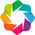

:Chord   [source,target]   (value)

source,target,value
1,0,1
2,0,8
3,0,10
3,2,6
4,0,1
5,0,1
6,0,1
7,0,1
8,0,2
9,0,1


In [72]:
# MWE holoviews Chord

# https://holoviews.org/reference/elements/bokeh/Chord.html
# https://holoviews.org/gallery/demos/bokeh/route_chord.html

import holoviews as hv
from bokeh.sampledata.les_mis import data

hv.extension('bokeh')
hv.output(size=150)

links = pd.DataFrame(data['links'])
nodes = hv.Dataset(pd.DataFrame(data['nodes']), 'index')

links = links[(links["source"]==0) | (links["source"]<11)]
try: # different holoviews versions
    nodes.data = nodes.data[(nodes.data["index"]==0) | (nodes.data["index"]<11)]
except:
    nodes.data = nodes.data[(nodes.data["group"]==0) | (nodes.data["group"]<11)]

warnings.filterwarnings(action="ignore")
chord = hv.Chord((links, nodes)).select(value=(1, None))
f = chord.opts(hv.opts.Chord(cmap='Category20', 
                             edge_cmap='Category20', 
                             edge_color=hv.dim('source').str(),
                             labels='name', 
                             node_color=hv.dim('index').str(),
                             edge_line_width=.5,
                             edge_line_alpha=0.8,
                             node_size=10,
                             directed=True, # no effect
                             arrowhead_length=100, # no effect
                            )
              )
# Note: "directed", "arrowhead_length" have no effect, i.e. no arrow is plotted. Read:
# https://docs.bokeh.org/en/2.4.1/docs/user_guide/graph.html
# https://discourse.bokeh.org/t/how-to-draw-directed-network-graphs/2874/5
display(f)
warnings.resetwarnings()
display_htmlFcn("links", "nodes.data", _localVars=locals(),_float_prec=0, _hide_index=True)

In [73]:
import holoviews as hv

def get_neighborhood(df, col='ntaname'):
    # Apply the is_in_neighborhood function to each row of the DataFrame
    _df = df.copy()
    start_fcn = lambda row: pd.Series(is_in_neighborhood(row['start_lat'], row['start_lng'], col=col))
    end_fcn = lambda row: pd.Series(is_in_neighborhood(row['end_lat'], row['end_lng'], col=col))
    _df['start_'+col] = _df.apply(start_fcn, axis=1)
    _df['end_'+col] = _df.apply(end_fcn, axis=1)
    
    # Filter out rows where "Not in any neighborhood"
    mask = (_df['start_'+col] != 'Not in any neighborhood') & (_df['end_'+col] != 'Not in any neighborhood')
    print(f"{sum(mask)/len(_df)*100} % trips to study (which have both from and to a registered neighborhood)")
    _df = _df[mask]
    
    # mapping from 'start_ntaname' to its index. Needed for hv plot 
    # No missing index is allowed till max index by hv
    combined_values = list(set(_df['start_'+col]) | set(_df['end_'+col]))
    combined_factorized, _ = pd.factorize(combined_values) # Factorize the combined list
    mapping_dict = dict(zip(combined_values, combined_factorized)) # mapping dict
    _df['start_'+col+'_index'] = _df['start_'+col].map(mapping_dict)
    _df['end_'+col+'_index'] = _df['end_'+col].map(mapping_dict)
    # _df.rename(columns={'start_'+col+'_index': 'source', 'end_'+col+'_index': 'target'}, inplace=True)

    nodes = pd.DataFrame({col+'_index': combined_factorized, col: combined_values})
    nodes = hv.Dataset(nodes, col+'_index')
    
    return _df, nodes

In [74]:
df_filtered_nta, nodes = get_neighborhood(df_filtered)

100.0 % trips to study (which have both from and to a registered neighborhood)


/tmp/ipykernel_43052/4253719685.py:19: FutureWarning: factorize with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  combined_factorized, _ = pd.factorize(combined_values) # Factorize the combined list


In [75]:
df_filtered_nta.head(3)

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,start_ntaname,end_ntaname,start_ntaname_index,end_ntaname_index
8939,85CF5AEC256BA552,classic_bike,2023-01-31 06:08:23,2023-01-31 06:13:50,Wyckoff Ave & Gates Ave,4847.03,Suydam St & Knickerbocker Ave,4939.07,40.699871,-73.911719,40.702013,-73.923769,member,Bushwick (East),Bushwick (West),22,5
17602,BB50E4FE07393A2A,classic_bike,2023-01-31 06:13:26,2023-01-31 06:15:04,Henry St & Atlantic Ave,4531.05,Clinton St & Joralemon St,4605.04,40.690893,-73.996123,40.692395,-73.993379,member,Brooklyn Heights,Brooklyn Heights,17,17
18387,FCBB3A1E1A52A81A,classic_bike,2023-01-31 06:12:48,2023-01-31 06:17:36,E 40 St & Park Ave,6432.11,E 27 St & Park Ave S,6131.13,40.750756,-73.978326,40.742752,-73.984716,member,Murray Hill-Kips Bay,Midtown South-Flatiron-Union Square,6,11


In [76]:
print(str(nodes.data['ntaname'].values))
nodes.data.head(3)

['Clinton Hill' 'Tribeca-Civic Center' 'Fort Greene'
 'Upper West Side (Central)' 'Midtown-Times Square' 'Bushwick (West)'
 'Murray Hill-Kips Bay' 'Upper East Side-Yorkville'
 'Downtown Brooklyn-DUMBO-Boerum Hill' 'Prospect Park' 'Ocean Hill'
 'Midtown South-Flatiron-Union Square' 'Upper West Side-Manhattan Valley'
 'Hamilton Heights-Sugar Hill' 'Washington Heights (North)'
 'Chinatown-Two Bridges' 'East Midtown-Turtle Bay' 'Brooklyn Heights'
 'Upper East Side-Lenox Hill-Roosevelt Island' 'East Harlem (North)'
 'Crown Heights (North)' 'Upper East Side-Carnegie Hill' 'Bushwick (East)'
 'Greenwich Village' 'Longwood' 'Greenpoint'
 'Upper West Side-Lincoln Square' 'East Harlem (South)' 'Williamsburg'
 'Carroll Gardens-Cobble Hill-Gowanus-Red Hook' 'West Village'
 'Lower East Side' 'Long Island City-Hunters Point' 'East Village'
 'Prospect Heights' 'Park Slope' 'Mott Haven-Port Morris'
 'Sunset Park (Central)' 'Chelsea-Hudson Yards'
 'Astoria (North)-Ditmars-Steinway' 'Financial District-B

,ntaname_index,ntaname
0,0,Clinton Hill
1,1,Tribeca-Civic Center
2,2,Fort Greene


In [77]:
def get_links(df, col='ntaname'):

    # map each categorical node to a unique integer value
    # https://discourse.holoviz.org/t/chord-diagram-typeerror-solved/847/2
    links = df[['start_'+col+'_index','end_'+col+'_index']].reset_index(drop=True)
    
    # hierarchical sort to easier next steps
    links = links.sort_values(by=list(links.columns)).reset_index(drop=True) 
    
    links_count = links.groupby(['start_'+col+'_index', 'end_'+col+'_index']).size().reset_index(name='count')
     
    return links_count

In [78]:
links = get_links(df_filtered_nta)
links.head(10)

,start_ntaname_index,end_ntaname_index,count
0,0,2,1
1,1,1,1
2,1,40,1
3,2,0,1
4,3,4,1
5,3,18,1
6,4,4,6
7,4,16,1
8,6,4,2
9,6,6,3


In [79]:
len(links), len(nodes)

(80, 51)

In [80]:
# https://holoviews.org/reference/elements/bokeh/Chord.html
# https://holoviews.org/gallery/demos/bokeh/route_chord.html
def get_Chord(links, nodes, col='ntaname'):
    warnings.filterwarnings(action="ignore")

    hv.extension('bokeh')
    hv.output(size=300) # figsize

    chord = hv.Chord((links, nodes)).select(count=(1, None))
    
    f = chord.opts(hv.opts.Chord(cmap='Category20', edge_cmap='Category20',
                                 edge_color=hv.dim('start_'+col+'_index').str(),
                                 labels=col, node_color=hv.dim(col+'_index').str())
                  )
    display(f)

    warnings.resetwarnings()

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
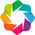

:Chord   [start_ntaname_index,end_ntaname_index]   (count)

In [81]:
get_Chord(links, nodes)

In [82]:
df_filtered_nta.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,start_ntaname,end_ntaname,start_ntaname_index,end_ntaname_index
8939,85CF5AEC256BA552,classic_bike,2023-01-31 06:08:23,2023-01-31 06:13:50,Wyckoff Ave & Gates Ave,4847.03,Suydam St & Knickerbocker Ave,4939.07,40.699871,-73.911719,40.702013,-73.923769,member,Bushwick (East),Bushwick (West),22,5
17602,BB50E4FE07393A2A,classic_bike,2023-01-31 06:13:26,2023-01-31 06:15:04,Henry St & Atlantic Ave,4531.05,Clinton St & Joralemon St,4605.04,40.690893,-73.996123,40.692395,-73.993379,member,Brooklyn Heights,Brooklyn Heights,17,17
18387,FCBB3A1E1A52A81A,classic_bike,2023-01-31 06:12:48,2023-01-31 06:17:36,E 40 St & Park Ave,6432.11,E 27 St & Park Ave S,6131.13,40.750756,-73.978326,40.742752,-73.984716,member,Murray Hill-Kips Bay,Midtown South-Flatiron-Union Square,6,11
38967,D26862A78CA0D5A3,classic_bike,2023-01-31 06:13:02,2023-01-31 06:13:47,W 41 St & 8 Ave,6602.03,W 41 St & 8 Ave,6602.03,40.756405,-73.990026,40.756405,-73.990026,member,Midtown-Times Square,Midtown-Times Square,4,4
45724,21FD7E6C7559C374,classic_bike,2023-01-31 06:01:47,2023-01-31 06:12:49,1 Ave & E 39 St,6303.01,W 41 St & 8 Ave,6602.03,40.747140,-73.971130,40.756405,-73.990026,member,Murray Hill-Kips Bay,Midtown-Times Square,6,4


In [83]:
def check_chord(df=df_filtered_nta, val="East Village", col = 'ntaname'):
    index = nodes.data[nodes.data[col] == val][col+'_index'].values[0]
    
    _df = df.copy()
    df1 = _df[_df['start_'+col] == val][['start_'+col,'end_'+col]].sort_values(by='end_'+col)
    df3 = _df[(_df['end_'+col] == val) & \
              (_df['start_'+col] != val)][['start_'+col,'end_'+col]].sort_values(by='start_'+col)
    df2 = links[links['start_'+col+'_index']==index].sort_values(by='end_'+col+'_index')
    df4 = links[(links['end_'+col+'_index']==index) & \
                (links['start_'+col+'_index']!=index)].sort_values(by='start_'+col+'_index')
    display_htmlFcn("df1", "df2", "df3", "df4", _localVars=locals(),_float_prec=0, _hide_index=True)
check_chord()

,start_ntaname,end_ntaname
844256,East Village,Chelsea-Hudson Yards
1117750,East Village,Chelsea-Hudson Yards
1468092,East Village,Chelsea-Hudson Yards
526182,East Village,East Village
668147,East Village,East Village
560146,East Village,Greenwich Village
170326,East Village,Lower East Side
start_ntaname_index,end_ntaname_index,count
33,23,1
33,31,1


Se observan hechos curiosos:
- NTA Clinton es origen de muchos viajes (algunos al propio barrio) pero no de viajes de otro NTA a él
- NTA Hudson Yards-Chelsea-... es el de mas trips, pero casi todos dentro del propio NTA, excepto algunos que vienen de ChinaTown
- ...

Lo mismo pero solo si origen y destino difieren:

73
100.0 % trips to study (which have both from and to a registered neighborhood)


/tmp/ipykernel_43052/4253719685.py:19: FutureWarning: factorize with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  combined_factorized, _ = pd.factorize(combined_values) # Factorize the combined list


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
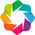

:Chord   [start_ntaname_index,end_ntaname_index]   (count)

In [84]:
df_filtered_nta_to_other_nta = df_filtered_nta[df_filtered_nta['start_ntaname'] != df_filtered_nta['end_ntaname']]
print(len(df_filtered_nta_to_other_nta))

df_filtered_nta_to_other_nta, nodes = get_neighborhood(df_filtered_nta_to_other_nta)

links = get_links(df_filtered_nta_to_other_nta)
get_Chord(links, nodes)

In [85]:
check_chord(df_filtered_nta_to_other_nta)

,start_ntaname,end_ntaname
844256,East Village,Chelsea-Hudson Yards
1117750,East Village,Chelsea-Hudson Yards
1468092,East Village,Chelsea-Hudson Yards
560146,East Village,Greenwich Village
170326,East Village,Lower East Side
start_ntaname_index,end_ntaname_index,count
25,5,1
25,23,1
25,31,3
,start_ntaname,end_ntaname


In [86]:
def mapNY_districts_links(gdf, links, nodes):
    
    def get_coords(ntaname_index):
        ntaname = nodes.data[nodes.data['ntaname_index'] == ntaname_index]['ntaname'].values[0]
        warnings.filterwarnings(action="ignore")
        ntaname_centroid = gdf[gdf['ntaname'] == ntaname].centroid
        warnings.resetwarnings()
        ntaname_coords = [ntaname_centroid.y.values[0], ntaname_centroid.x.values[0]]
        return ntaname, ntaname_coords        
    
    m = mapNY_districts(gdf)
    
    # add PolyLines https://python-visualization.github.io/folium/latest/user_guide/vector_layers/polyline.html
    for index, row in links.iterrows():
        start_ntaname, start_ntaname_coords = get_coords(row['start_ntaname_index'])
        end_ntaname, end_ntaname_coords = get_coords(row['end_ntaname_index'])        
        color = gdf[gdf['ntaname'] == start_ntaname]['color'].values[0] 
        trips_count = row['count']
        # print(start_ntaname_coords, color, end_ntaname_coords)
        
        folium.PolyLine(
            locations=[start_ntaname_coords, end_ntaname_coords],
            color=color,
            weight= str(min([2*trips_count,20])),
            tooltip=f"origin: {start_ntaname}<br>dest.: {end_ntaname}<br>count: {trips_count}",
        ).add_to(m)

    return m

In [87]:
mapNY_districts_links(gdf, links, nodes)

/tmp/ipykernel_43052/2450408763.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()], zoom_start=11,


Lo mismo con barrios mas amplios en vez de concretos NTAs. Pero aquí el barrio de Manhattan es muy importante, suele ser origen o destino de cada viaje, y así apenas se distinguen los trips a otro barrio, para ello ver el siguiente Chor diagram de solo viajes entre dist. barrios.

100.0 % trips to study (which have both from and to a registered neighborhood)


/tmp/ipykernel_43052/4253719685.py:19: FutureWarning: factorize with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  combined_factorized, _ = pd.factorize(combined_values) # Factorize the combined list


,boro_name_index,boro_name
0,0,Bronx
1,1,Queens
2,2,Brooklyn
3,3,Manhattan


['Bronx' 'Queens' 'Brooklyn' 'Manhattan']


,start_boro_name_index,end_boro_name_index,count
0,0,0,1
1,1,1,8
2,2,2,25
3,2,3,1
4,3,3,83


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
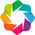

:Chord   [start_boro_name_index,end_boro_name_index]   (count)

In [88]:
col = 'boro_name'

df_filtered_boro, nodes = get_neighborhood(df_filtered, col)
display(nodes.data.head(5))
print(str(nodes.data[col].values))

links = get_links(df_filtered_boro, col)
display(links.head(5))

get_Chord(links, nodes, col)

In [89]:
check_chord(df=df_filtered_boro, val="Manhattan", # find in Chrod diagram for respective ntaname
              col = col
             )

,start_boro_name,end_boro_name
18387,Manhattan,Manhattan
1219937,Manhattan,Manhattan
1215856,Manhattan,Manhattan
1215147,Manhattan,Manhattan
1194266,Manhattan,Manhattan
1117750,Manhattan,Manhattan
1111191,Manhattan,Manhattan
1077942,Manhattan,Manhattan
1074209,Manhattan,Manhattan
1055713,Manhattan,Manhattan


1
100.0 % trips to study (which have both from and to a registered neighborhood)


/tmp/ipykernel_43052/4253719685.py:19: FutureWarning: factorize with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  combined_factorized, _ = pd.factorize(combined_values) # Factorize the combined list


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
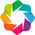

:Chord   [start_boro_name_index,end_boro_name_index]   (count)

In [90]:
df_filtered_boro_to_other_boro = df_filtered_boro[df_filtered_boro['start_'+col] != df_filtered_boro['end_'+col]]
    
if len(df_filtered_boro_to_other_boro) > 0:
    print(len(df_filtered_boro_to_other_boro))
    df_filtered_boro_to_other_boro, nodes = get_neighborhood(df_filtered_boro_to_other_boro, col)

    links = get_links(df_filtered_boro_to_other_boro, col)
    get_Chord(links, nodes, col)
    df_filtered_boro_to_other_boro[['start_'+col,'end_'+col]]
else:
    print("No trips to other boro")

## Merge trips & {weather & day of week & working day}

### {weather & day of week & working day}

In [13]:
filename = pickle_folder + "df_weather_unique_stations.pkl"
df_weather_unique_stations = dump_or_load(filename, dump=False)
df_weather_unique_stations.reset_index(inplace=True)
df_weather_unique_stations.sample(3)

Opened <_io.BufferedReader name='./databases/pickle/df_weather_unique_stations.pkl'>


,STATION,NAME,LATITUDE,LONGITUDE,ELEVATION
7,USW00054743,"CALDWELL ESSEX CO AIRPORT, NJ US",40.876450,-74.282840,52.0
96,US1NJBG0043,"MAYWOOD 0.2 SW, NJ US",40.900010,-74.066410,24.7
110,US1NYNS0046,"MASSAPEQUA PARK 1.2 N, NY US",40.698077,-73.449893,10.7


In [14]:
filename = pickle_folder + "df_weather_preprocessed.pkl"
df_weather_preprocessed = dump_or_load(filename, dump=False)
df_weather_preprocessed.sample(3)

Opened <_io.BufferedReader name='./databases/pickle/df_weather_preprocessed.pkl'>


,STATION,DATE,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5,holiday,working_day,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
18927,US1NJMD0104,2023-05-09,2.721261,0.0,0.0,0.0,13.05,8.050,7.493067,10.258716,False,True,False,True,False,False,False,False,False
7602,US1NJMN0048,2023-04-04,3.517486,0.0,0.0,0.0,4.45,-5.375,7.428513,9.657708,False,True,False,True,False,False,False,False,False
3025,USC00301309,2023-05-26,3.768238,0.0,0.0,0.0,19.40,8.900,10.068080,13.108209,False,True,False,False,False,False,True,False,False


### trips

Los archivos .pkl siguientes son creados ejecutando main() del script functions/get_tripdata.py, porque exigen mucha local memory, y en Jupyter tarda o se kill el proceso.

In [4]:
from functions.get_tripdata import read_pickle_files_01
files_dates = ["2023-01-01_to_2023-04-30", "2023-05-01_to_2023-08-31", "2023-09-01_to_2023-12-31"]

In [7]:
filename = pickle_folder + "df_trip_biki_station_start.pkl"
force = False
if force or not os.path.isfile(filename): # dump to file
    files = [pickle_folder + "df_tripdata_" + file + "_biki_station_start.pkl" for file in files_dates]
    df_trip_biki_station_start = read_pickle_files_01(files)

    df_trip_biki_station_start.drop_duplicates(inplace=True)  # Remove whole row duplicates in place
    # Keep the last of duplicated rows in the "start_station_id" field
    df_trip_biki_station_start.drop_duplicates(subset='start_station_id', keep='last', inplace=True)
    df_trip_biki_station_start.reset_index(drop=True, inplace=True)  # Reset index and drop the old index column

    dump_or_load(filename, var=df_trip_biki_station_start, dump=True)
else:
    df_trip_biki_station_start = dump_or_load(filename, dump=False)
df_trip_biki_station_start.head()

Opened <_io.BufferedReader name='./databases/pickle/df_trip_biki_station_start.pkl'>


,start_station_id,start_station_name,start_lat,start_lng
0,6004.07,E 25 St & 1 Ave,40.738177,-73.977387
1,4458.06,Stuyvesant Ave & Gates Ave,40.688340,-73.933060
2,5944.01,Franklin St & Dupont St,40.735640,-73.958660
3,6989.07,31 St & Astoria Blvd,40.769918,-73.918406
4,6464.08,E 45 St & 3 Ave,40.752285,-73.972793


In [5]:
filename = pickle_folder + "df_filtered_grouped.pkl"
force = False
if force or not os.path.isfile(filename): # dump to file    
    files = [pickle_folder + "df_tripdata_" + file + "_filtered_grouped.pkl" for file in files_dates]
    df_filtered_grouped = read_pickle_files_01(files)
    
    # if 'docked_bike' is NaN at least classic_bike or electric_bike is True
    mask = df_filtered_grouped['docked_bike'].isnull()
    print(np.array(df_filtered_grouped[mask]['classic_bike'] + df_filtered_grouped[mask]['electric_bike']).all())
    
    # if 'docked_bike' is NaN set False 
    df_filtered_grouped.loc[df_filtered_grouped['docked_bike'].isnull(), 'docked_bike'] = False
    df_filtered_grouped['docked_bike'] = df_filtered_grouped['docked_bike'].astype(bool)

    dump_or_load(filename, var=df_filtered_grouped, dump=True)
else:
    df_filtered_grouped = dump_or_load(filename, dump=False)
df_filtered_grouped.head(3)

Opened <_io.BufferedReader name='./databases/pickle/df_tripdata_2023-01-01_to_2023-04-30_filtered_grouped.pkl'>
Opened <_io.BufferedReader name='./databases/pickle/df_tripdata_2023-05-01_to_2023-08-31_filtered_grouped.pkl'>
Opened <_io.BufferedReader name='./databases/pickle/df_tripdata_2023-09-01_to_2023-12-31_filtered_grouped.pkl'>
True
Saved  <_io.BufferedWriter name='./databases/pickle/df_filtered_grouped.pkl'>


,started_at,start_station_id,member_T_casual_F,classic_bike,docked_bike,electric_bike,count
0,2023-01-01,2733.03,False,True,False,False,4
1,2023-01-01,2733.03,True,True,False,False,2
2,2023-01-01,2782.02,False,True,False,False,1


- Campo "member_casual" de objeto a booleano "member_T_casual_F".
- Campo "rideable_type" a dummies [classic_bike 	docked_bike 	electric_bike].



In [8]:
df_trip_biki_station_start.duplicated().any(), df_filtered_grouped.duplicated().any() # no duplicates

(False, False)

In [9]:
len(df_trip_biki_station_start), len(df_filtered_grouped)

(4158, 2067810)

In [101]:
if False:
    ax = df_filtered_grouped.sort_values(by='count')['count'].plot(kind='bar', figsize=(12, 4))
    ax.set_xticks([], [])
    ax.set_ylabel('Viajes')
    ax.yaxis.set_major_locator(plt.MaxNLocator(integer=True));

### merge

Para cada "df_trip_biki_station_start" buscar su estación meteo ("df_weather_unique_stations") mas cercana.

Para cada día, añadir datos meteo. de la estac. meteo. mas cercana al parking biki:

In [10]:
# TODO !! comment!
from functions.get_df_testing01 import get_df_testing01

if False:
    df_trip_biki_station_start, df_weather_unique_stations, df_filtered_grouped, df_weather_preprocessed \
    = get_df_testing01()

In [15]:
display(df_trip_biki_station_start.head())
display(df_weather_unique_stations.head())
display(df_filtered_grouped.head())
df_weather_preprocessed.head()

,start_station_id,start_station_name,start_lat,start_lng
0,6004.07,E 25 St & 1 Ave,40.738177,-73.977387
1,4458.06,Stuyvesant Ave & Gates Ave,40.688340,-73.933060
2,5944.01,Franklin St & Dupont St,40.735640,-73.958660
3,6989.07,31 St & Astoria Blvd,40.769918,-73.918406
4,6464.08,E 45 St & 3 Ave,40.752285,-73.972793


,STATION,NAME,LATITUDE,LONGITUDE,ELEVATION
0,US1NJUN0028,"SPRINGFIELD TWP 0.7 NNE, NJ US",40.708904,-74.321518,37.5
1,US1NYSF0158,"LINDENHURST 1.0 NE, NY US",40.695085,-73.358045,5.2
2,USW00014734,"NEWARK LIBERTY INTERNATIONAL AIRPORT, NJ US",40.682750,-74.169270,1.9
3,USW00014732,"LAGUARDIA AIRPORT, NY US",40.779450,-73.880270,3.0
4,US1NJBG0065,"LYNDHURST TWP 1.6 NW, NJ US",40.810633,-74.134393,5.5


,started_at,start_station_id,member_T_casual_F,classic_bike,docked_bike,electric_bike,count
0,2023-01-01,2733.03,False,True,False,False,4
1,2023-01-01,2733.03,True,True,False,False,2
2,2023-01-01,2782.02,False,True,False,False,1
3,2023-01-01,2782.02,True,False,False,True,5
4,2023-01-01,2782.02,True,True,False,False,4


,STATION,DATE,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5,holiday,working_day,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
0,USW00014734,2023-01-01,3.6,0.0,0.0,0.0,14.4,7.2,8.1,10.3,True,False,False,False,False,False,False,False,True
1,USW00014734,2023-01-02,2.2,1.3,0.0,0.0,15.0,6.1,6.7,8.1,True,False,True,False,False,False,False,False,False
2,USW00014734,2023-01-03,1.5,11.4,0.0,0.0,13.3,9.4,6.7,8.5,False,True,False,True,False,False,False,False,False
3,USW00014734,2023-01-04,2.5,0.5,0.0,0.0,18.9,10.0,5.8,6.7,False,True,False,False,True,False,False,False,False
4,USW00014734,2023-01-05,1.9,0.0,0.0,0.0,12.8,8.3,4.5,5.4,False,True,False,False,False,True,False,False,False


In [16]:
def dist_haversine_np(lon1, lat1, lon2, lat2):
    """Calculate the great circle distance between two points on the earth (specified in decimal degrees)."""
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat / 2.0) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2.0) ** 2
    c = 2 * np.arcsin(np.sqrt(a))
    km = 6371 * c
    return km
    
def dist_2D(lon1, lat1, lon2, lat2):
    """Flat earth. Value not in km"""
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    return dlon**2 + dlat**2

dist_fcn = dist_2D # less consume than dist_haversine_np()
closest_weather_station = np.empty(len(df_trip_biki_station_start), dtype='object') # dtype for strings
mask = df_weather_unique_stations['STATION'].isin(df_weather_preprocessed['STATION'])
filtered_weather_stations = df_weather_unique_stations[mask]
for i, row in df_trip_biki_station_start.iterrows():
    distances = [dist_fcn(row['start_lng'], row['start_lat'], lon, lat) for lon, lat in \
                 zip(filtered_weather_stations['LONGITUDE'], filtered_weather_stations['LATITUDE'])]
    closest_weather_station[i] = filtered_weather_stations.iloc[np.argmin(distances)]['STATION']
df_trip_biki_station_start['closest_weather_station'] = closest_weather_station
df_trip_biki_station_start.head(3)

,start_station_id,start_station_name,start_lat,start_lng,closest_weather_station
0,6004.07,E 25 St & 1 Ave,40.738177,-73.977387,USW00094728
1,4458.06,Stuyvesant Ave & Gates Ave,40.688340,-73.933060,US1NYKN0025
2,5944.01,Franklin St & Dupont St,40.735640,-73.958660,USW00094728


In [17]:
df_trip_biki_station_start.duplicated().any()

False

In [18]:
get_df_info(df_trip_biki_station_start)[1]

Column,Non-Null Count,Percentage,Dtype
start_lat,4158,100.0 %,float64
start_lng,4158,100.0 %,float64
closest_weather_station,4158,100.0 %,object
start_station_id,4157,100.0 %,object
start_station_name,4157,100.0 %,object


In [19]:
df_filtered_grouped = df_filtered_grouped.merge(
    df_trip_biki_station_start[['start_station_id', 'closest_weather_station']], on='start_station_id', how='left')
# df_filtered_grouped.drop(columns=['start_station_id'], inplace=True)
df_filtered_grouped.head(5)

,started_at,start_station_id,member_T_casual_F,classic_bike,docked_bike,electric_bike,count,closest_weather_station
0,2023-01-01,2733.03,False,True,False,False,4,US1NYKN0025
1,2023-01-01,2733.03,True,True,False,False,2,US1NYKN0025
2,2023-01-01,2782.02,False,True,False,False,1,US1NYKN0025
3,2023-01-01,2782.02,True,False,False,True,5,US1NYKN0025
4,2023-01-01,2782.02,True,True,False,False,4,US1NYKN0025


In [20]:
df_filtered_grouped.duplicated().any()

False

In [21]:
get_df_info(df_filtered_grouped)[1]

Column,Non-Null Count,Percentage,Dtype
started_at,2067810,100.0 %,datetime64[ns]
start_station_id,2067810,100.0 %,object
member_T_casual_F,2067810,100.0 %,bool
classic_bike,2067810,100.0 %,bool
docked_bike,2067810,100.0 %,bool
electric_bike,2067810,100.0 %,bool
count,2067810,100.0 %,int64
closest_weather_station,2067810,100.0 %,object


In [22]:
get_df_info(df_weather_preprocessed)[1]

Column,Non-Null Count,Percentage,Dtype
STATION,23725,100.0 %,object
holiday,23725,100.0 %,bool
Saturday,23725,100.0 %,bool
Friday,23725,100.0 %,bool
Thursday,23725,100.0 %,bool
Wednesday,23725,100.0 %,bool
Tuesday,23725,100.0 %,bool
Monday,23725,100.0 %,bool
working_day,23725,100.0 %,bool
WSF5,23725,100.0 %,float64


In [23]:
df_filtered_grouped.groupby(['closest_weather_station','started_at']).size()

closest_weather_station  started_at
US1NJBG0018              2023-01-01     150
                         2023-01-02     162
                         2023-01-03     133
                         2023-01-04     173
                         2023-01-05     158
                                       ... 
USW00094728              2023-12-27    1355
                         2023-12-28    1362
                         2023-12-29    1535
                         2023-12-30    1414
                         2023-12-31    1372
Length: 1825, dtype: int64

In [24]:
df_weather_preprocessed.groupby(['STATION','DATE']).size()

STATION      DATE      
US1NJBG0015  2023-01-01    1
             2023-01-02    1
             2023-01-03    1
             2023-01-04    1
             2023-01-05    1
                          ..
USW00094789  2023-12-27    1
             2023-12-28    1
             2023-12-29    1
             2023-12-30    1
             2023-12-31    1
Length: 23725, dtype: int64

In [4]:
filename = pickle_folder + "df_tripdata_2023_merge.pkl" # 250 Megabytes
force = False
if force or not os.path.isfile(filename): # dump to file
    df_merge = df_filtered_grouped.merge(df_weather_preprocessed, left_on=['closest_weather_station','started_at'], 
                                     right_on=['STATION','DATE'], how='left')
    df_merge.drop(columns=['STATION','DATE'], inplace=True)

    dump_or_load(filename, var=df_merge, dump=True)
else:
    df_merge = dump_or_load(filename, dump=False)
df_merge.head()

Opened <_io.BufferedReader name='./databases/pickle/df_tripdata_2023_merge.pkl'>


,started_at,start_station_id,member_T_casual_F,classic_bike,docked_bike,electric_bike,count,closest_weather_station,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5,holiday,working_day,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
0,2023-01-01,2733.03,False,True,False,False,4,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
1,2023-01-01,2733.03,True,True,False,False,2,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
2,2023-01-01,2782.02,False,True,False,False,1,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
3,2023-01-01,2782.02,True,False,False,True,5,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
4,2023-01-01,2782.02,True,True,False,False,4,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True


In [8]:
cols_num = list(df_merge.select_dtypes(include=['number']).columns)
cols_num

['count', 'AWND', 'PRCP', 'SNOW', 'SNWD', 'TMAX', 'TMIN', 'WSF2', 'WSF5']

In [27]:
get_df_info(df_merge)[1]

Column,Non-Null Count,Percentage,Dtype
started_at,2067810,100.0 %,datetime64[ns]
TMIN,2067810,100.0 %,float64
Saturday,2067810,100.0 %,bool
Friday,2067810,100.0 %,bool
Thursday,2067810,100.0 %,bool
Wednesday,2067810,100.0 %,bool
Tuesday,2067810,100.0 %,bool
Monday,2067810,100.0 %,bool
working_day,2067810,100.0 %,bool
holiday,2067810,100.0 %,bool


# Distribución de campos numéricos

## Medias y varianzas diarias y mensuales

In [28]:
# Extract month from 'started_at' column
period = 'month'
custom_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
                'September', 'October', 'November', 'December']

_df_month = df_merge.copy()
_df_month[period] = pd.to_datetime(_df_month['started_at']).dt.strftime('%B')

custom_order_month = [k for k in custom_order if k in set(_df_month[period])]

kwargs_month = dict(df = _df_month[cols_num+[period]], col_main = period, cols_twin=cols_num, # cols_twin=[]
                    figsize=(15, 8), custom_order=custom_order_month)

In [29]:
# Extract day_of_week from 'started_at' column
period = 'day_of_week'
custom_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

_df_dow = df_merge.copy()
_df_dow[period] = pd.to_datetime(_df_dow['started_at']).dt.strftime('%A')

custom_order_dow = [k for k in custom_order if k in set(_df_dow[period])]

kwargs_dow = dict(df = _df_dow[cols_num+[period]], col_main = period, cols_twin=cols_num, # cols_twin=[]
                  figsize=(15, 8), custom_order=custom_order_dow)

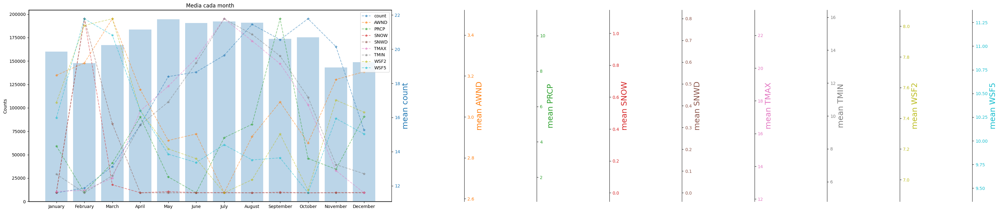

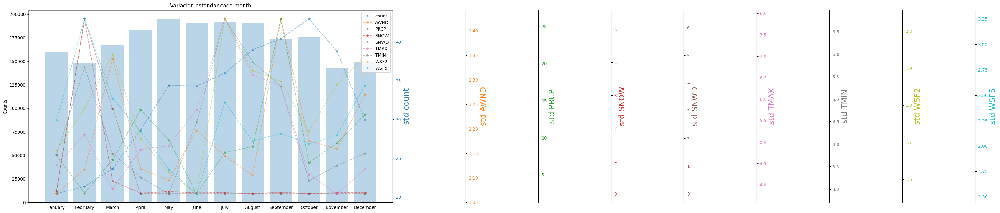

In [13]:
plot_freq(**kwargs_month);  
plot_freq(**kwargs_month, func ="std"); 

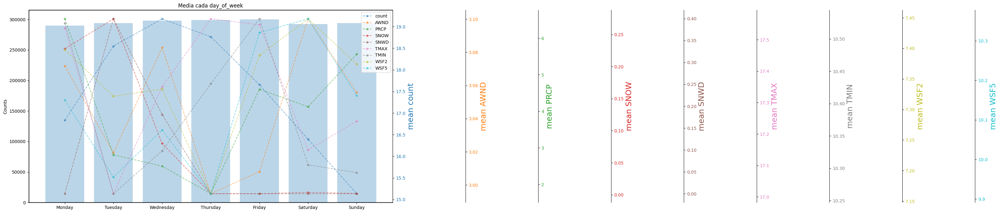

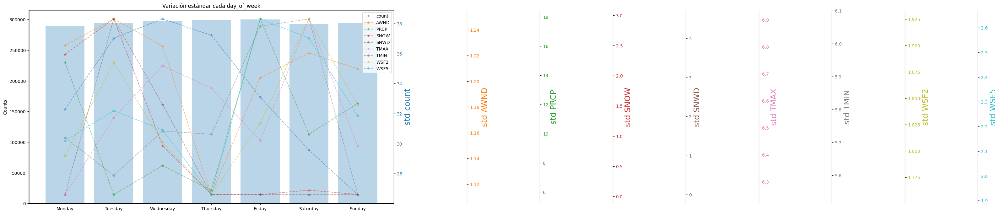

In [14]:
plot_freq(**kwargs_dow);
plot_freq(**kwargs_dow, func ="std");

month:
 · January      : μ 11.59;  σ  20.40
 · February     : μ 11.86;  σ  21.34
 · March        : μ 13.13;  σ  23.62
 · April        : μ 15.56;  σ  28.65
 · May          : μ 18.39;  σ  34.40
 · June         : μ 18.66;  σ  34.31
 · July         : μ 19.64;  σ  35.98
 · August       : μ 21.45;  σ  38.98
 · September    : μ 20.56;  σ  40.45
 · October      : μ 21.78;  σ  42.99
 · November     : μ 20.14;  σ  38.82
 · December     : μ 15.27;  σ  29.93
day_of_week:
 · Monday       : μ 16.83;  σ  32.29
 · Tuesday      : μ 18.55;  σ  37.03
 · Wednesday    : μ 19.18;  σ  38.31
 · Thursday     : μ 18.76;  σ  37.22
 · Friday       : μ 17.65;  σ  33.10
 · Saturday     : μ 16.40;  σ  29.57
 · Sunday       : μ 15.13;  σ  26.60


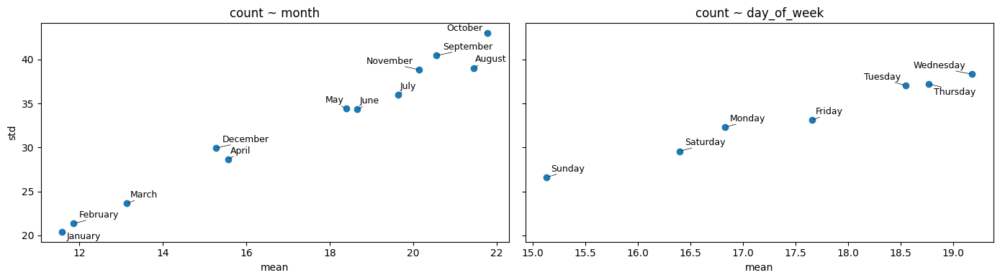

In [15]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4), sharey=True)
plot_statisticsEachCat(_df_month, ax1, custom_order=custom_order_month)
plot_statisticsEachCat(_df_dow, ax2,'day_of_week',ylabel=False, custom_order=custom_order_dow)
plt.tight_layout();

In [30]:
def plot_hist2d_month(month_indices = list(range(6))):
    period = 'month'
    kwargs['period'] = period

    # filter months [avoid low memory kill proccess]
    custom_order_month_filtered = np.array(custom_order_month)[month_indices].tolist()
    _df = _df_month[_df_month[period].isin(custom_order_month_filtered)].copy()

    _df = _df.merge(df_trip_biki_station_start, on="start_station_id")
    _df = _df[["count", kwargs['x_col'], kwargs['y_col'], kwargs['period']]]

    kwargs['custom_order']= custom_order_month_filtered
    return plot_hist2d(_df, **kwargs)

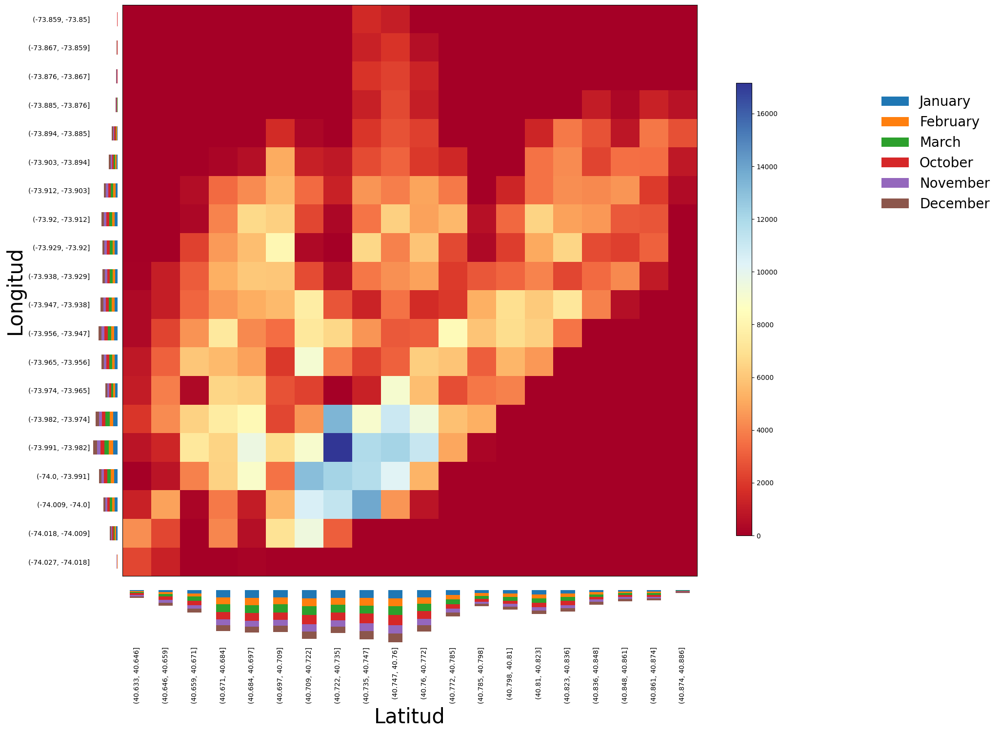

In [31]:
kwargs = dict(custom_order=custom_order_month, x_col="start_lat", y_col="start_lng")
winter_semester = [0,1,2]+[9,10,11]
plot_hist2d_month(winter_semester)

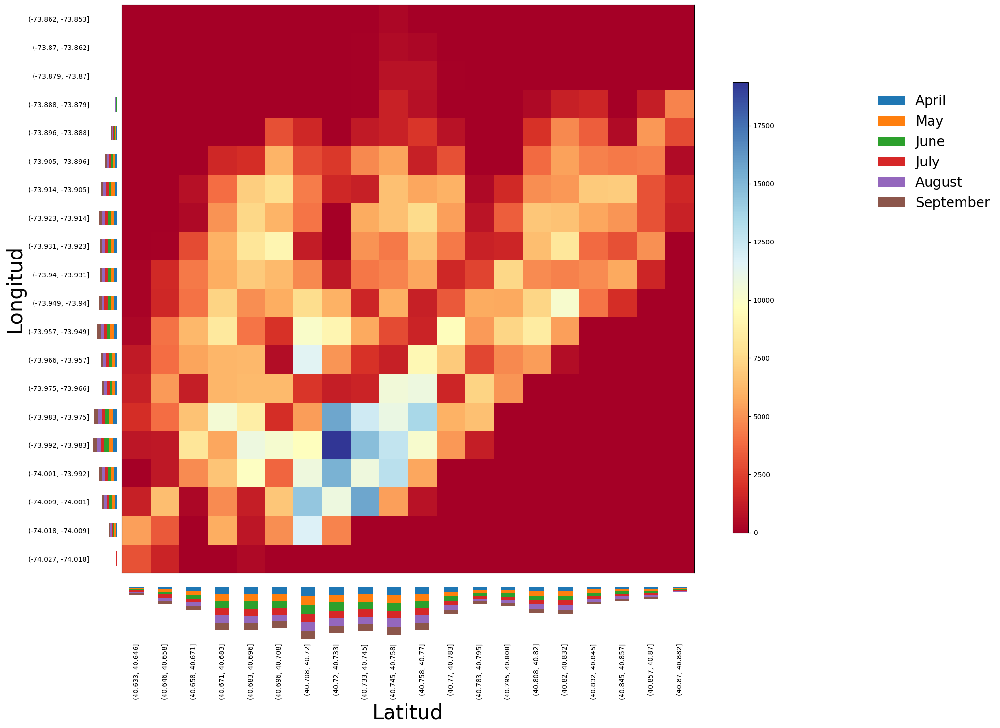

In [32]:
plot_hist2d_month(month_indices = list(range(3,9))) # summer semester

In [33]:
del _df_month # free memory

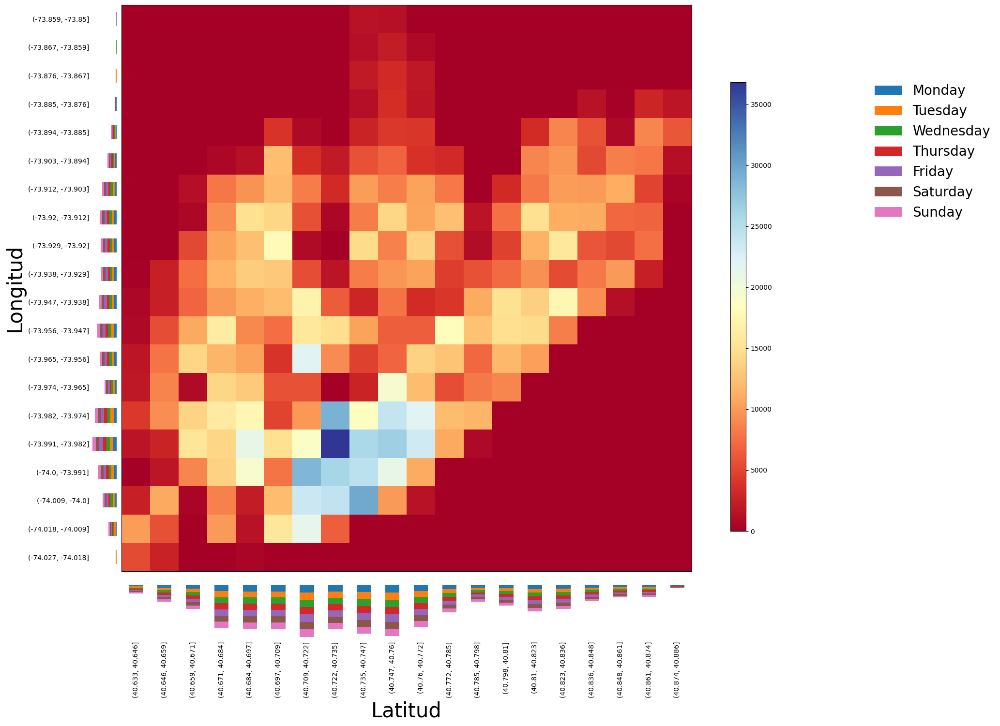

In [34]:
period = 'day_of_week'
kwargs['period'] = period
kwargs['custom_order']=custom_order_dow
_df = _df_dow.merge(df_trip_biki_station_start, on="start_station_id")
_df = _df[["count", kwargs['x_col'], kwargs['y_col'], kwargs['period']]]
  
plot_hist2d(_df, **kwargs)

In [35]:
del _df_dow # free memory

## Diagrama de caja y bigotes (box plot)

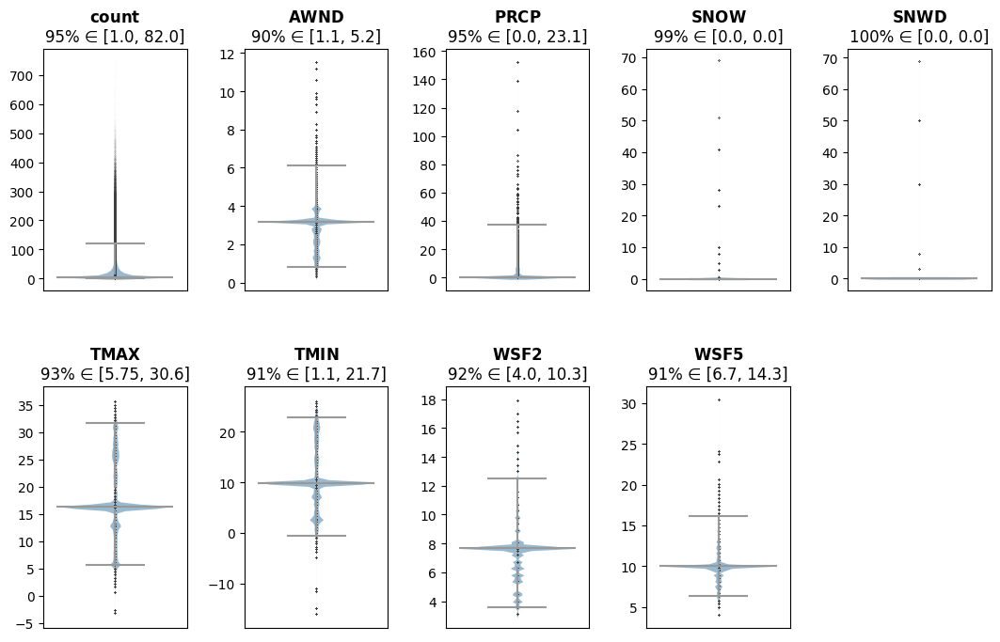

In [36]:
plotlyBool=False; # True just if few rows
with warnings.catch_warnings():
    matplotlib_plotBox01(df_merge[cols_num], plotlyBool=plotlyBool);

## Correlaciones

In [5]:
def plot_corr(df, cols, annotbool=True, figsize=(7, 7), scale=100, cmap='RdYlBu', title="Correlaciones (%)"):
    corr = df[cols].corr()
    fig = plt.figure(figsize=figsize)
    sns.heatmap(corr*scale, annot=annotbool, mask=np.triu(corr), fmt=".1f", 
                cmap=cmap, vmin=-1*scale, vmax=1*scale)
    plt.tick_params(axis='both', which='both', left=False, right=False, bottom=False, top=False)
    plt.title(title, fontsize=14)
    return corr, fig;

In [6]:
def nor(x):
    range_vals = max(x) - min(x)
    if not range_vals: return x
    return (x - min(x))/range_vals

if False:
    df_norm = copy.deepcopy(df_merge.loc[:,cols_num])
    for col in cols_num:
        df_norm[col] = nor(df_norm[col])
    corr, fig_corr = plot_corr(df_norm, cols_num);

The main differences between StandardScaler and Normalizer in scikit-learn are:

- StandardScaler standardizes features by removing the mean and scaling to unit variance. It is applied column-wise.
- Normalizer rescales each sample (row) independently to unit norm. It is applied row-wise

For calculating correlation, it is generally recommended to use StandardScaler rather than Normalizer. StandardScaler is preferred for correlation calculations, as it standardizes features by removing the mean and scaling to unit variance, making it suitable for linear models and correlation analysis.<br>
Normalizer, on the other hand, rescales each sample (row) independently to unit norm, which is more suitable for scenarios where row-wise normalization is required, rather than for correlation calculations.<br>
Therefore, in the context of calculating correlation, using StandardScaler would be the more appropriate choice to standardize the features and ensure accurate correlation analysis.

https://stackoverflow.com/questions/70785712/confused-about-standardization-before-pca

When should you, or shouldn't you scale the data?

You should scale the data if
- Your data are measurements of different units.
- Your columns are of completely different scales (thus obviously one will dominate the variance).
- Your data are measurements of different sensors.

You should not scale the data if

- Your data are different dimensions of the same measurement, such as 3d points - because you WANT the (for example) x axis to dominate the variance, if all axes are of the same scale.
- Your data are measurements of the same multi-dimensional sensor, such as an image.

It seems the last point is the case in the tutorial - 8x8 digits are really a 64-channel sensor. Each pixel is already normalized in the sensor (since the dataset is assumed to be clean, I believe).

PCA won't work if
- Your data is of different (constant) scales, but you want to keep the absolute differences in the data.
- Your data has a variance of scales.
- Many more reasons not mentioned here.

it is not hard to find examples when PCA doesn't work. It is only a linear model, after all.

In [9]:
# Standardize the data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_merge_data_scale = scaler.fit_transform(df_merge[cols_num])

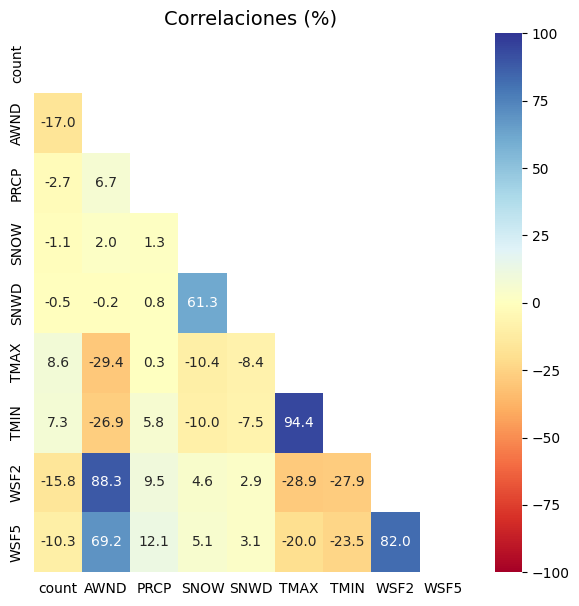

In [25]:
corr, fig_corr = plot_corr(pd.DataFrame(data=df_merge_data_scale, columns=cols_num), cols_num);

In [41]:
# si casi todo son correlaciones nulas, entonces busca correlaciones entre bicicletas próximas, i.e. de misma estación meteo.
if 0:
    weather_station = 'USC00283704' # for example
    df_norm = copy.deepcopy(df_merge[df_merge['closest_weather_station'] == weather_station].loc[:,cols_num])
    for col in cols_num:
        df_norm[col] = nor(df_norm[col])
    corr = plot_corr(df_norm, cols_num);

## PCA & Singular Value Decomposition (SVD)

Tanto el análisis de componentes principales, principal componente analysis (PCA) en inglés, como la descomposición de valores singulares, singular value decomposition (SVD) en inglés, son técnicas que nos permitan trabajar con nuevas características llamadas componentes, que ciertamente son independientes entre sí. En realidad, estas dos técnicas nos permiten representar el juego de datos en un nuevo sistema de coordenadas que denominamos componentes principales. Este sistema está mejor adaptado a la distribución del juego de datos, de forma que recoge mejor su variabilidad.

Aplicamos el análisis de componentes principales al dataset.

In [10]:
n_components=min([9, len(df_merge_data_scale)])
pca = PCA(n_components=n_components)
pca.fit(df_merge[cols_num].values);

In [11]:
n_components

9

A continuación, se muestra un histograma para ver el peso de cada atributo sobre el conjunto total de datos:

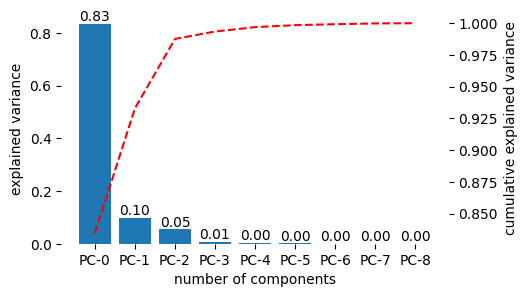

In [12]:
pca_xticks = plot_pca_variance(pca, n_components);

En este ejercicio se decidió utilizar el método de Káiser para decidir cuales de las variables obtenidas serán escogidas. Este criterio mantendrá todas aquellas variables cuya varianza sea superior a 1.

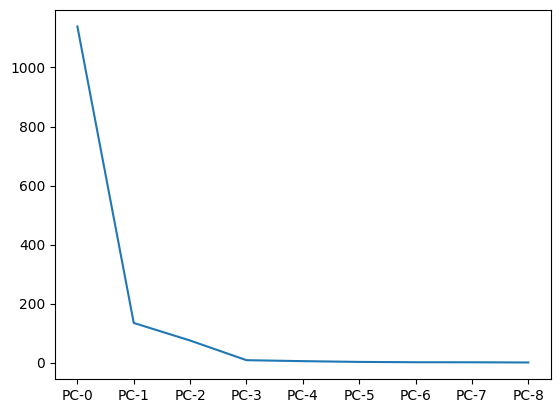

In [13]:
# Calculamos la varianza de los componentes principales a partir de la desviación estándar
pca_var = pca.explained_variance_
plt.plot(pca_xticks, pca_var);

Con los resultados obtenidos es muy complicado decidir cuáles son los componentes principales componentes a escoger. Este hecho podría estar causado por no haber escalado los datos previamente. Por lo tanto, el siguiente paso es escalar los datos y volver a calcular la varianza para ver qué datos selecciona.

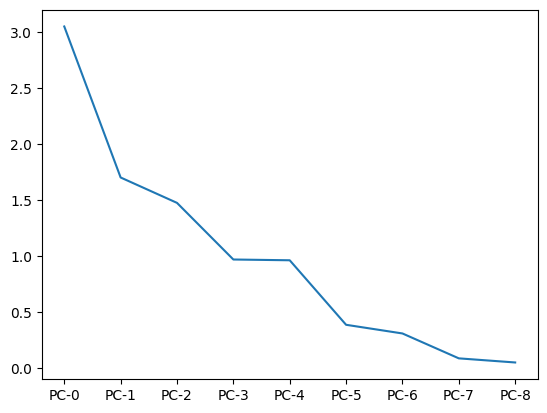

In [14]:
# Compute the principal components with standardized the data
pca_scale = PCA()
pca_scale.fit_transform(df_merge_data_scale)

# Show the variance of the principal components (eigenvalues)
pca_scale_var = pca_scale.explained_variance_
plt.plot(pca_xticks, pca_scale_var);

In [15]:
mask = np.where(pca_scale_var >= .9)[0] # TODO, edita 1 ó 0.9 si gráfica es muy próximo
# n_components = 3
n_components=len(mask)
n_components

5

In [16]:
# Compute the principal components
pca_scale = PCA(n_components)
pca_scale.fit_transform(df_merge_data_scale);

Después de analizar la varianza y aplicando el criterio de Káiser nos quedaremos con los componentes principales [1º,2º,3º y 4º  TODO] que son los superiores a 1 (ó a 0.9). Este criterio tiene el problema de sobreestimar el número de factores, pero a pesar de ello es el que aplicaremos para analizar los resultados.

Mostramos el histograma de porcentaje de varianza explicado con los datos escalados:

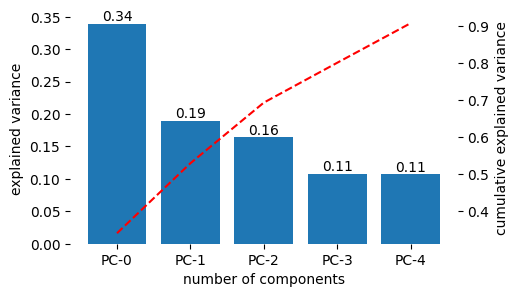

In [17]:
pca_xticks = plot_pca_variance(pca_scale, n_components);

Los valores propios se pueden utilizar para determinar el número de componentes principales a retener después de la PCA (Kaiser 1961):
- Un valor propio > 1 indica que los PCs representan más varianza de la que representa una de las variables originales de los datos estandarizados. Esto se utiliza habitualmente como punto de corte para el cual se conservan los PCs. Esto solo es cierto cuando los datos están estandarizados.
- También podemos limitar el número de componentes a este número que representa una determinada fracción de la varianza total. Por ejemplo, si estamos satisfecho con el [80% TODO] de la varianza total explicada, usamos el número de componentes para conseguirlo que son los [4 TODO] componentes principales vistos antes.

### Contribución

Continuamos con el análisis de los componentes principales. Después de aplicar el método Káiser se han seleccionado los [4 TODO] componentes principales.

Las contribuciones de las variables en la contabilización de la variabilidad de un determinado componente principal se expresan en porcentaje.

Las variables que están correlacionadas con PC-0 (es decir, 1º dimensión) y PC-1 (es decir, 2º dimensión) son las más importantes para explicar la variabilidad en el conjunto de datos.

Las variables que no están correlacionadas con ningún PC o con las últimas dimensiones son variables con una contribución baja y se pueden eliminar para simplificar el análisis global.

La contribución de las variables se puede extraer de la siguiente manera:

,count,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5
PC-0,0.13,0.49,0.06,0.08,0.07,0.36,0.36,0.51,0.46
PC-1,0.05,0.23,0.11,0.52,0.51,0.38,0.38,0.23,0.24
PC-2,0.02,0.13,0.19,0.47,0.48,0.45,0.46,0.17,0.21
PC-3,0.39,0.12,0.89,0.03,0.03,0.12,0.07,0.12,0.10
PC-4,0.91,0.01,0.40,0.02,0.02,0.07,0.06,0.03,0.10


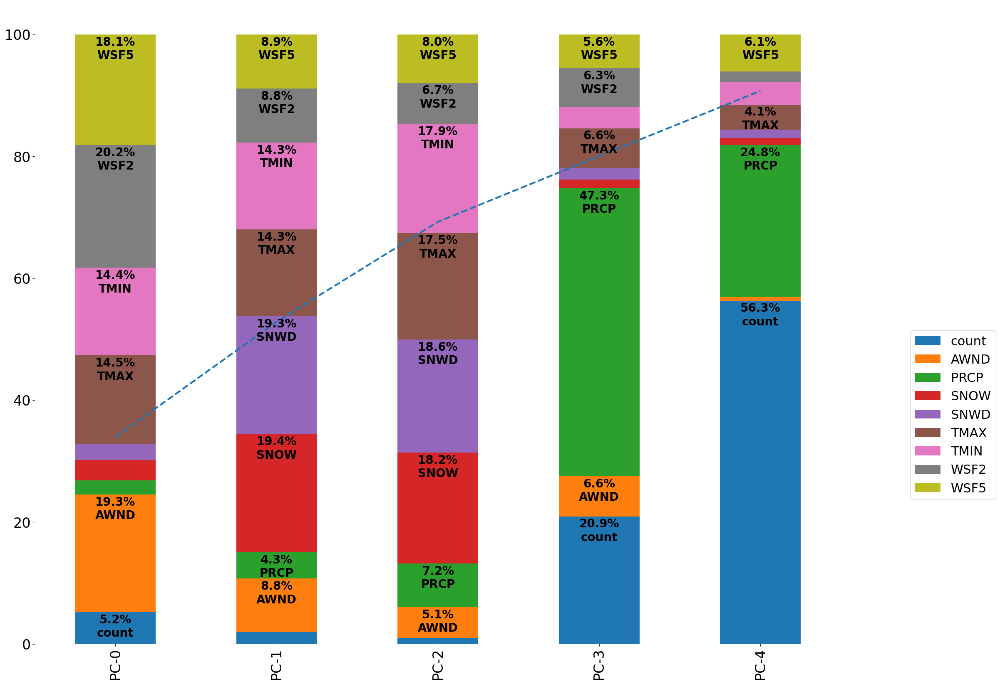

In [18]:
df_coef_scale = plot_PCA_coef_portion(pca_scale, cols_num, n_components);
df_coef_Kaiser = df_coef_scale.iloc[:n_components,:]

# https://github.com/dexplo/dataframe_image/issues/74#issuecomment-2015150574
plt.rcParams["image.cmap"] = 'RdYlBu'
df_coef_Kaiser.style.set_caption("pca.components_").background_gradient(cmap=None, axis=1).format("{:.2f}")

### Calidad de representación: factor coordinates (coord) & squared cosine values (cos2)

In Principal Component Analysis (PCA), factor coordinates and squared cosine values are two key outputs that help in understanding the relationships between variables and the principal components. These outputs are particularly useful in visualizing the data and identifying patterns in the data.

**Correlation circle**. **Factor coordinates (coord)** are the decomposition of each observation or variable on the principal components. They enable the points to be plotted and allow for an interpretation of the angles between the variables, observations, and axes. This visualization helps in understanding how the variables are related to each other and how they contribute to the principal components.

**Squared cosine values (cos2)**, also known as squared loadings or cos2, represent the correlation of the variables with each principal component (or axis). They are directly measured by squaring the cosines of the angles between the vectors which have the points as coordinates. Squared cosine values take values between 0 and 1. A squared cosine close to 1 indicates that the variable has a high correlation with the principal component. <br>
These values are used to determine the quality of representation of variables on the factor map. A high squared cosine value indicates a good representation of the variable on the principal component, meaning the variable is positioned close to the circumference of the correlation circle. Conversely, a low squared cosine value indicates that the variable is not perfectly represented by the PCs, and it is positioned closer to the center of the circle.

In summary, factor coordinates and squared cosine values are essential outputs in PCA analysis. They provide insights into the relationships between variables and principal components, helping in the interpretation of the results and the identification of patterns in the data.

La calidad de representación de las variables en el mapa de factores se denomina cos2 (coseno cuadrado, coordenadas cuadradas).

- Un cos2 elevado indica una buena representación de la variable en el componente principal. En este caso, la variable se coloca cerca de la circunferencia del círculo de correlación (radio 1).
- Un cos2 bajo indica que la variable no está perfectamente representada por los PC. En este caso, la variable está cerca del centro del círculo.

Para una variable dada, la suma del cos2 de todos los componentes principales es igual a uno. [Cuidado pq esto depende de usar "pca_scale.explained_variance_ratio_" ó "pca_scale.explained_variance_" para definir cos2]

Si una variable está perfectamente representada por solo dos componentes principales (1º dimensión y 2º dimensión), la suma del cos2 en estos dos PCs es igual a uno. En este caso las variables se colocarán en el círculo de correlaciones.

Para algunas de las variables, pueden ser necesarios más de 2 componentes para representar perfectamente los datos. En este caso las variables se sitúan dentro del círculo de correlaciones.

En resumen:
- Los valores de coord y cos2 se utilizan para estimar la calidad de la representación
- Cuanto más próxima esté una variable al círculo de correlaciones, mejor será su representación en el mapa de factores (y más importante es interpretar estos componentes)
- Las variables que están próximas en el centro de la trama son menos importantes para los primeros componentes.

Podemos acceder al cos2 de la siguiente manera:

In [19]:
# Get the factor coordinates and squared cosine values
# https://cinnipatel.medium.com/principal-component-analysis-python-a6214346cae7 ~ PCA biplot = PCA score plot + loading plot

# Extract explained variance ratio and eigenvectors
exp_var = pca_scale.explained_variance_ratio_
# exp_var = pca_scale.explained_variance_
eigenvectors = pca_scale.components_

# Scale eigenvectors
s_eigenvectors = eigenvectors.T * np.sqrt(exp_var)

    
coord = s_eigenvectors
coord = coord.T
cos2 = coord ** 2

coord = pd.DataFrame(data=coord, columns=cols_num, index=pca_xticks).iloc[:n_components,:] 
cos2 = pd.DataFrame(data=cos2, columns=cols_num, index=pca_xticks).iloc[:n_components,:]

display(coord.style.set_caption("coord").background_gradient(cmap=None, axis=1).format("{:.2f}"))
display(cos2.style.set_caption("cos2").background_gradient(cmap=None, axis=1).format("{:.2f}"))

,count,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5
PC-0,-0.08,0.28,0.03,0.05,0.04,-0.21,-0.21,0.30,0.27
PC-1,0.02,-0.10,-0.05,0.22,0.22,-0.17,-0.16,-0.10,-0.10
PC-2,-0.01,0.05,0.08,0.19,0.19,0.18,0.19,0.07,0.08
PC-3,-0.13,-0.04,0.29,-0.01,-0.01,-0.04,-0.02,-0.04,-0.03
PC-4,0.30,-0.00,0.13,-0.01,-0.01,-0.02,-0.02,0.01,0.03


,count,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5
PC-0,0.01,0.08,0.00,0.00,0.00,0.05,0.04,0.09,0.07
PC-1,0.00,0.01,0.00,0.05,0.05,0.03,0.03,0.01,0.01
PC-2,0.00,0.00,0.01,0.04,0.04,0.03,0.04,0.00,0.01
PC-3,0.02,0.00,0.08,0.00,0.00,0.00,0.00,0.00,0.00
PC-4,0.09,0.00,0.02,0.00,0.00,0.00,0.00,0.00,0.00


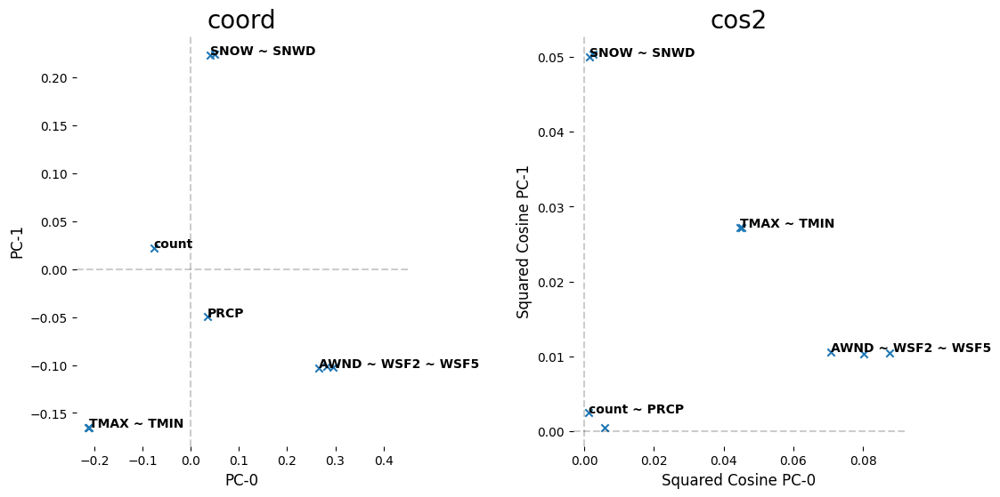

In [20]:
# plot variable coordinates and squared cosine values for first 2 PCA components
_, axs = plot_cos2_coord(cos2, coord, cols_num, closeness=[0.03, 0.025]);
axs[0].set_xlim([None,.45]);

Correlation circle. Factor coordinates (coord). Lo grafico ahora no comparando con "cos2" directamente, sino que sacando los radios de cada vector principal:

/home/xopi/Downloads/TFM_repository/functions/plot_cos2.py:104: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels(


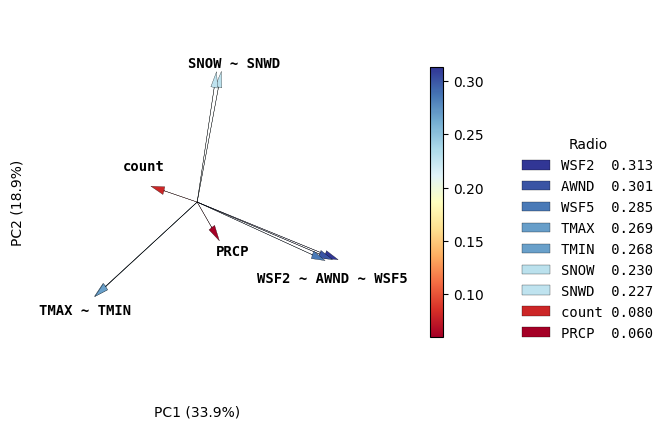

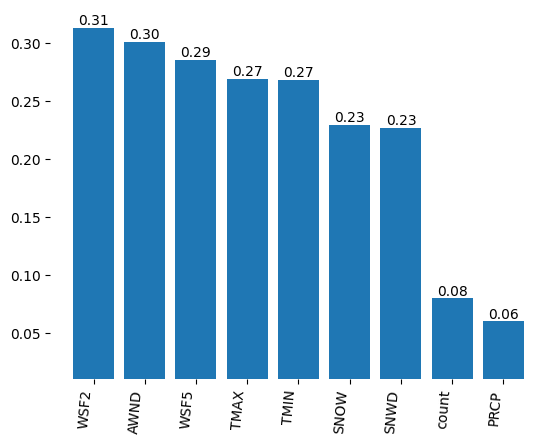

In [21]:
cos2, cols_sorted = plot_cos2(pca_scale, cols_num, closeness=.2)
plt.show()

bars = plt.bar(cols_sorted, cos2)
plt.bar_label(bars, fmt='%.2f')
plt.xticks(rotation=85, ha='right')
plt.box(False)
gap = .05
if min(cos2) > gap:
    plt.ylim(min(cos2) - gap, plt.ylim()[1]);

Correlation circle. Factor coordinates (coord). Ahora lo comparo con la matriz de correlaciones [que vimos previamente al estudio de PCA].

Las flechas del correlation circle:
- donde las variables correlacionadas positivas apuntan a direcciones próximas. Heatmap de gráfica de correlaciones positivas cercanas a 1.
- donde las  variables correlacionadas negativas apuntan a lados opuestos del gráfico. Heatmap de gráfica de correlaciones positivas cercanas a -1.
- donde las  variables poco correlacionadas apuntan a direcciones dispares. Heatmap de gráfica de correlaciones cercanos a 0.

Obsersvese como por ejemplo las flechas de [TODO Tmin-Tmax] apuntan a misma dirección en gráfica de cos2, y en plot de correlaciones muestran altos valores [+97% TODO].

Obsersvese como por ejemplo las flechas de [TODO PRCP] apuntan a dirección aprox. opuesta a [TODO SNWD] en gráfica de cos2, y en plot de correlaciones muestran altos valores negativos [-40% TODO].

Por tanto, el *correlation circle* es excelente, ya que no solo describe las correlaciones entre cada variable y las 2 principales PCA, sino que también describe (según diferencia de dirección de flechas) la correlación entre las varaibles numéricas. Es decir, puede hacer la matriz de correlaciones redundante.

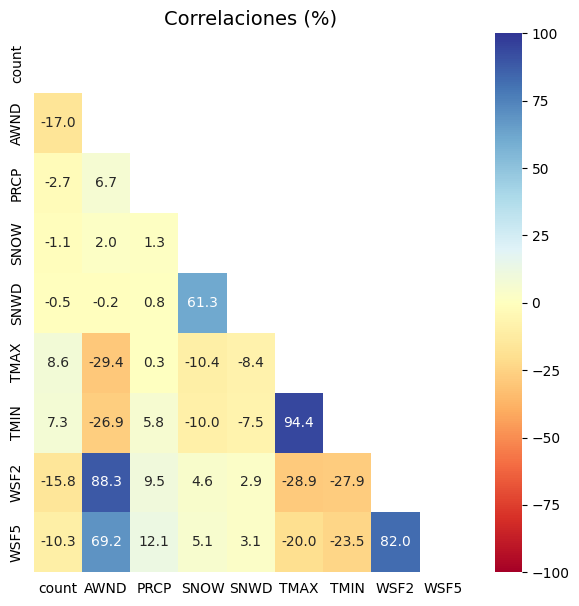

In [26]:
display(fig_corr) # matriz de correlaciones
del fig_corr

### PCA conclusiones

Podrían ahora rehacer los componentes excluyendo las variables que no aportan información (baja contribucción). Una vez rehechas estas nuevas variables sustituyen a las originales que las forman y se podrían utilizar por ejemplo como un indicador de gravedad de accidente puesto que incluye vehículo en movimiento, parado, peatones, conductores y otros implicados en una sola variable.

### Singular Value Decomposition (SVD)

Todo el proceso realizado con PCA se puede realizar nuevamente con SVD.

file:///home/xopi/MEGAsync/IT_xopi_UOC_MasterDataScience/01_Mineria_de_datos/PRA1/202301/JuanGabrielMarineroTarazona-PRA1.html

sklearn.decomposition.TruncatedSVD no necesita una normalización previa como PCA:

    [...] this estimator does not center the data before computing the singular value decomposition. This means it can work with sparse matrices efficiently.

Y es un algoritmo muy rápido: ver método Computing Truncated SVD embedding del ejemplo Manifold learning on handwritten digits.


In [27]:
from sklearn.decomposition import TruncatedSVD
from scipy.sparse import csr_matrix
import numpy as np

svd = TruncatedSVD(n_components=n_components, n_iter=7, random_state=42)
svd.fit(df_merge[cols_num].values)

TruncatedSVD(n_components=5, n_iter=7, random_state=42)

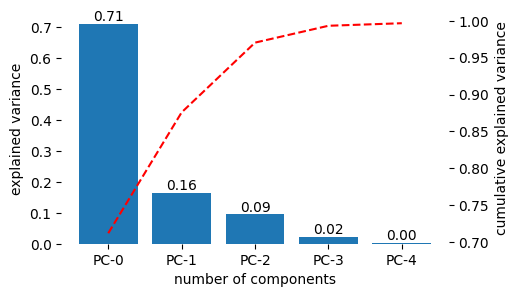

In [28]:
plot_pca_variance(svd, n_components);

,count,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5
PC-0,0.92,0.04,0.06,0.00,0.00,0.30,0.18,0.11,0.16
PC-1,0.40,0.11,0.21,0.00,0.00,0.65,0.41,0.25,0.35
PC-2,0.03,0.01,0.97,0.00,0.00,0.20,0.11,0.03,0.04
PC-3,0.00,0.24,0.07,0.03,0.03,0.26,0.45,0.50,0.64
PC-4,0.00,0.03,0.00,0.54,0.84,0.00,0.03,0.02,0.02


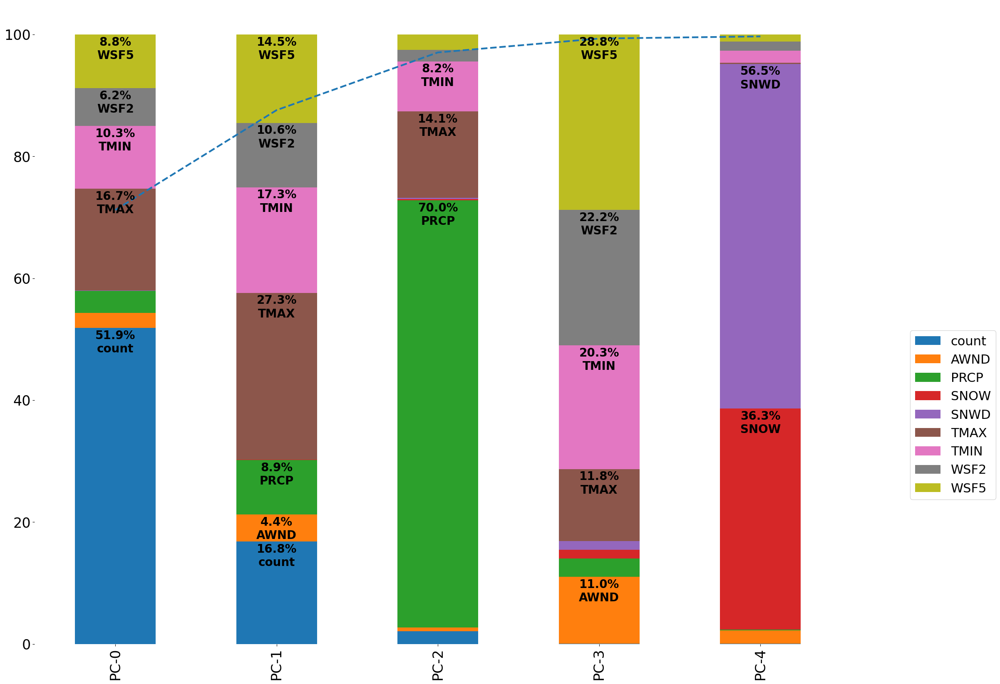

In [29]:
df_coef = plot_PCA_coef_portion(svd, cols_num, n_components);
df_coef_Kaiser = df_coef.iloc[:n_components,:]

# https://github.com/dexplo/dataframe_image/issues/74#issuecomment-2015150574
plt.rcParams["image.cmap"] = 'RdYlBu'
df_coef_Kaiser.style.set_caption("pca.components_").background_gradient(cmap=None, axis=1).format("{:.2f}")

/home/xopi/Downloads/TFM_repository/functions/plot_cos2.py:104: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels(


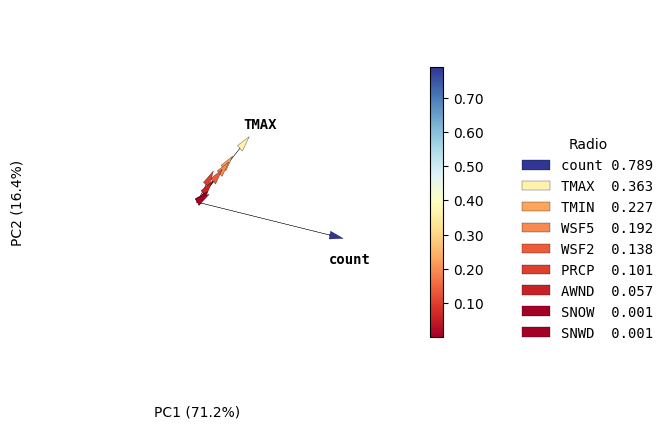

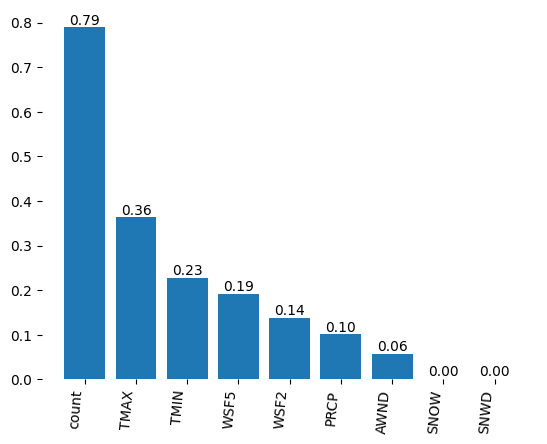

In [30]:
cos2, cols_sorted = plot_cos2(svd, cols_num, closeness=.02, radius_min_to_annotate=0.3)
plt.show()

bars = plt.bar(cols_sorted, cos2)
plt.bar_label(bars, fmt='%.2f')
plt.xticks(rotation=85, ha='right')
plt.box(False)
gap = .05
if min(cos2) > gap:
    plt.ylim(min(cos2) - gap, plt.ylim()[1]);

## Deccision Tree

### A: Dataset original

In [2]:
filename = pickle_folder + "df_tripdata_2023_merge.pkl"
df_merge = dump_or_load(filename, dump=False)

Opened <_io.BufferedReader name='./databases/pickle/df_tripdata_2023_merge.pkl'>


In [3]:
df = df_merge.copy()
df.head()

,started_at,start_station_id,member_T_casual_F,classic_bike,docked_bike,electric_bike,count,closest_weather_station,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5,holiday,working_day,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
0,2023-01-01,2733.03,False,True,False,False,4,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
1,2023-01-01,2733.03,True,True,False,False,2,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
2,2023-01-01,2782.02,False,True,False,False,1,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
3,2023-01-01,2782.02,True,False,False,True,5,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
4,2023-01-01,2782.02,True,True,False,False,4,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True


#### A:a Todos los trips

##### A:a:I:α 4 categorías

In [4]:
# convert df_merge["count"] in categorical based on percentiles
# 1st group till percentil 25, 2nd group in between percentil 25 and percentil 50, etc.
percentiles = [0, 0.25, 0.5, 0.75, 1]

# Compute percentiles and convert "count" to categorical
count_percentile, bins = pd.qcut(df["count"], q=percentiles, labels=False, retbins=True)

In [5]:
count_percentile.value_counts()

count
0    635607
2    511713
3    510749
1    409741
Name: count, dtype: int64

In [6]:
len(df) == count_percentile.value_counts().sum()

True

In [7]:
bins

array([  1.,   2.,   5.,  16., 748.])

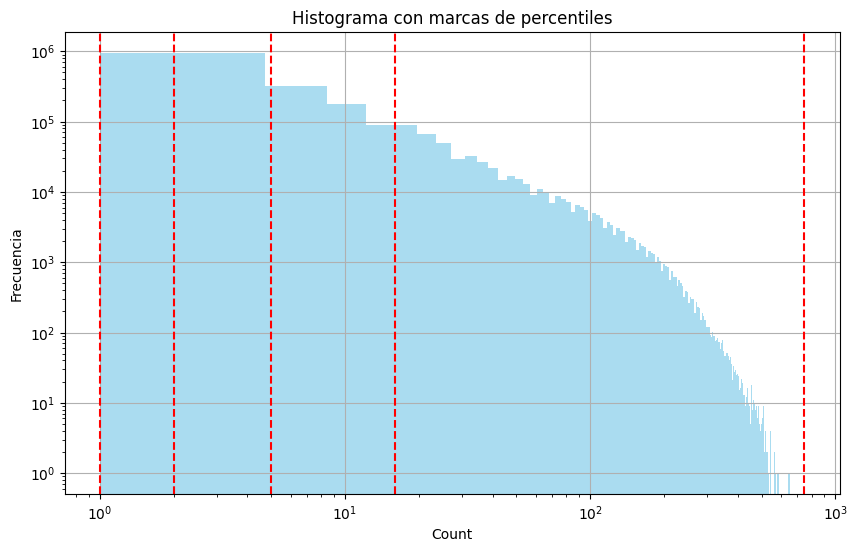

In [8]:
plot_hist_log(df, bins);

In [9]:
df.head(3)

,started_at,start_station_id,member_T_casual_F,classic_bike,docked_bike,electric_bike,count,closest_weather_station,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5,holiday,working_day,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
0,2023-01-01,2733.03,False,True,False,False,4,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
1,2023-01-01,2733.03,True,True,False,False,2,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
2,2023-01-01,2782.02,False,True,False,False,1,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True


In [10]:
X, y, _ = get_X_y(df, count_percentile)

Accuracy del modelo  0.5349
Recall del modelo    0.4983
F1 score del modelo  0.4546


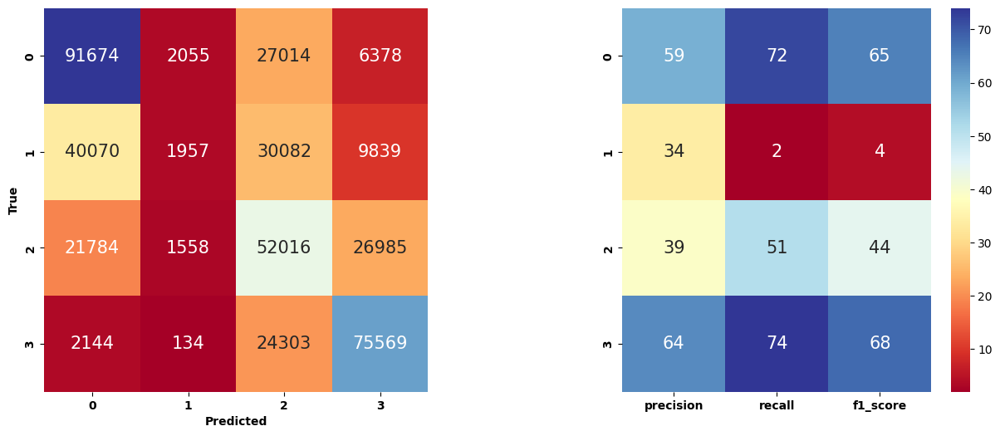

In [20]:
from sklearn.tree import DecisionTreeClassifier

plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X, y);

##### A:a:I:β 4 cateogrías con oversampling

<s>TODO</s> --> NO falta de hacer code porque incluso los grupos mayoritarios tienen bajo F1_score. Descarta intentar clasificar estas 4 categorías.

##### A:a:II:α 2 categorías

In [21]:
perc = .95

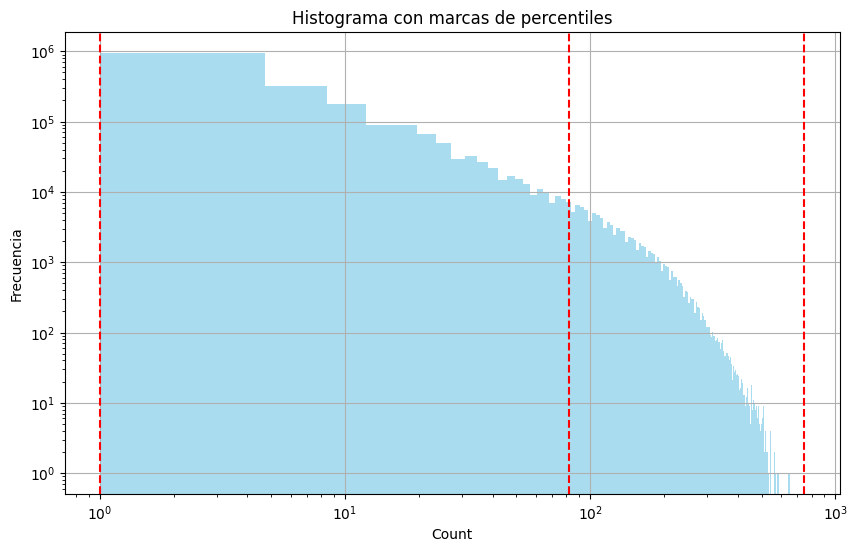

In [22]:
count_percentile, bins = pd.qcut(df["count"], q=[0, perc, 1], labels=False, retbins=True)
plot_hist_log(df, bins);

Accuracy del modelo  0.9505
Recall del modelo    0.0262
F1 score del modelo  0.0495
ROC                  0.5123


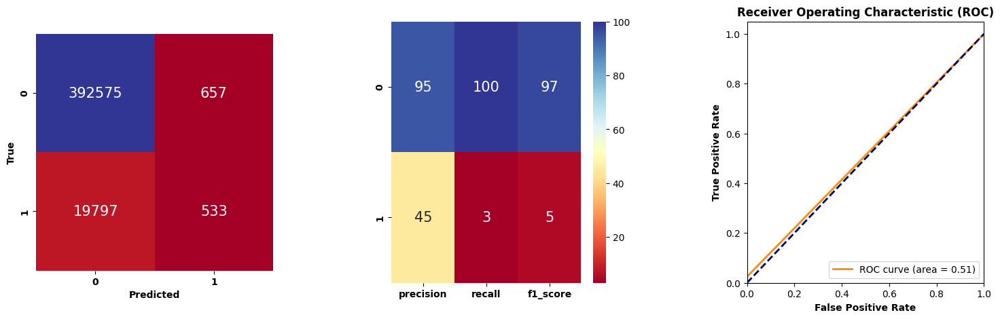

In [23]:
X, y, x_cols = get_X_y(df, count_percentile)
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X, y, ROC_plot=True, figsize=(18,5));

##### A:a:II:β-γ-δ 2 cateogrías con oversampling

Aplicamos oversampling, ya que por la propia definición de percentil, habrá muchos menos en grupo menor del percentil 5 (si perc=5) ó en grupo mayor de 95 (si perc=.95).

<img align="center" style="width:500px;" src="https://miro.medium.com/v2/resize:fit:720/format:webp/1*7xf9e1EaoK5n05izIFBouA.png">

RandomOverSampler

In [24]:
%%time
X_resampled, y_resampled = get_oversampling(X,y,oversampler=RandomOverSampler)

Class distribution before OverSampler: Counter({0: 1966159, 1: 101651})
Class distribution after  OverSampler: Counter({0: 1966159, 1: 1966159})


Accuracy del modelo  0.8893
Recall del modelo    0.9647
F1 score del modelo  0.8971
ROC                  0.8893


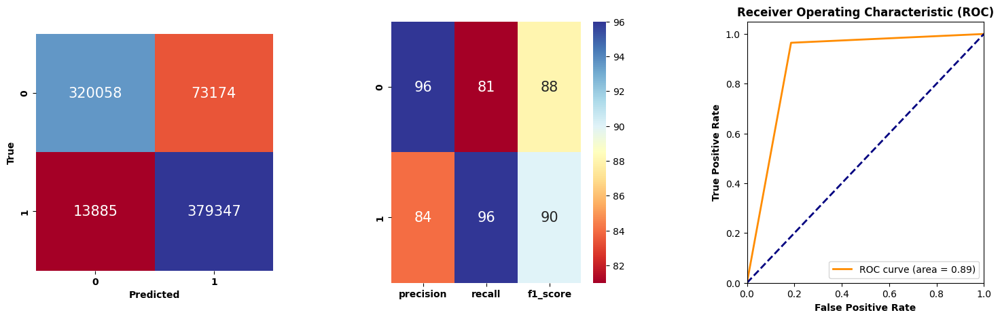

In [25]:
%%time
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

SMOTE

In [26]:
%%time
X_resampled, y_resampled = get_oversampling(X,y,oversampler=SMOTE, kwargs=dict(sampling_strategy=.8, random_state=42))

Class distribution before OverSampler: Counter({0: 1966159, 1: 101651})
Class distribution after  OverSampler: Counter({0: 1966159, 1: 1572927})


Accuracy del modelo  0.8829
Recall del modelo    0.9591
F1 score del modelo  0.8793
ROC                  0.8905


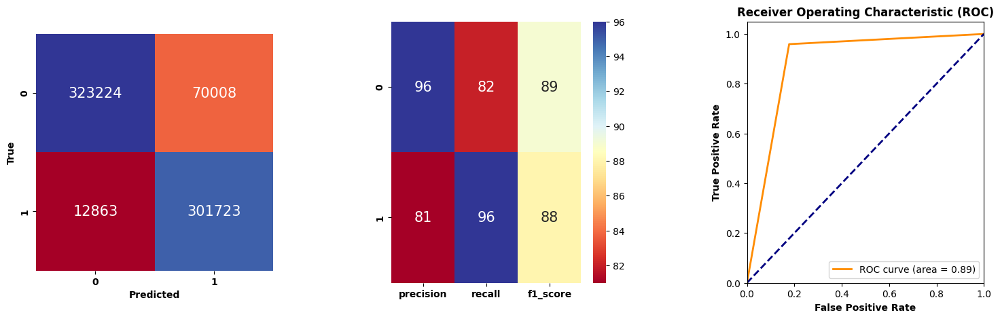

In [27]:
%%time
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

ADASYN

In [ ]:
%%time
X_resampled, y_resampled = get_oversampling(X,y,oversampler=ADASYN, kwargs=dict(sampling_strategy=.8, random_state=42))

Class distribution before OverSampler: Counter({0: 1966159, 1: 101651})


In [ ]:
%%time
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

#### A:b Parkings próximos

In [5]:
mask = df["closest_weather_station"] == df["closest_weather_station"][999]

In [6]:
len(set(df[mask]["start_station_id"])) # parkings cercanos a esa estación meteo.

1700

##### A:b:I:α 4 categorías

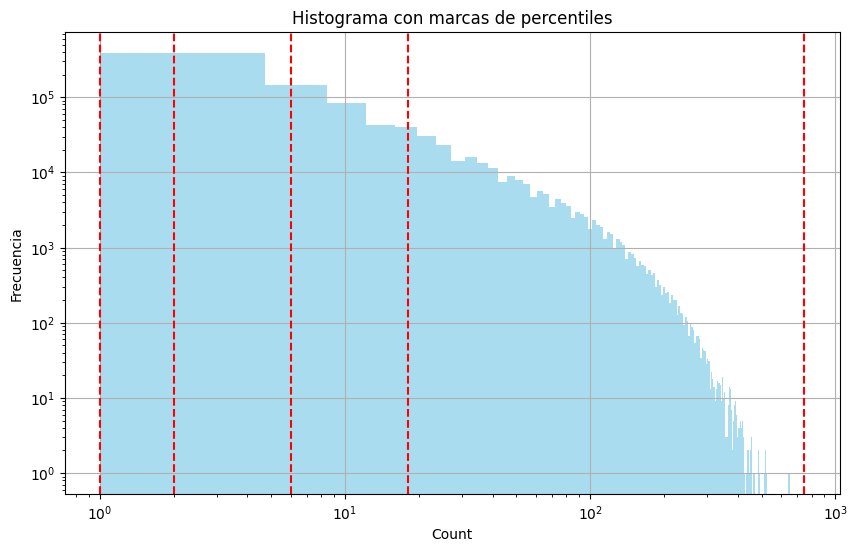

In [7]:
count_percentile, bins = pd.qcut(df["count"][mask], q=percentiles, labels=False, retbins=True)
plot_hist_log(df[mask], bins);

Accuracy del modelo  0.4952
Recall del modelo    0.4850
F1 score del modelo  0.4463
CPU times: user 3.89 s, sys: 1.11 s, total: 5 s
Wall time: 4.85 s


(DecisionTreeClassifier(),
 [0.4951814481612185, 0.4849513809602709, 0.44632954579673134, None])

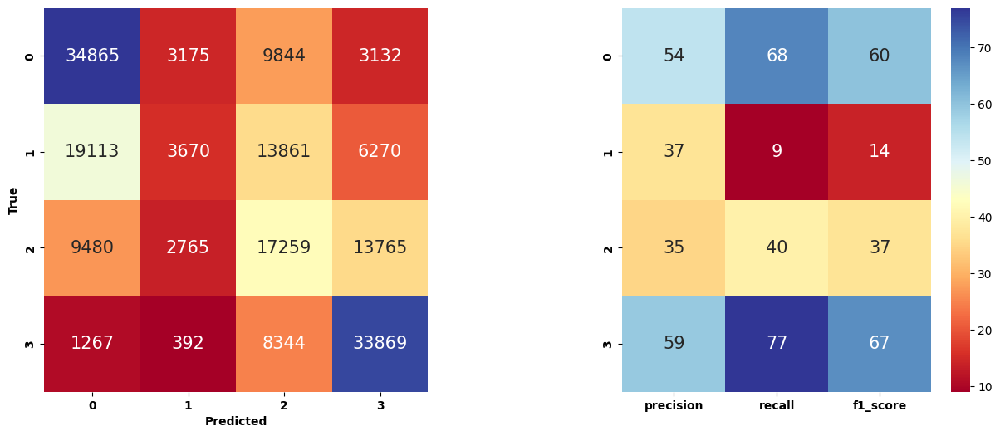

In [8]:
%%time
X, y, x_cols = get_X_y(df[mask], count_percentile)
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X, y);

##### A:b:I:β 4 cateogrías con oversampling

<s>TODO</s> --> NO falta de hacer code porque incluso los grupos mayoritarios tienen bajo F1_score. Descarta intentar clasificar estas 4 categorías.

##### A:b:II:α 2 categorías

Resultados todavía muy pobres. Así que primero filtro a pocos parking de bicis. Y parto en vez de percentil 5 en el 90, para ahora estudiar si esos días tienen algo de especial para que se use tanto la bici.

In [9]:
perc = 0.95

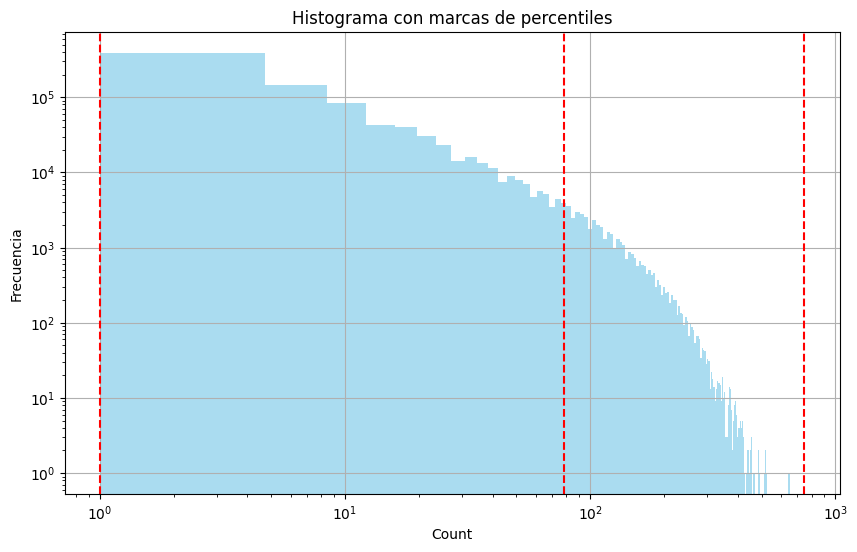

In [10]:
count_percentile, bins = pd.qcut(df["count"][mask], q=[0, perc, 1], labels=False, retbins=True)
plot_hist_log(df[mask], bins);

/home/xopi/Downloads/TFM_venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/xopi/Downloads/TFM_venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/xopi/Downloads/TFM_venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(r

Accuracy del modelo  0.9508
Recall del modelo    0.0000
F1 score del modelo  0.0000
ROC                  0.5000


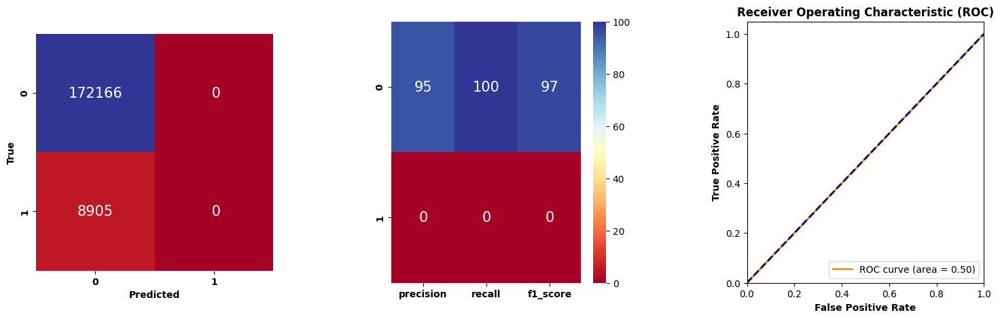

In [11]:
X, y, _ = get_X_y(df[mask], count_percentile)
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X, y, ROC_plot=True, figsize=(18,5));

##### A:b:II:β-γ-δ 2 cateogrías con oversampling

RandomOverSampler

In [12]:
%%time
X_resampled, y_resampled = get_oversampling(X,y,oversampler=RandomOverSampler)

Class distribution before OverSampler: Counter({0: 860827, 1: 44526})
Class distribution after  OverSampler: Counter({0: 860827, 1: 860827})
CPU times: user 1.26 s, sys: 531 ms, total: 1.79 s
Wall time: 1.8 s


Accuracy del modelo  0.8516
Recall del modelo    0.9683
F1 score del modelo  0.8671
ROC                  0.8516
CPU times: user 5.93 s, sys: 1.12 s, total: 7.05 s
Wall time: 6.88 s


(DecisionTreeClassifier(),
 [0.8515759545321218,
  0.9683094705660268,
  0.8670905662830766,
  0.8515762935465496])

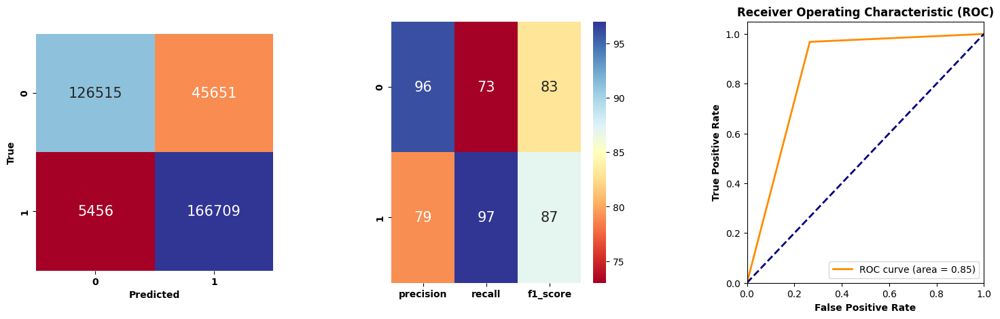

In [13]:
%%time
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

SMOTE

In [14]:
X_resampled, y_resampled = get_oversampling(X,y,oversampler=SMOTE, kwargs=dict(sampling_strategy=.8, random_state=42))

Class distribution before OverSampler: Counter({0: 860827, 1: 44526})
Class distribution after  OverSampler: Counter({0: 860827, 1: 688661})


Accuracy del modelo  0.8400
Recall del modelo    0.9622
F1 score del modelo  0.8424
ROC                  0.8522


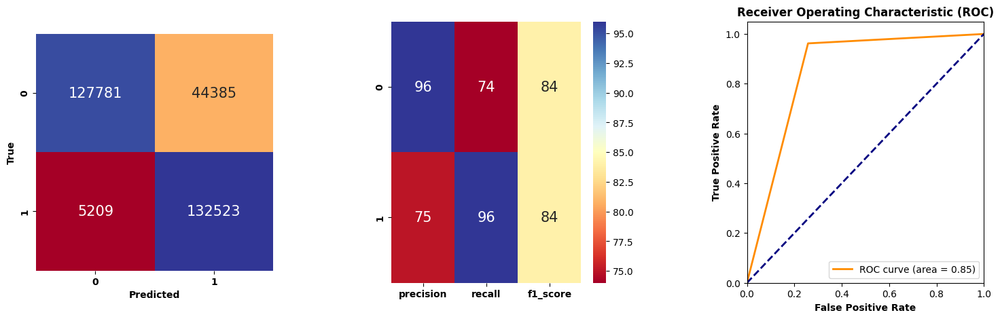

In [15]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

ADASYN

In [16]:
X_resampled, y_resampled = get_oversampling(X,y,oversampler=ADASYN, kwargs=dict(sampling_strategy=.8, random_state=42))

Class distribution before OverSampler: Counter({0: 860827, 1: 44526})
Class distribution after  OverSampler: Counter({0: 860827, 1: 667890})


Accuracy del modelo  0.8385
Recall del modelo    0.9594
F1 score del modelo  0.8385
ROC                  0.8521


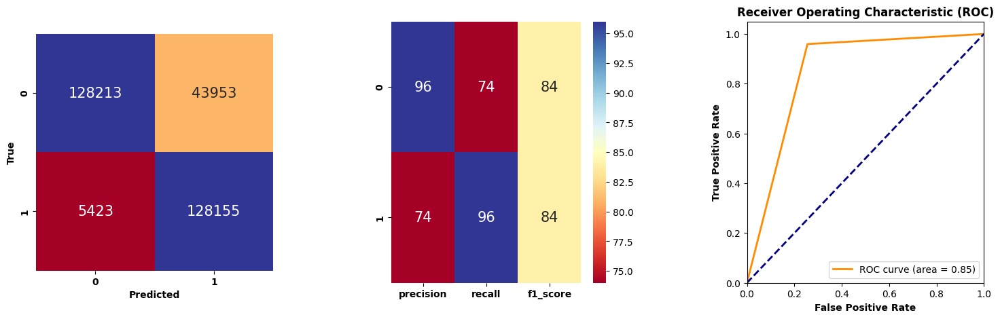

In [17]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

#### A:c Parking único

In [18]:
most_common_start_station = df["start_station_id"].value_counts().idxmax()
# mask = df["start_station_id"] == df["start_station_id"][0] # 1st parking
mask = df["start_station_id"] == most_common_start_station

##### A:c:I:α 4 categorías

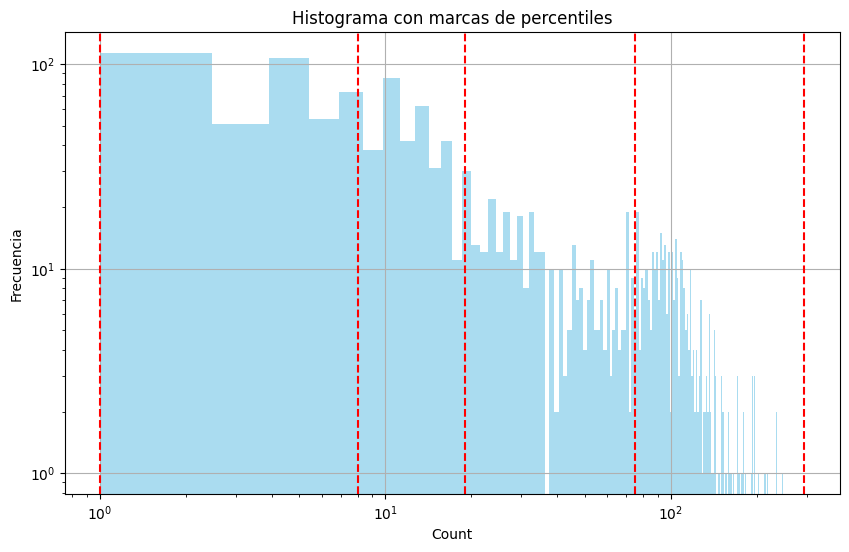

In [19]:
count_percentile, bins = pd.qcut(df["count"][mask], q=percentiles, labels=False, retbins=True)
plot_hist_log(df[mask], bins);

Accuracy del modelo  0.5944
Recall del modelo    0.5931
F1 score del modelo  0.5912


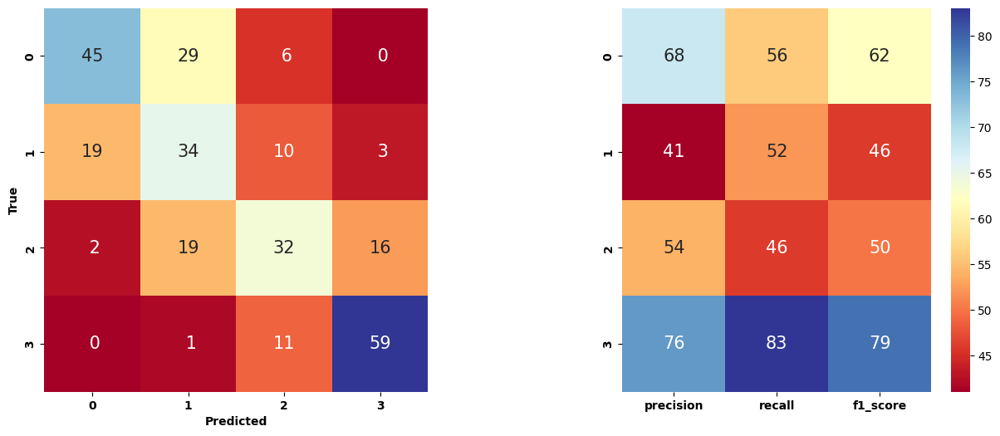

In [20]:
X, y, x_cols = get_X_y(df[mask], count_percentile)
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X, y);

##### A:c:I:β 4 cateogrías con oversampling

<s>TODO</s> --> NO falta de hacer code porque incluso los grupos mayoritarios tienen bajo F1_score. Descarta intentar clasificar estas 4 categorías.

##### A:c:II:α 2 categorías

Resultados todavía muy pobres. Así que primero filtro a pocos parking de bicis. Y parto en vez de percentil 5 en el 90, para ahora estudiar si esos días tienen algo de especial para que se use tanto la bici.

In [21]:
perc = 0.95

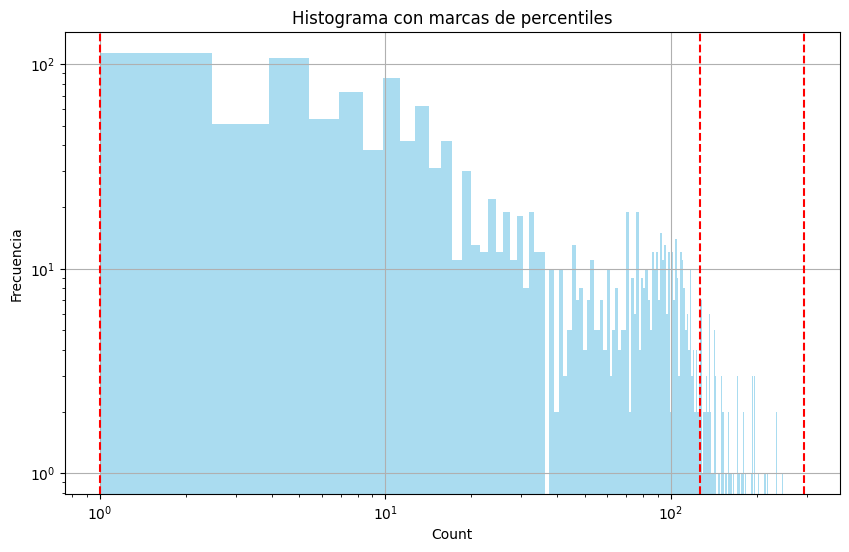

In [22]:
count_percentile, bins = pd.qcut(df["count"][mask], q=[0, perc, 1], labels=False, retbins=True)
plot_hist_log(df[mask], bins);

Accuracy del modelo  0.9685
Recall del modelo    0.6429
F1 score del modelo  0.6667
ROC                  0.8141


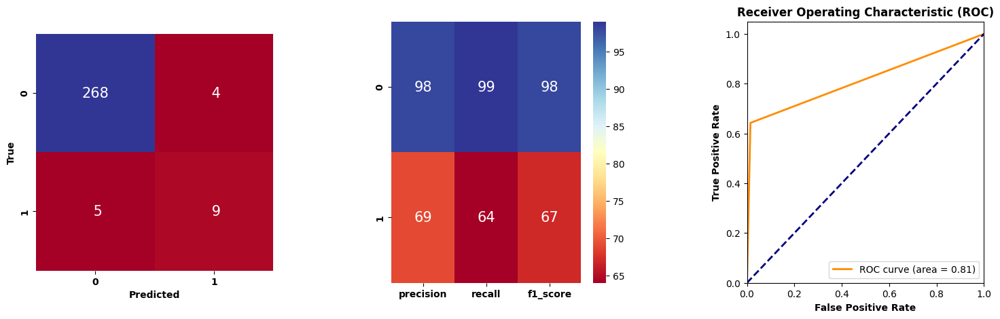

In [23]:
X, y, _ = get_X_y(df[mask], count_percentile)
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X, y, ROC_plot=True, figsize=(18,5));

##### A:c:II:β-γ-δ 2 cateogrías con oversampling

RandomOverSampler

In [24]:
X_resampled, y_resampled = get_oversampling(X,y,oversampler=RandomOverSampler)

Class distribution before OverSampler: Counter({0: 1361, 1: 69})
Class distribution after  OverSampler: Counter({0: 1361, 1: 1361})


Accuracy del modelo  0.9853
Recall del modelo    1.0000
F1 score del modelo  0.9855
ROC                  0.9853


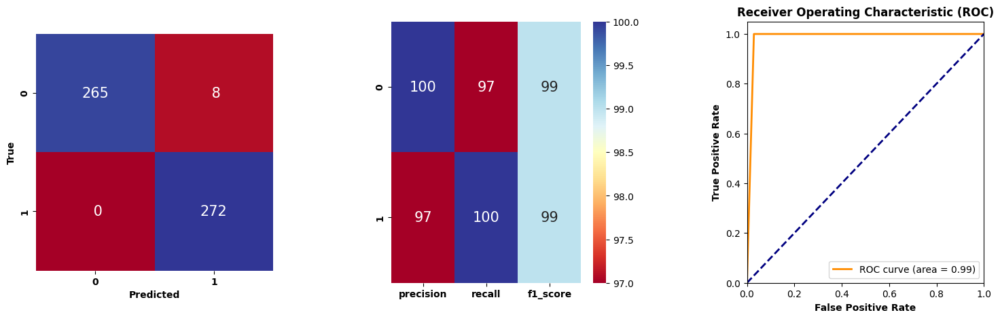

In [25]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

SMOTE

In [26]:
X_resampled, y_resampled = get_oversampling(X,y,oversampler=SMOTE, kwargs=dict(sampling_strategy=.8, random_state=42))

Class distribution before OverSampler: Counter({0: 1361, 1: 69})
Class distribution after  OverSampler: Counter({0: 1361, 1: 1088})


Accuracy del modelo  0.9694
Recall del modelo    0.9725
F1 score del modelo  0.9658
ROC                  0.9697


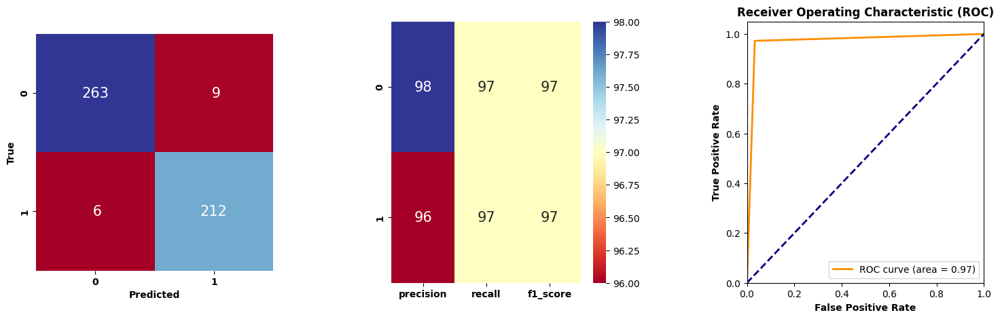

In [27]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

ADASYN

In [28]:
X_resampled, y_resampled = get_oversampling(X,y,oversampler=ADASYN, kwargs=dict(sampling_strategy=.8, random_state=42))

Class distribution before OverSampler: Counter({0: 1361, 1: 69})
Class distribution after  OverSampler: Counter({0: 1361, 1: 1088})


Accuracy del modelo  0.9531
Recall del modelo    0.9541
F1 score del modelo  0.9476
ROC                  0.9532


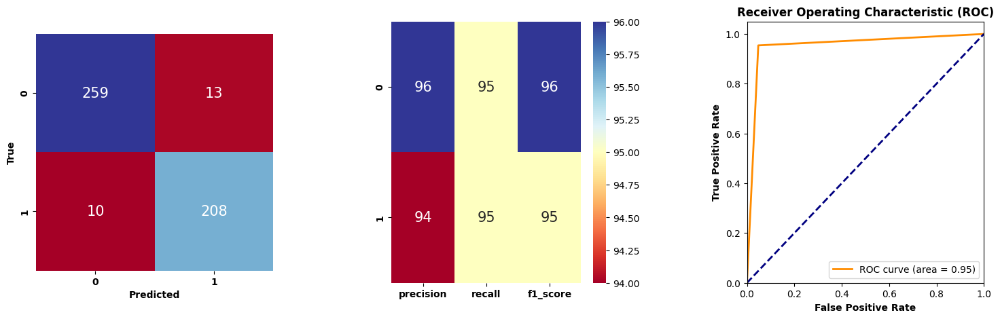

In [29]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

### B: Dataset agrupando variables categóricas de la bici

Descartamos las variables categóricas de la bici, pero así modificamos el nuevo count.

In [4]:
filename = pickle_folder + "df_tripdata_2023_merge.pkl"
df_merge = dump_or_load(filename, dump=False)

Opened <_io.BufferedReader name='./databases/pickle/df_tripdata_2023_merge.pkl'>


In [5]:
groupby_cols = ['started_at', 'start_station_id']
remove_cols = ['member_T_casual_F', 'classic_bike', 'docked_bike', 'electric_bike']
aggregated_dict = {col:'first' for col in df_merge.columns}
[aggregated_dict.pop(col, None) for col in groupby_cols+remove_cols]
aggregated_dict['count'] = 'sum'
aggregated_dict

{'count': 'sum',
 'closest_weather_station': 'first',
 'AWND': 'first',
 'PRCP': 'first',
 'SNOW': 'first',
 'SNWD': 'first',
 'TMAX': 'first',
 'TMIN': 'first',
 'WSF2': 'first',
 'WSF5': 'first',
 'holiday': 'first',
 'working_day': 'first',
 'Monday': 'first',
 'Tuesday': 'first',
 'Wednesday': 'first',
 'Thursday': 'first',
 'Friday': 'first',
 'Saturday': 'first',
 'Sunday': 'first'}

In [6]:
df_merge_no_bike_type = df_merge.groupby(groupby_cols).agg(aggregated_dict).reset_index()
df_merge_no_bike_type.head()

,started_at,start_station_id,count,closest_weather_station,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5,holiday,working_day,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
0,2023-01-01,2733.03,6,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
1,2023-01-01,2782.02,10,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
2,2023-01-01,2821.05,7,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
3,2023-01-01,2832.03,7,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
4,2023-01-01,2872.02,2,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True


In [33]:
filename = pickle_folder + "df_tripdata_2023_merge_no_bike_type.pkl"
dump_or_load(filename, var=df_merge_no_bike_type, dump=True)

Saved  <_io.BufferedWriter name='./databases/pickle/df_tripdata_2023_merge_no_bike_type.pkl'>


In [34]:
df = df_merge_no_bike_type.copy() # to just copy-paste whole next cells and rerun them

#### B:a Todos los trips

##### B:a:I:α 4 categorías

In [35]:
# convert df_merge["count"] in categorical based on percentiles
# 1st group till percentil 25, 2nd group in between percentil 25 and percentil 50, etc.
percentiles = [0, 0.25, 0.5, 0.75, 1]

# Compute percentiles and convert "count" to categorical
count_percentile, bins = pd.qcut(df["count"], q=percentiles, labels=False, retbins=True)

In [36]:
count_percentile.value_counts()

count
0    183693
3    171550
2    169214
1    165676
Name: count, dtype: int64

In [37]:
len(df) == count_percentile.value_counts().sum()

True

In [38]:
bins

array([  1.,  10.,  26.,  69., 860.])

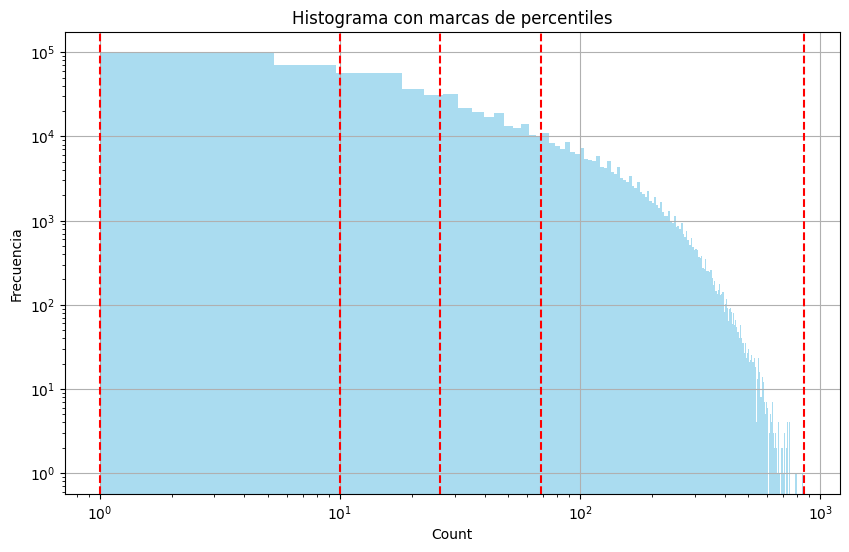

In [39]:
plot_hist_log(df, bins);

In [40]:
df.head(3)

,started_at,start_station_id,count,closest_weather_station,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,WSF2,WSF5,holiday,working_day,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
0,2023-01-01,2733.03,6,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
1,2023-01-01,2782.02,10,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True
2,2023-01-01,2821.05,7,US1NYKN0025,3.194399,6.6,0.0,0.0,16.316667,9.916667,7.709474,9.981051,True,False,False,False,False,False,False,False,True


In [ ]:
X, y, _ = get_X_y(df, count_percentile)

In [ ]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X, y);

##### B:a:I:β 4 cateogrías con oversampling

<s>TODO</s> --> NO falta de hacer code porque incluso los grupos mayoritarios tienen bajo F1_score. Descarta intentar clasificar estas 4 categorías.

##### B:a:II:α 2 categorías

In [ ]:
perc = .95

In [ ]:
count_percentile, bins = pd.qcut(df["count"], q=[0, perc, 1], labels=False, retbins=True)
plot_hist_log(df, bins);

In [ ]:
X, y, x_cols = get_X_y(df, count_percentile)
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X, y, ROC_plot=True, figsize=(18,5));

##### B:a:II:β-γ-δ 2 cateogrías con oversampling

Aplicamos oversampling, ya que por la propia definición de percentil, habrá muchos menos en grupo menor del percentil 5 (si perc=5) ó en grupo mayor de 95 (si perc=.95).

<img align="center" style="width:500px;" src="https://miro.medium.com/v2/resize:fit:720/format:webp/1*7xf9e1EaoK5n05izIFBouA.png">

RandomOverSampler

In [ ]:
X_resampled, y_resampled = get_oversampling(X,y,oversampler=RandomOverSampler)

In [ ]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

SMOTE

In [ ]:
X_resampled, y_resampled = get_oversampling(X,y,oversampler=SMOTE, kwargs=dict(sampling_strategy=.8, random_state=42))

In [ ]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

ADASYN

In [ ]:
%%time
X_resampled, y_resampled = get_oversampling(X,y,oversampler=ADASYN, kwargs=dict(sampling_strategy=.8, random_state=42))

In [ ]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

#### B:b Parkings próximos

In [ ]:
mask = df["closest_weather_station"] == df["closest_weather_station"][999]

In [ ]:
len(set(df[mask]["start_station_id"])) # parkings cercanos a esa estación meteo.

##### B:b:I:α 4 categorías

In [ ]:
count_percentile, bins = pd.qcut(df["count"][mask], q=percentiles, labels=False, retbins=True)
plot_hist_log(df[mask], bins);

In [ ]:
X, y, x_cols = get_X_y(df[mask], count_percentile)
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X, y);

##### B:b:I:β 4 cateogrías con oversampling

<s>TODO</s> --> NO falta de hacer code porque incluso los grupos mayoritarios tienen bajo F1_score. Descarta intentar clasificar estas 4 categorías.

##### B:b:II:α 2 categorías

Resultados todavía muy pobres. Así que primero filtro a pocos parking de bicis. Y parto en vez de percentil 5 en el 90, para ahora estudiar si esos días tienen algo de especial para que se use tanto la bici.

In [ ]:
perc = 0.95

In [ ]:
count_percentile, bins = pd.qcut(df["count"][mask], q=[0, perc, 1], labels=False, retbins=True)
plot_hist_log(df[mask], bins);

In [ ]:
X, y, _ = get_X_y(df[mask], count_percentile)
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X, y, ROC_plot=True, figsize=(18,5));

##### B:b:II:β-γ-δ 2 cateogrías con oversampling

RandomOverSampler

In [ ]:
X_resampled, y_resampled = get_oversampling(X,y,oversampler=RandomOverSampler)

In [ ]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

SMOTE

In [ ]:
X_resampled, y_resampled = get_oversampling(X,y,oversampler=SMOTE, kwargs=dict(sampling_strategy=.8, random_state=42))

In [ ]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

ADASYN

In [ ]:
X_resampled, y_resampled = get_oversampling(X,y,oversampler=ADASYN, kwargs=dict(sampling_strategy=.8, random_state=42))

In [ ]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

#### B:c Parking único

In [ ]:
most_common_start_station = df["start_station_id"].value_counts().idxmax()
# mask = df["start_station_id"] == df["start_station_id"][0] # 1st parking
mask = df["start_station_id"] == most_common_start_station
most_common_start_station

##### B:c:I:α 4 categorías

In [ ]:
count_percentile, bins = pd.qcut(df["count"][mask], q=percentiles, labels=False, retbins=True)
plot_hist_log(df[mask], bins);

In [ ]:
X, y, x_cols = get_X_y(df[mask], count_percentile)
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X, y);

##### B:c:I:β 4 cateogrías con oversampling

<s>TODO</s> --> NO falta de hacer code porque incluso los grupos mayoritarios tienen bajo F1_score. Descarta intentar clasificar estas 4 categorías.

##### B:c:II:α 2 categorías

Resultados todavía muy pobres. Así que primero filtro a pocos parking de bicis. Y parto en vez de percentil 5 en el 90, para ahora estudiar si esos días tienen algo de especial para que se use tanto la bici.

In [ ]:
perc = 0.95

In [ ]:
count_percentile, bins = pd.qcut(df["count"][mask], q=[0, perc, 1], labels=False, retbins=True)
plot_hist_log(df[mask], bins);

In [ ]:
X, y, _ = get_X_y(df[mask], count_percentile)
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X, y, ROC_plot=True, figsize=(18,5));

##### B:c:II:β-γ-δ 2 cateogrías con oversampling

RandomOverSampler

In [ ]:
X_resampled, y_resampled = get_oversampling(X,y,oversampler=RandomOverSampler)

In [ ]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

SMOTE

In [ ]:
X_resampled, y_resampled = get_oversampling(X,y,oversampler=SMOTE, kwargs=dict(sampling_strategy=.8, random_state=42))

In [ ]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

ADASYN

In [ ]:
X_resampled, y_resampled = get_oversampling(X,y,oversampler=ADASYN, kwargs=dict(sampling_strategy=.8, random_state=42))

In [ ]:
plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

### Mejor modelo clasif. para parking único

In [11]:
filename = pickle_folder + "df_tripdata_2023_merge.pkl"
df_merge = dump_or_load(filename, dump=False)

Opened <_io.BufferedReader name='./databases/pickle/df_tripdata_2023_merge.pkl'>


In [12]:
filename = pickle_folder + "df_tripdata_2023_merge_no_bike_type.pkl"
df_merge_no_bike_type = dump_or_load(filename, dump=False)

Opened <_io.BufferedReader name='./databases/pickle/df_tripdata_2023_merge_no_bike_type.pkl'>


Class distribution before OverSampler: Counter({0: 1361, 1: 69})
Class distribution after  OverSampler: Counter({0: 1361, 1: 1361})
Accuracy del modelo  0.9853
Recall del modelo    1.0000
F1 score del modelo  0.9855
ROC                  0.9853


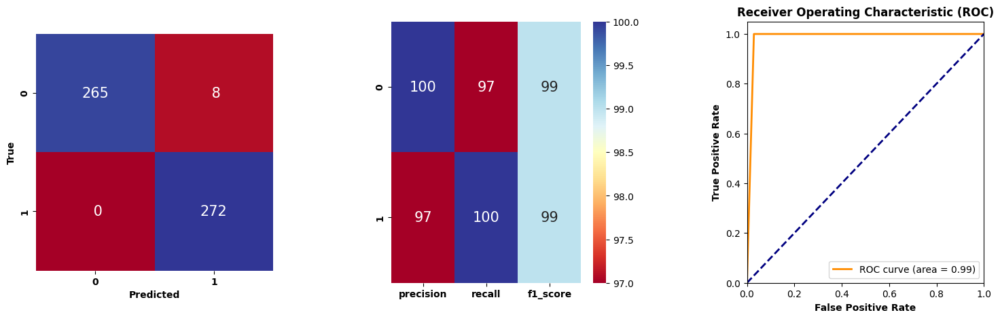

In [14]:
# -------------
# mejor modelo clasificador de todos los vistos hasta ahora: A:c:II:δ



# dataset NO agrupando categorías
df = df_merge.copy()

# 2 categorías
perc = 0.95
q = [0, perc, 1]

# parking único
most_common_start_station = df["start_station_id"].value_counts().idxmax()
# mask = df["start_station_id"] == df["start_station_id"][0] # 1st parking
mask = df["start_station_id"] == most_common_start_station
df = df[mask]

# oversampler 
oversampler = RandomOverSampler
kwargs=dict()
# -------------

count_percentile, bins = pd.qcut(df["count"], q=q, labels=False, retbins=True)
X, y, x_cols = get_X_y(df, count_percentile)

X_resampled, y_resampled = get_oversampling(X,y,oversampler=oversampler, kwargs=kwargs)
clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

Class distribution before OverSampler: Counter({0: 319, 1: 15})
Class distribution after  OverSampler: Counter({0: 319, 1: 255})
Accuracy del modelo  0.9130
Recall del modelo    0.8235
F1 score del modelo  0.8936
ROC                  0.9040


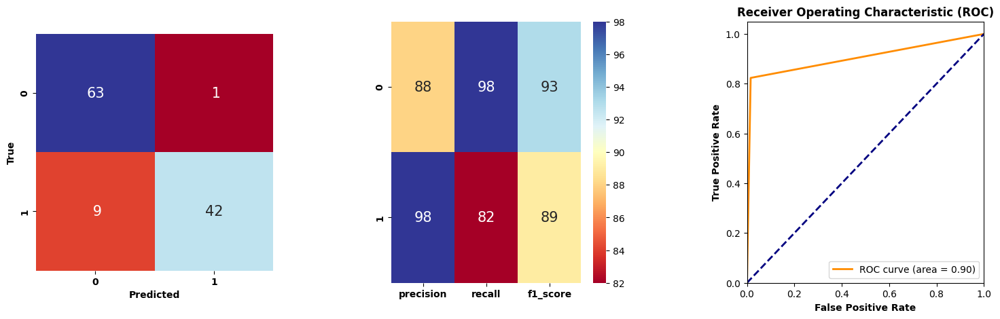

In [15]:
# -------------
# mejor modelo clasificador del dataset agrupando categorías vistos: B:c:II:β

# dataset agrupando categorías
df = df_merge_no_bike_type.copy()

# 2 categorías
perc = 0.95
q = [0, perc, 1]

# parking único
most_common_start_station = df["start_station_id"].value_counts().idxmax()
# mask = df["start_station_id"] == df["start_station_id"][0] # 1st parking
mask = df["start_station_id"] == most_common_start_station
df = df[mask]

# oversampler 
oversampler = SMOTE
kwargs=dict(sampling_strategy=.8, random_state=42)
# -------------


count_percentile, bins = pd.qcut(df["count"], q=q, labels=False, retbins=True)
X, y, x_cols = get_X_y(df, count_percentile)

X_resampled, y_resampled = get_oversampling(X,y,oversampler=oversampler, kwargs=kwargs)
clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

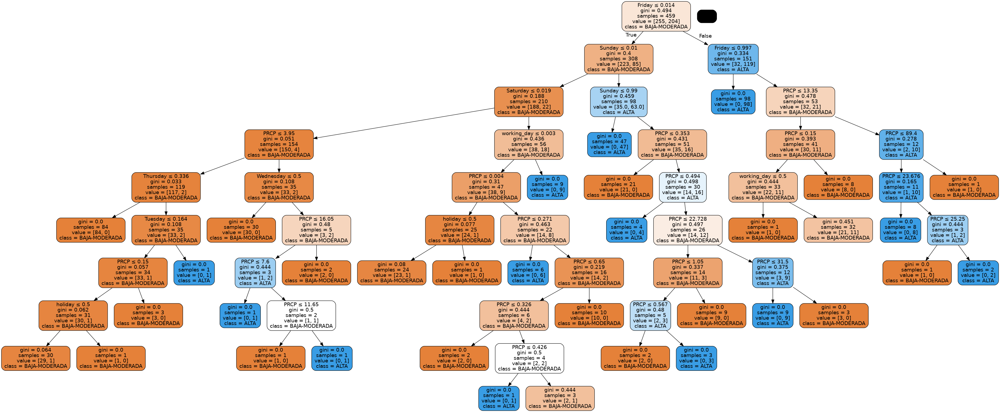

In [9]:
class_names = np.unique(y.astype(str)).tolist() # ['0', '1']
class_names = ['perc. 0-5', 'perc. 5-100']
class_names = ['BAJA-MODERADA','ALTA'] # demanda de bici
plot_tree_graphviz(clf, x_cols, class_names) # abrir en pestaña nueva, esperar a que se cargue y enfocar (zoom in)

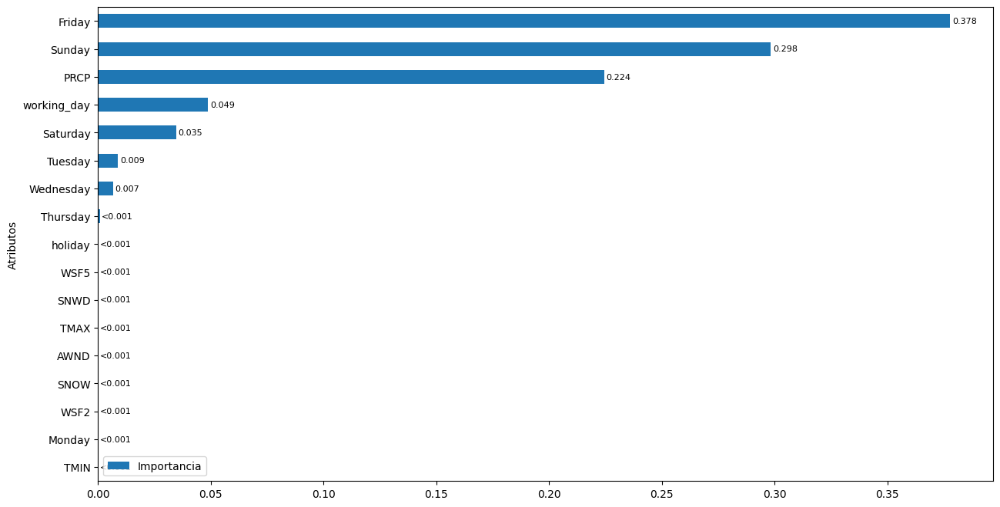

In [10]:
plot_feature_importances(clf, x_cols);

Principales factores que determina el decission tree (ver export_text()):
- ...
- cuantía de precipitaciones (PRCP)

Mismo árbol en horizontal y con raw text:

In [ ]:
from sklearn.tree import export_text
print(export_text(clf, feature_names = x_cols))

#### B:c:II:β Cross-validation & min_samples_split

In [16]:
# MWE
def MWE():

    from sklearn.datasets import load_iris
    iris = load_iris()
    X = iris.data
    y = iris.target

    from sklearn.neighbors import KNeighborsClassifier
    model = KNeighborsClassifier(n_neighbors=1)

    from sklearn.model_selection import cross_val_score
    scores = cross_val_score(model, X, y, cv=5)

    for i,k in enumerate(scores): print(f"Accuracy of cross validation {i+1}-th: {k*100:6.2f} %")

    print("\nMean accuracy: %.2f%% (+/- %.2f%%)" % (1e2*scores.mean(), 1e2*scores.std() * 2))
MWE()

Accuracy of cross validation 1-th:  96.67 %
Accuracy of cross validation 2-th:  96.67 %
Accuracy of cross validation 3-th:  93.33 %
Accuracy of cross validation 4-th:  93.33 %
Accuracy of cross validation 5-th: 100.00 %

Mean accuracy: 96.00% (+/- 4.99%)


Ejemplo usando cv=10 en plot_confussion_matrix_F1score_matrix_ROC_curve (previamente, si no se indicaba cv, era sin cross-validation, i.e. usando todo X_train junto).

cv: 10		len(X_test): 115
Accuracy of cross validation   1-th:  75.00 %
Accuracy of cross validation   2-th:  75.00 %
Accuracy of cross validation   3-th:  91.67 %
Accuracy of cross validation   4-th:  66.67 %
Accuracy of cross validation   5-th:  75.00 %
Accuracy of cross validation   6-th:  63.64 %
Accuracy of cross validation   7-th:  81.82 %
Accuracy of cross validation   8-th:  72.73 %
Accuracy of cross validation   9-th:  90.91 %
Accuracy of cross validation  10-th:  72.73 %

Mean accuracy: 76.52% (+/- 17.47%)
Accuracy del modelo  0.7652
Recall del modelo    0.6078
F1 score del modelo  0.6966
ROC                  0.7492


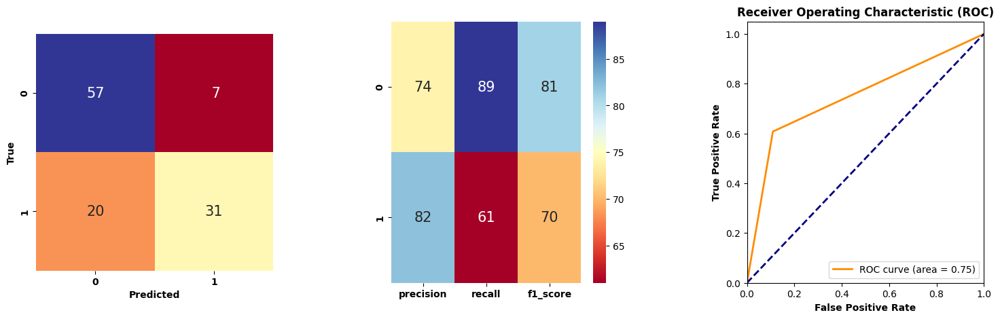

In [17]:
plot_kwargs = dict(model=DecisionTreeClassifier(), X=X_resampled, y=y_resampled, ROC_plot=True, figsize=(18,5))
# plot_confussion_matrix_F1score_matrix_ROC_curve(**plot_kwargs, cv=None);
plot_confussion_matrix_F1score_matrix_ROC_curve(**plot_kwargs, cv=10, print_scores_bool=True);

https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

DecisionTreeClassifier<br>
class sklearn.tree.DecisionTreeClassifier(*, criterion='gini', splitter='best', max_depth=None, min_samples_split=2,<br> min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, <br>max_leaf_nodes=None, min_impurity_decrease=0.0, class_weight=None, ccp_alpha=0.0, monotonic_cst=None)

Recordemos que :

Class distribution before OverSampler: Counter({0: 319, 1: 15}) --> debidos a X, y
Class distribution after  OverSampler: Counter({0: 319, 1: 255}) --> debidos a X_resampled, y_resampled

Pero nosotros dividimos esos _resampled en:

In [18]:
test_size = 0.2
X_train, X_test, y_train, y_test = train_test_split(
        X_resampled, y_resampled, test_size=test_size, stratify=y_resampled, random_state=24
)

Donde "cv" no puede valer menos que el grupo con mas clases, y se recomienda que valga menos que el grupo con menos clases:

In [19]:
n_0, n_1 = sum(y_test == 0), sum(y_test == 1)
cv_max = min([n_0, n_1])
n_0, n_1

(64, 51)

Sino daría error:

In [21]:
cv_arr = [cv_max, # max([n_0, n_1]) --> OK
         max([n_0, n_1]), # Warning
         max([n_0, n_1]) + 1 # or more --> Error
         ]
for cv in cv_arr:
    print(f"cv = {cv}\n" + 40*"- ")
    try:
        clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(),
                                                                 X_resampled, y_resampled, cv=cv,
                                                                matrix_conf_and_metrics_plot=False);
    except Exception as err:
        print(f"Error: {err}")

cv = 51
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Accuracy del modelo  0.8000
Recall del modelo    0.7785
F1 score del modelo  0.7832
ROC                  0.7785
cv = 64
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Accuracy del modelo  0.7826
Recall del modelo    0.7629
F1 score del modelo  0.7667
ROC                  0.7629
cv = 65
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Error: n_splits=65 cannot be greater than the number of members in each class.


/home/xopi/Downloads/TFM_venv/lib/python3.10/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 51 members, which is less than n_splits=64.
  warnings.warn(


Iterar:
- 2<= cv < cv_max = 51
- 2<= min_samples_split

Nótese que ambos deben valer como mínimo 2.

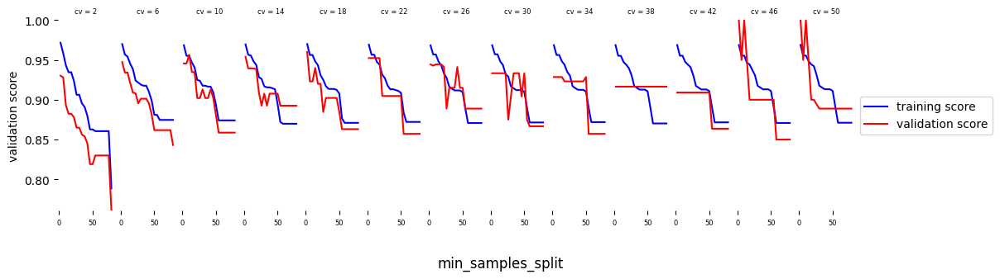

,2,6,10,14,18,22,26,30,34,38,42,46,50,54,58,62,66,70,74,78
2,93.0,92.8,89.3,88.2,88.2,87.8,86.5,86.5,85.6,85.4,84.5,81.9,81.9,83.0,83.0,83.0,83.0,83.0,83.0,76.0
6,94.7,93.4,93.4,92.1,90.9,90.8,89.6,90.1,90.1,90.1,89.5,88.2,86.2,86.2,86.2,86.2,86.2,86.2,86.2,84.3
10,94.6,94.6,95.7,93.5,93.5,90.2,90.2,91.3,90.2,90.2,91.3,90.2,88.0,85.9,85.9,85.9,85.9,85.9,85.9,85.9
14,95.4,93.9,93.9,93.9,93.8,90.9,89.3,90.8,89.3,90.8,90.8,90.8,90.8,89.3,89.3,89.3,89.3,89.3,89.3,89.3
18,96.0,92.3,92.3,94.0,92.0,92.0,88.5,90.2,90.2,90.2,90.2,90.2,88.5,86.3,86.3,86.3,86.3,86.3,86.3,86.3
22,95.2,95.2,95.2,95.2,95.2,90.5,90.5,90.5,90.5,90.5,90.5,90.5,90.5,85.7,85.7,85.7,85.7,85.7,85.7,85.7
26,94.4,94.3,94.4,94.4,94.4,94.1,88.9,91.5,91.5,91.5,94.1,91.5,91.5,88.9,88.9,88.9,88.9,88.9,88.9,88.9
30,93.3,93.3,93.3,93.3,93.3,93.3,87.5,90.4,93.3,93.3,93.3,90.4,93.3,87.5,86.7,86.7,86.7,86.7,86.7,86.7
34,92.9,92.9,92.9,92.9,92.3,92.3,92.3,92.3,92.3,92.3,92.3,92.3,92.9,85.7,85.7,85.7,85.7,85.7,85.7,85.7
38,91.7,91.7,91.7,91.7,91.7,91.7,91.7,91.7,91.7,91.7,91.7,91.7,91.7,91.7,91.7,91.7,91.7,91.7,91.7,91.7


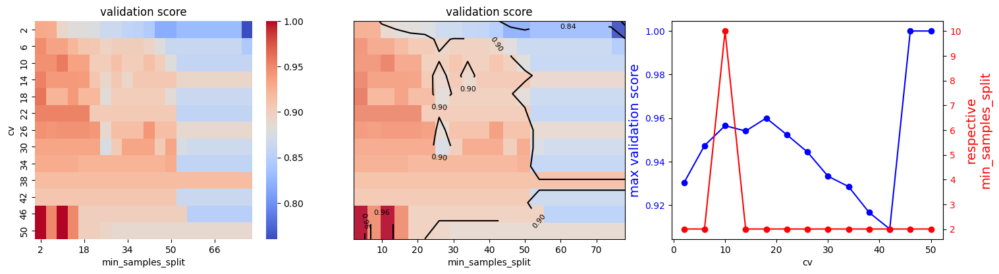

In [22]:
plot_validation_curve(model=DecisionTreeClassifier(), X=X_resampled, y=y_resampled,
                      param_range = np.arange(2, 80, 4), param_name="min_samples_split", 
                      cv_range = np.arange(2, cv_max, 4));

Máximos validation score se dan para:
- todo rango de cv, especialmente para cv>40, pero viendo curvas de entrenamiento (con validation score y training score) si cv>40 parece ya overfitting. Así, 2 <= cv <= 40
- 2 <= min_samples_split <= 50

Seteamos solo estos rangos de cv_range y param_range.

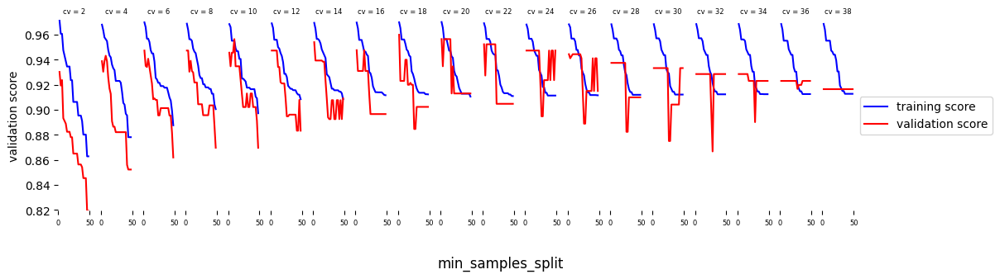

,2,4,6,8,10,12,14,16,18,20,22,24,26,28,30,32,34,36,38,40,42,44,46,48
2,93.0,91.9,92.4,89.3,89.1,88.9,88.2,88.2,88.2,87.8,87.8,86.5,86.5,86.5,86.5,85.6,85.6,85.6,85.4,84.5,84.5,84.5,81.9,81.9
4,93.9,93.0,93.9,94.3,93.9,92.6,91.7,91.3,89.1,88.6,88.6,88.2,88.2,88.2,88.2,88.2,88.2,88.2,88.2,88.2,85.6,85.2,85.2,85.2
6,94.7,93.5,93.4,94.1,93.4,92.8,92.1,90.8,90.9,90.8,90.8,89.6,89.6,90.1,90.1,90.1,90.1,90.1,90.1,90.1,89.5,89.5,88.2,86.2
8,94.7,94.7,93.0,93.9,93.1,93.0,92.2,92.2,92.2,90.4,90.4,90.4,90.4,89.6,89.6,89.6,89.6,89.6,90.4,90.4,90.4,90.4,88.7,87.0
10,94.6,93.5,94.6,94.6,95.7,93.5,93.5,93.5,93.5,92.4,91.3,90.2,90.2,90.2,91.3,90.2,90.2,91.3,91.3,90.2,90.2,90.2,89.1,87.0
12,94.7,94.7,94.7,94.7,94.7,93.4,93.4,92.2,92.1,92.1,92.1,90.9,89.5,89.5,89.6,89.6,89.6,89.6,89.6,89.6,88.3,88.3,90.8,88.3
14,95.4,93.9,93.9,93.9,93.9,93.9,93.9,93.8,93.8,92.3,90.9,89.4,89.3,89.3,90.8,90.8,89.3,89.3,90.8,90.8,89.3,90.8,89.3,90.9
16,94.8,93.1,93.1,93.1,93.1,93.1,94.8,93.1,93.1,93.1,91.3,89.7,89.7,89.7,89.7,89.7,89.7,89.7,89.7,89.7,89.7,89.7,89.7,89.7
18,96.0,92.3,92.3,92.3,92.3,94.0,94.0,92.0,92.0,92.2,92.0,92.0,88.5,88.5,90.2,90.2,90.2,90.2,90.2,90.2,90.2,90.2,90.2,90.2
20,95.7,93.5,95.7,95.7,95.7,95.7,95.7,95.7,91.3,93.5,91.3,91.3,91.3,91.3,91.3,91.3,91.3,91.3,91.3,91.3,91.3,91.3,91.3,91.3


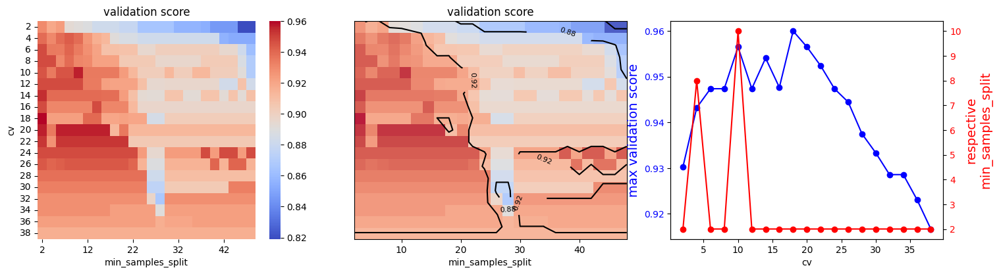

CPU times: user 22.1 s, sys: 1.5 s, total: 23.6 s
Wall time: 23 s


In [23]:
%%time
plot_validation_curve(model=DecisionTreeClassifier(), X=X_resampled, y=y_resampled,
                      param_range = np.arange(2, 50, 2), param_name="min_samples_split", 
                      cv_range = np.arange(2, 40, 2));

Máximos validation score se dan para:
- todo rango de cv, especialmente pero viendo curvas de entrenamiento (con validation score y training score) si cv>24 parece ya overfitting. Así, 2 <= cv <= 24
- 2 <= min_samples_split <= 50 (sin variaciones)

Seteamos solo estos rangos de cv_range y param_range. Aumentando en ambos el granulado (paso 1 en np.arange)

In [ ]:
plot_validation_curve(model=DecisionTreeClassifier(), X=X_resampled, y=y_resampled,
                      param_range = np.arange(2, 50, 10), param_name="min_samples_split", 
                      cv_range = np.arange(2, 24, 10));

Confirmado, para cross-validation si jugamos con parámetro "min_samples_split" los mejores resutados se dan para varias tuplas (cv, min_samples_split):
- (cv, min_samples_split) = (10,9) da validation score (curva azul de 3º subplot) entre .955 y .96
- (cv, min_samples_split) = ( 9,2) da validation score .96
- (cv, min_samples_split) = (17,2) da validation score >.96

ROC del modelo sería lo siguiente, nótese que sus resultados son inferiores a los del valitadion score, ya que ahora calculamos f1-score (y otras) del testing dataset, mientras anteriormente era (la mediana) de los validation dataset (detalles en plot_validation_curve.py):

<img align="left" style="width:500px;" src="https://duchesnay.github.io/pystatsml/_images/train_val_test_cv1.png">

In [ ]:
model = DecisionTreeClassifier(min_samples_split=10)
cv = 9
clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(model, X_resampled, y_resampled, cv=cv,
                                                         ROC_plot=True, figsize=(18,5));

Mejor itero directamente grid de mejores resultados:
{cv de 15 a 24} x {min_samples_split de 2 a 22}

In [ ]:
get_ROC_meshgrid_kwargs = dict(model= DecisionTreeClassifier, X_resampled = X_resampled, y_resampled = y_resampled)
get_ROC_meshgrid(**get_ROC_meshgrid_kwargs, cv_range = np.arange(0, 20, 2), param_range = np.arange(2, 25, 1), 
                 param_name="min_samples_split",
                 score_index = [0, 1, -2,-1])

Se comprueba como al quitar cross-validation (cv=None) los resultados son superiores para todo min_samples_split=2.
Por tanto, a pesar de todo el anterior tunning, llegamos a la conclusión que el clasificador devuelve mejores resultados si no aplicamos cross-validation y si mantenemos min_samples_split=2 (por defecto), o en general min_samples_split<10.

In [ ]:
# modelo original
model = DecisionTreeClassifier(min_samples_split=2)
cv = None
clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(model, X_resampled, y_resampled, cv=cv,
                                                         ROC_plot=True, figsize=(18,5));

#### B:c:II:β Cross-validation & min_samples_leaf

Iterar:
- 2<= cv <= 24, porque si >24 hay overfitting como se vió en sección "B:c:II:β Cross-validation & min_samples_split"
- min_samples_lead >= 1

In [ ]:
min_samples_split=2 # óptimos según "B:c:II:β Cross-validation & min_samples_split"
model = DecisionTreeClassifier(min_samples_split=min_samples_split)
plot_validation_curve(model=model, X=X_resampled, y=y_resampled,
                      param_range = np.arange(1, 80, 1), param_name="min_samples_leaf", 
                      cv_range = np.arange(2, 24, 4));

Iterar:
- 2 <= cv <= 24
- 1 <= min_samples_lead <= 45
Granularidad de ambos 1 (paso 1):

In [ ]:
model = DecisionTreeClassifier(min_samples_split=10)
plot_validation_curve(model=model, X=X_resampled, y=y_resampled,
                      param_range = np.arange(1, 45, 1), param_name="min_samples_leaf", 
                      cv_range = np.arange(2, 24, 1));

Los mejores resultados se dan para:
- (cv, min_samples_leaf) = (15,6) da validation score (curva azul de 3º subplot) >.96
- (cv, min_samples_leaf) = (7,6) da validation score >.96
- en general para 15 < cv < 24 y 1 < min_samples_leaf < 9


Iteramos esos valores y volvemos a comprobar que si cross-validation seguimos obteniendo mejores resultados

In [ ]:
cv = 15
min_samples_leaf = 6
model = DecisionTreeClassifier(min_samples_split=2,  min_samples_leaf=min_samples_leaf)
clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(model, X_resampled, y_resampled, cv=cv,
                                                         ROC_plot=True, figsize=(18,5));

In [ ]:
cv = 7
min_samples_leaf = 6
model = DecisionTreeClassifier(min_samples_split=2,  min_samples_leaf=min_samples_leaf)
clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(model, X_resampled, y_resampled, cv=cv,
                                                         ROC_plot=True, figsize=(18,5));

In [ ]:
cv = 20 # 15 < cv < 24 
min_samples_leaf = 5 # 1 < min_samples_leaf < 9
model = DecisionTreeClassifier(min_samples_split=2,  min_samples_leaf=min_samples_leaf)
clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(model, X_resampled, y_resampled, cv=cv,
                                                         ROC_plot=True, figsize=(18,5));

In [ ]:
# con model original
model = DecisionTreeClassifier(min_samples_split=2, min_samples_leaf=1)
cv = None
clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(model, X_resampled, y_resampled, cv=cv,
                                                         ROC_plot=True, figsize=(18,5));

Iteramos modelo original (sin cv) con min_samples_leaf 1 a 9. Los resultados son muy parecidos. Si min_samples_leaf ya valiese de 10 a 25 ROC vale 5% vemos. Ver siguientes dos cells:

In [ ]:
get_ROC_meshgrid(**get_ROC_meshgrid_kwargs, cv_range = np.array([0,15,17,19,21]), param_range = np.arange(1, 10, 1), 
                 param_name="min_samples_leaf",
                 score_index = [0, 1, -2,-1])

In [ ]:
get_ROC_meshgrid(**get_ROC_meshgrid_kwargs, cv_range = np.array([0,15,17,19,21]), param_range = np.arange(10,30,5), 
                 param_name="min_samples_leaf",
                 score_index = [1, -1])

### Mejor modelo clasif. para parkings próximos (B:b)

In [ ]:
filename = pickle_folder + "df_tripdata_2023_merge_no_bike_type.pkl"
df_merge_no_bike_type = dump_or_load(filename, dump=False)

In [ ]:
# -------------
# modelo clasificador para parkings próximos tipo B (B:b:II) es: B:b:II:δ

# dataset agrupando categorías
df = df_merge_no_bike_type.copy()

# 2 categorías
perc = 0.95
q = [0, perc, 1]

# parkings próximos
mask = df["closest_weather_station"] == df["closest_weather_station"][999]
df = df[mask]

# oversampler 
oversampler = RandomOverSampler
kwargs=dict(sampling_strategy='auto', random_state=42)
# -------------


count_percentile, bins = pd.qcut(df["count"], q=q, labels=False, retbins=True)
X, y, x_cols = get_X_y(df, count_percentile)

X_resampled, y_resampled = get_oversampling(X,y,oversampler=oversampler, kwargs=kwargs)
clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(DecisionTreeClassifier(), X_resampled, y_resampled,
                                                ROC_plot=True, figsize=(18,5));

#### B:b:II:δ Cross-validation

Iterar:
- cv
- min_samples_split

Nótese que ambos deben valer como mínimo 2.

In [ ]:
%%time
# 13min !!
plot_validation_curve(model=DecisionTreeClassifier(), X=X_resampled, y=y_resampled,
                      param_range = np.arange(2, 30, 5), param_name="min_samples_split", 
                      cv_range = np.arange(2, 43, 5));
!spd-say 'get back to work'

Resultados casi indiferentes. Dado que ahora tenemos 160 mil registros, podemos estudiar min_samples_split mucho mas grandes, del orden de cientos o miles.

In [ ]:
f"{len(X):.1e}"

In [ ]:
%%time
plot_validation_curve(model=DecisionTreeClassifier(), X=X_resampled, y=y_resampled,
                      param_range = np.arange(2, 2100, 200), param_name="min_samples_split", 
                      cv_range = np.array([2,5]))
!spd-say 'get back to work'

Los mejores resultados se dan para min_samples_split inferiores a 1000. Filtremos mas:

In [ ]:
%%time
plot_validation_curve(model=DecisionTreeClassifier(), X=X_resampled, y=y_resampled,
                      param_range = np.arange(2, 1000, 50), param_name="min_samples_split", 
                      cv_range = np.array([2,5,10]))
!spd-say 'get back to work'

In [ ]:
%%time
plot_validation_curve(model=DecisionTreeClassifier(), X=X_resampled, y=y_resampled,
                      param_range = np.arange(2, 11000, 1000), param_name="min_samples_split", 
                      cv_range = np.array([2,5]))
!spd-say 'get back to work'

In [ ]:
%%time
plot_validation_curve(model=DecisionTreeClassifier(), X=X_resampled, y=y_resampled,
                      param_range = np.arange(2, int(1.1e5), 5000), param_name="min_samples_split", 
                      cv_range = np.array([2,5]))
!spd-say 'get back to work'

In [ ]:
%%time
plot_validation_curve(model=DecisionTreeClassifier(), X=X_resampled, y=y_resampled,
                      param_range = np.arange(int(1e5), int(3e5), int(2e4)), param_name="min_samples_split", 
                      cv_range = np.array([2,5,10,50,100]))
!spd-say 'get back to work'

Comparo modelos concretos:

In [ ]:
# con model original
model = DecisionTreeClassifier(min_samples_split=2)
cv = None
clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(model, X_resampled, y_resampled, cv=cv,
                                                         ROC_plot=True, figsize=(18,5));

In [ ]:
# con model original pero min_samples_split=1e5
model = DecisionTreeClassifier(min_samples_split=int(1e5))
cv = None
clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(model, X_resampled, y_resampled, cv=cv,
                                                         ROC_plot=True, figsize=(18,5));

In [ ]:
model = DecisionTreeClassifier(min_samples_split=int(5e4))
cv = 100
clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(model, X_resampled, y_resampled, cv=cv,
                                                         ROC_plot=True, figsize=(18,5));

In [ ]:
model = DecisionTreeClassifier(min_samples_split=int(5e4))
cv = 500
clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(model, X_resampled, y_resampled, cv=cv,
                                                         ROC_plot=True, figsize=(18,5));

In [ ]:
model = DecisionTreeClassifier(min_samples_split=int(1e5)) # límite de min_samples_split < 1e5
cv = 2
clf, _ = plot_confussion_matrix_F1score_matrix_ROC_curve(model, X_resampled, y_resampled, cv=cv,
                                                         ROC_plot=True, figsize=(18,5));

El modelo no ha mejorado mucho respecto al original (sin cross-validation), pero sí resultados parecidos (ROC 0.67 en vez de 0.69) y sobretodo conocimientos interesantes:
- sin cv y con min_samples_split entre 2 y 20e3 se obtiene ROC: 0.69 y 0.675
- sin cv y con min_samples_split=int(1e5) se obtiene ROC: 0.67
- con hasta cv=500 y con min_samples_split=int(5e4) se obtiene ROC: 0.67
- con cv>=2 y min_samples_split=int(1e5) nos hemos pasado de min_samples_split, ROC: 0.5

# TODO

TODO:
- descarga daily summaries de todo el año 2023 de https://www.ncei.noaa.gov/cdo-web/datasets, así usa es db en apartado "DailySummaries"
- las estaciones de DailySummaries ponlas en un map de nueva york, para ver si alguna se descarta ppor ser muy lejana. La idea es que al mergear con parking lots se usen datos de estación meteorológica mas cercana a cada parking.
- apartado "Citi Bike" importa /home/xopi/MEGAsync/IT_xopi_UOC_MasterDataScience/03_TFM/code/databases/2023-citibike-tripdata/
- apartado "Citi Bike" añade "tipdata" y descarga todo de 2023 de https://s3.amazonaws.com/tripdata/index.html

- ??porque tripdata ?? no dice sexo, edad,etc. del ciclista?? no habiamos visto en emails que debería aparecer?

Potencial
- mapa con secciones (como zonas con mismo zip) como en siguiente file:///home/xopi/MEGAsync/IT_xopi_UOC_MasterDataScience/03_TFM/code/databases/choropleth/nyc-property-sales-eda-map-analysis.html (busca "The interactive map shows detailed average prices for each zip code"), y mira TODO de lo de corregir para que clicando cada sector sea como en https://medium.com/@saidakbarp/interactive-map-visualization-with-folium-in-python-2e95544d8d9b

dividir TFM en varios apartados pequeños:
- apartado sobre mapas de trips (hecho)
- apartado con datasets de {weather,holidays,bicis-estaciones} clavadito a file:///home/xopi/MEGAsync/IT_xopi_UOC_MasterDataScience/01_Mineria_de_datos/PRA1/202301/JuanGabrielMarineroTarazona-PRA1.html, i.e. sobre staciones de bici y SVD-PCA de factores. Ideal con:
    - "cos2" como en file:///home/xopi/MEGAsync/IT_xopi_UOC_MasterDataScience/01_Mineria_de_datos/PEC1/JuanGabrielMarineroTarazona-PEC1.html#Calidad-de-representaci%C3%B3n
    - con decission tree como: file:///home/xopi/MEGAsync/IT_xopi_UOC_MasterDataScience/01_Mineria_de_datos/PRA1/202301/JuanGabrielMarineroTarazona-PRA2.html#Parking-concreto
- añadir BBDD de autobuses, intentar argumentar para un df_tripdata de pocos minutos (10 ó 20) que líneas de busese deberían aumentar su frecuencia para compensar tanto ciclista yendo de tal a tal barrio. Lo mas fácil es: para cada línea de bus hacer lista de por todos los barrios (NTA) que recorre; y como en tripdata  ya teniamos los NTA, pues simplemente cruzar resultados filtrando por NTAs entre los que mas ciclistas van (en esos minutos).


# extra

- clustering en vez de en barrios en otras zonas como en:
file:///home/xopi/MEGAsync/IT_xopi_UOC_MasterDataScience/01_Modelos_avanzados_mineria_datos/PEC2/202302/JuanGabrielMarineroTarazona-PEC2.html#2-c.-Clustering



--------------
--------------

**Customize HTML**
<div id="id_table_content_update_code"></div>

**Icon**

In [ ]:
from functions.HTML_favicon_generate_rotate import HTML_favicon_generate_rotate

HTML_favicon_generate_rotate("TFM", fontsize=18, backgroundcolor='gold', textcolor='black', angle=0)

**Index update**

Run next code cell to update the [Table of contents](#table-of-content) (if any).

In [2]:
from functions.HTML_index_generate_v2 import HTML_index_generate_v2
from IPython.display import display, Javascript

display(Javascript(HTML_index_generate_v2(IndexId="#table-of-content")))

<IPython.core.display.Javascript object>